## Library imports for autodecoder ensemble nets

In [9]:
import os
import sys
import time
import math
import random
import numpy as np
import matplotlib.pylab as plt

from pathlib import Path

# Try importing tqdm notebook
try:
    from tqdm.notebook import tqdm
except ModuleNotFoundError as e:
    print('tdqm.notebook not found. Try updating tdqm. Reverting to base tqdm', e)
    import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader

import joblib
from sklearn import tree
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import hinge_loss, log_loss
from sklearn.kernel_approximation import RBFSampler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import auc, roc_curve

# CUSTOM IMPORTS

# utility functions
from src.utils import get_train_test_split_from_npy, get_X_y_from_npy, count_unique_labels
from src.utils import chamfer_loss, visualize_npy, print_model_metrics, HyperParameter, DirectorySetting

# models
from src.models import AutoDecoder, EnsembleAutoDecoder, CompNet, EnsembleCompNet

# datasets
from src.datasets import PointDriftDS, EncodingDS, PointNetDS

# train and test modules
from src.trainer import return_decoder_train_test_encoding_ds
from src.trainer import find_encoding, train_decoder, eval_decoder, train_compnet, eval_compnet

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

tdqm.notebook not found. Try updating tdqm. Reverting to base tqdm No module named 'tqdm.notebook'


-------
## Declaring the required modules and functions

### Setting up CUDA devices

In [10]:
device = None
use_cuda = torch.cuda.is_available()

if use_cuda:
    # inbuilt cudnn auto-tuner searches for best algorithm for hardware
    # cuddn.benchmark should be set to True when our input size does not vary
    torch.backends.cudnn.benchmark = True
    print("GPU training available")
    device = torch.device("cuda:0")
    print(f"Index of CUDA device in use is {torch.cuda.current_device()}")
else:
    print("GPU training NOT available")
    device = torch.device("cpu")
    print("Can only train on CPU")

GPU training available
Index of CUDA device in use is 0


### Hyperparameter Classes

In [11]:
DEBUG = True
SEED  = 17*19

HP = HyperParameter(epochs=10,
                    l2_reg=None, 
                    batch_size=16,
                    num_point_cloud=3,
                    encoding_iters=1000, 
                    encoding_size=256)
DS = DirectorySetting()

np.random.seed(SEED)
torch.manual_seed(SEED)
if use_cuda:
    torch.cuda.manual_seed(SEED)

## Load the ModelNet10 data

In [12]:
# Load the X_train, X_test, y_train, y_test after reading from the .npy file in the disk
train = './data/ModelNet10_train_npy/'
test = './data/ModelNet10_test_npy/'

# Warning: The train and test directories must have the same number of files
X_train, y_train = get_X_y_from_npy(train, 100)
X_test, y_test = get_X_y_from_npy(test, 100)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

Adding data/ModelNet10_train_npy/modelnet_chair.npy to X. X is now (889, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_sofa.npy to X. X is now (1569, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_night_stand.npy to X. X is now (1769, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_bed.npy to X. X is now (2284, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_table.npy to X. X is now (2676, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_toilet.npy to X. X is now (3020, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_monitor.npy to X. X is now (3485, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_bathtub.npy to X. X is now (3591, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_dresser.npy to X. X is now (3791, 5000, 3)
Adding data/ModelNet10_train_npy/modelnet_desk.npy to X. X is now (3991, 5000, 3)
Adding data/ModelNet10_test_npy/modelnet_chair.npy to X. X is now (100, 5000, 3)
Adding data/ModelNet10_test_npy/modelnet_sofa.npy to X. X is now (200, 5000, 3)
A

((3991, 5000, 3), (908, 5000, 3), (3991, 1), (908, 1))

### Look at the counts of all available classes in ModelNet10

In [13]:
print("Train data count")
count_unique_labels(y_train)
print("Test data count")
count_unique_labels(y_test)

Train data count
(3991, 1)
0 889
1 680
2 200
3 515
4 392
5 344
6 465
7 106
8 200
9 200
Test data count
(908, 1)
0 100
1 100
2 86
3 100
4 100
5 100
6 100
7 50
8 86
9 86


### Looking at the ModelNet10 data

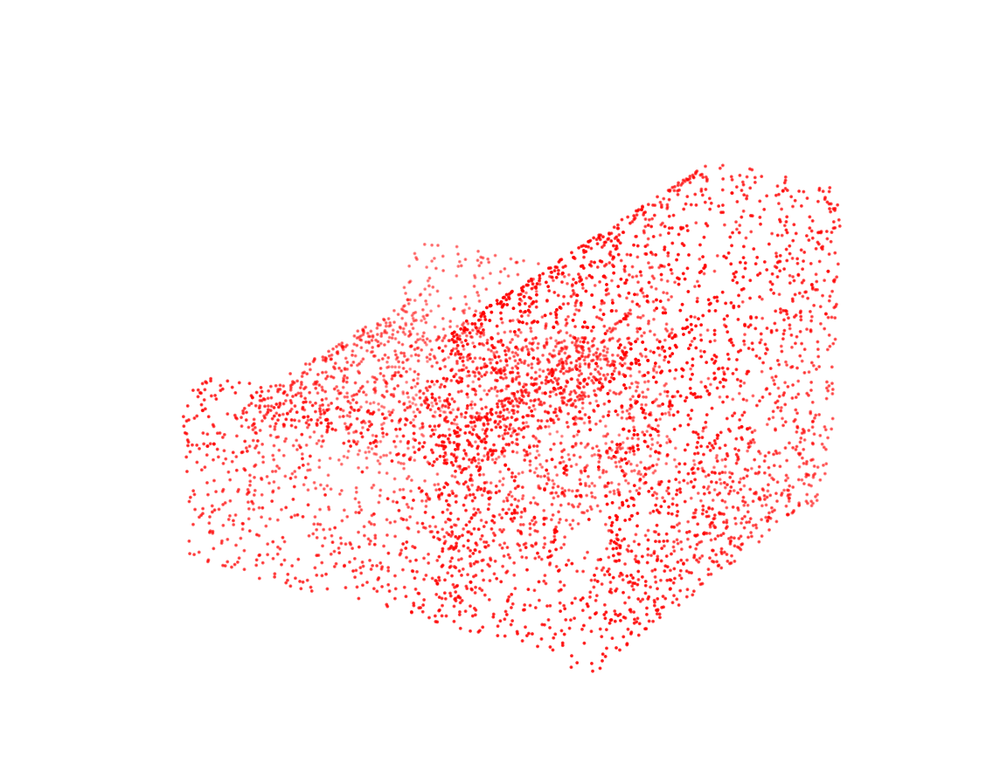

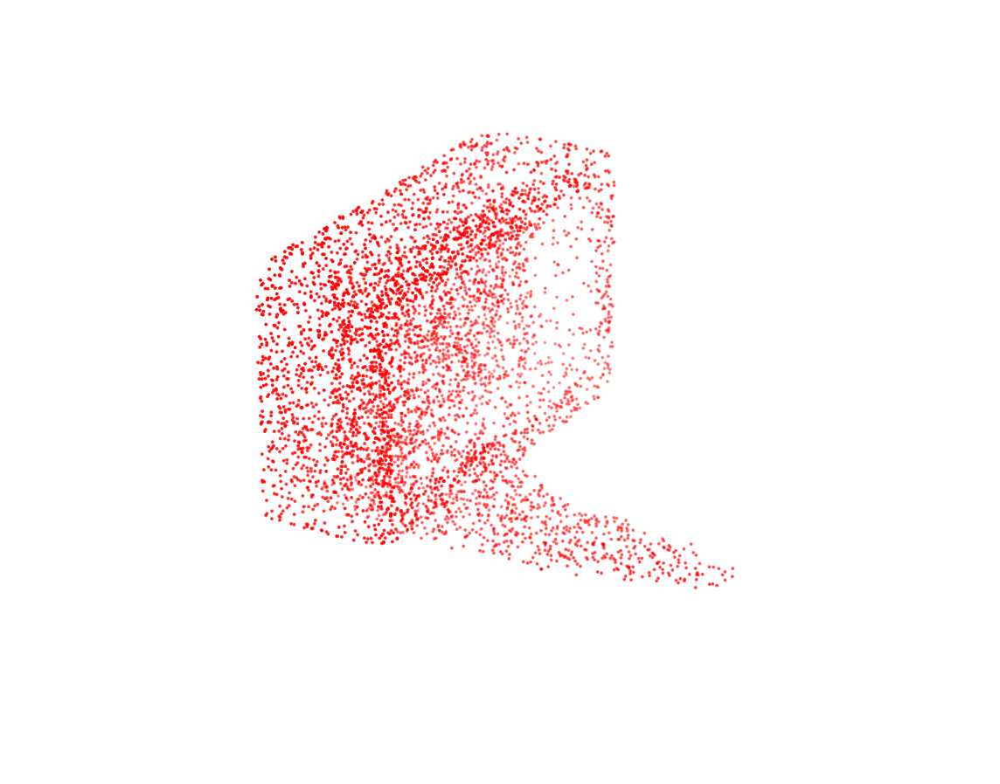

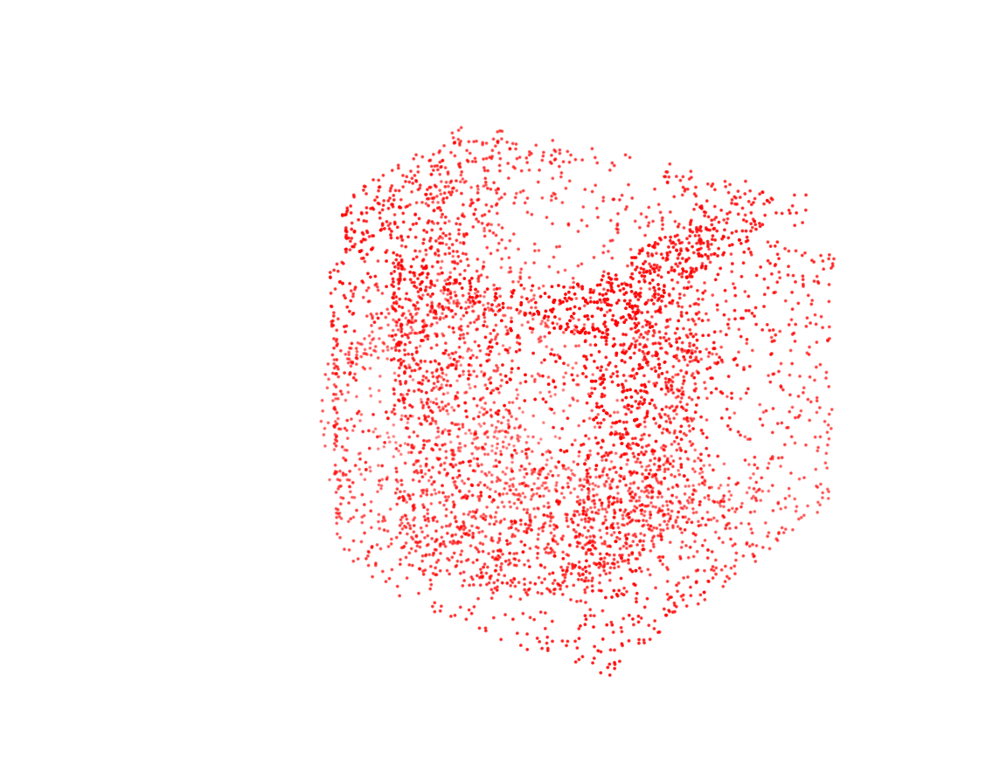

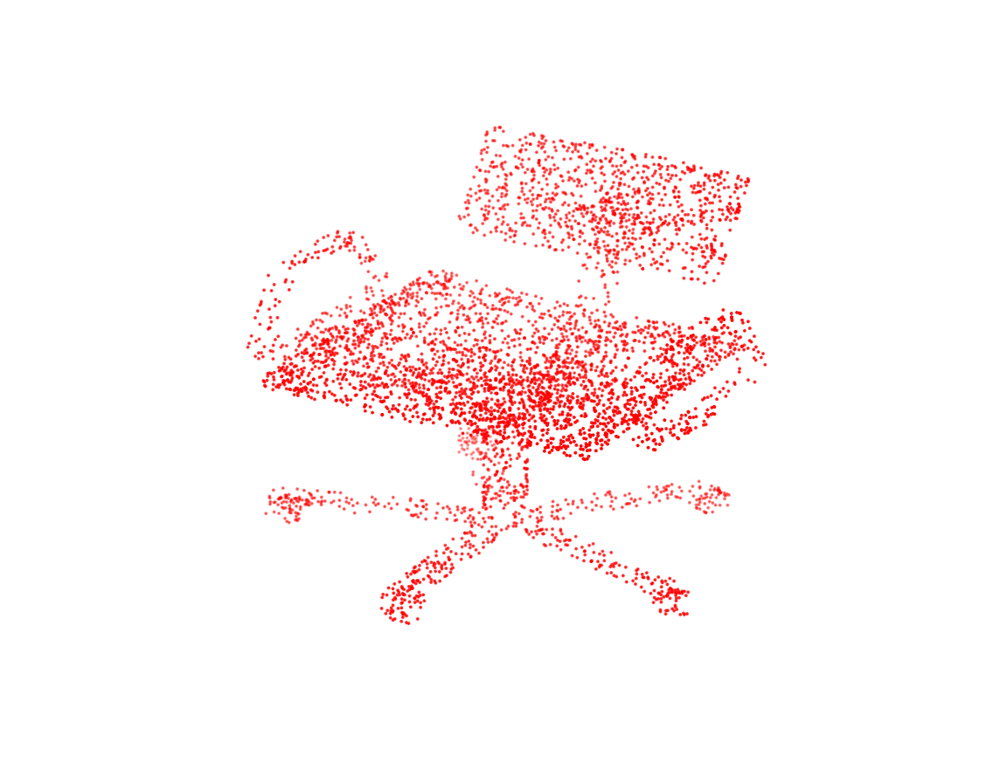

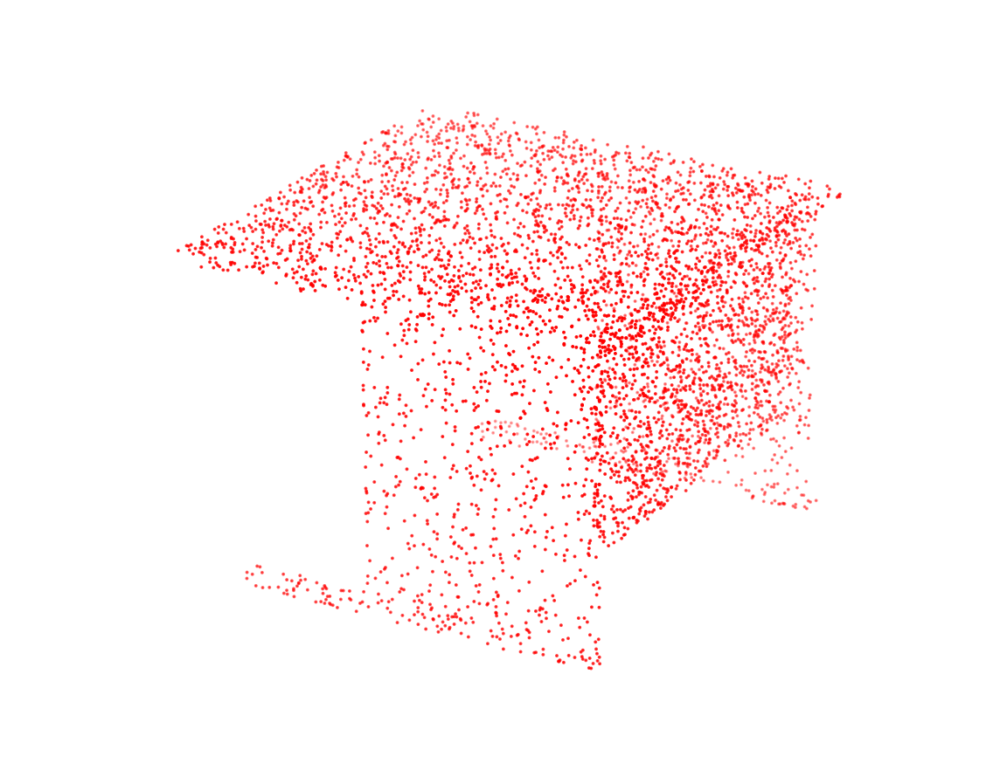

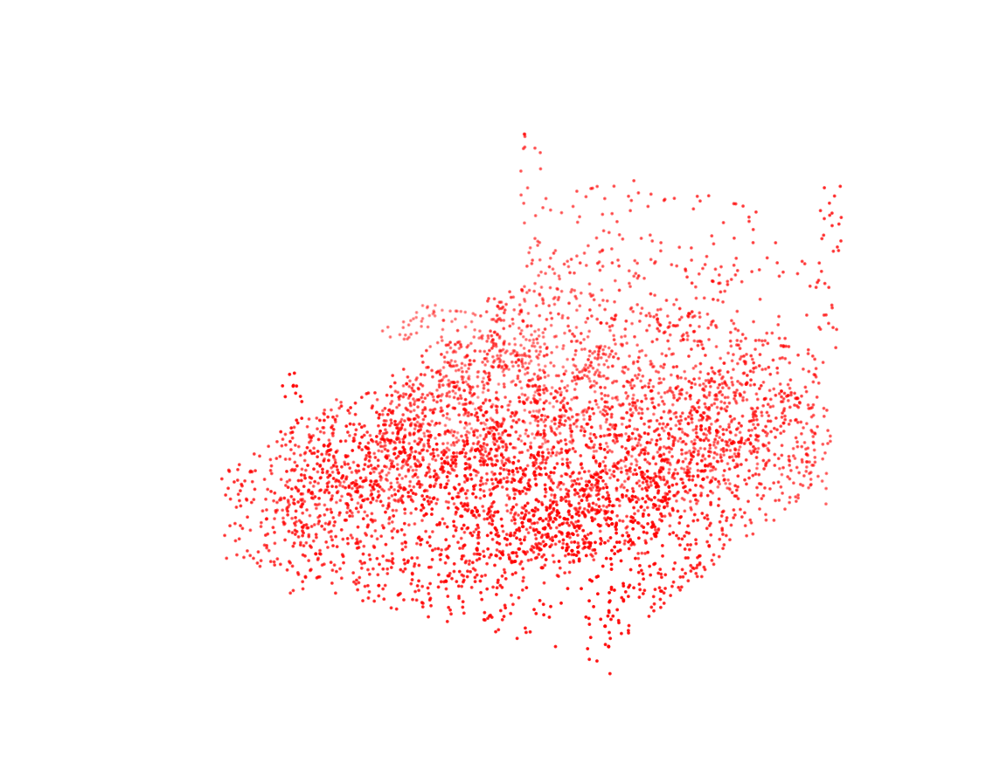

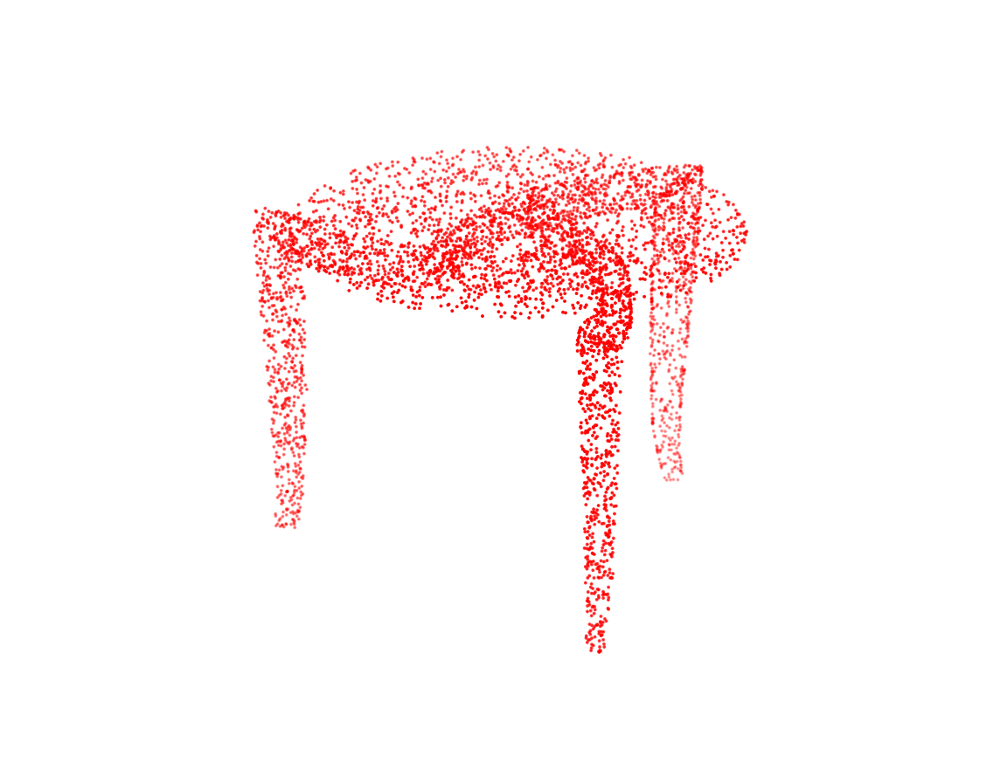

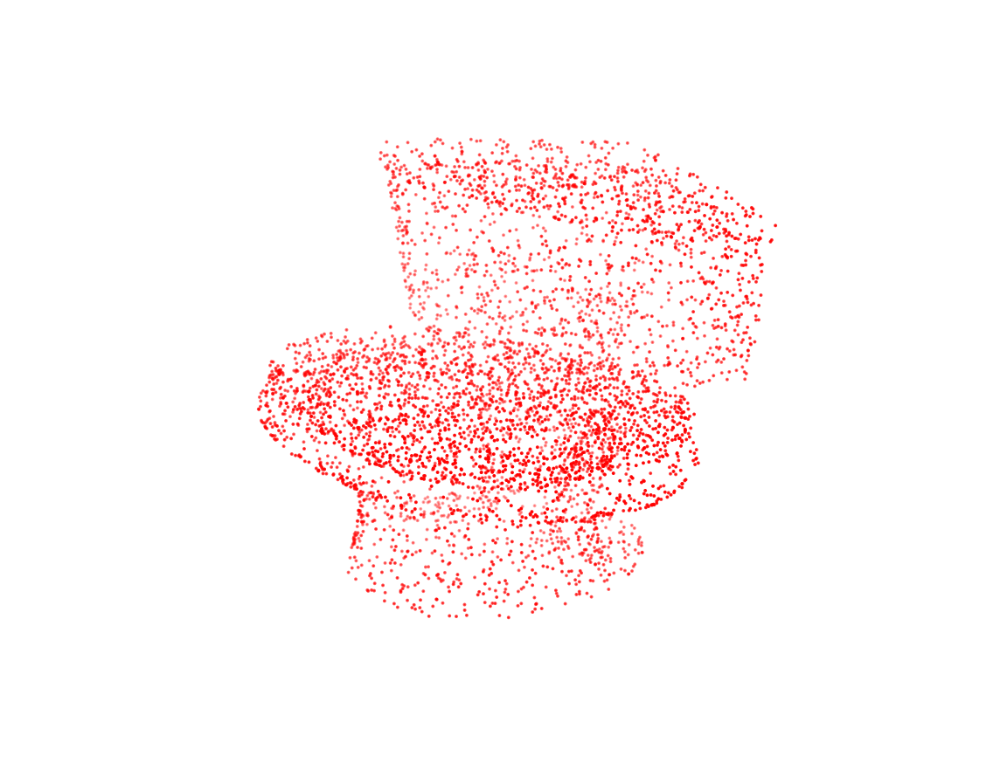

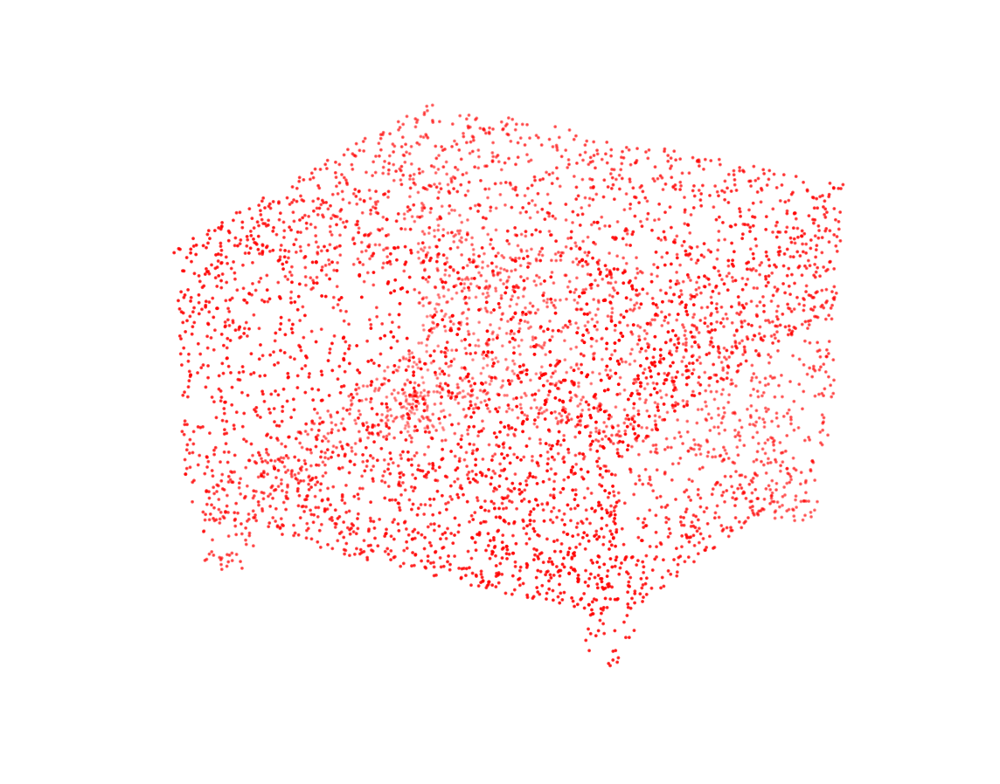

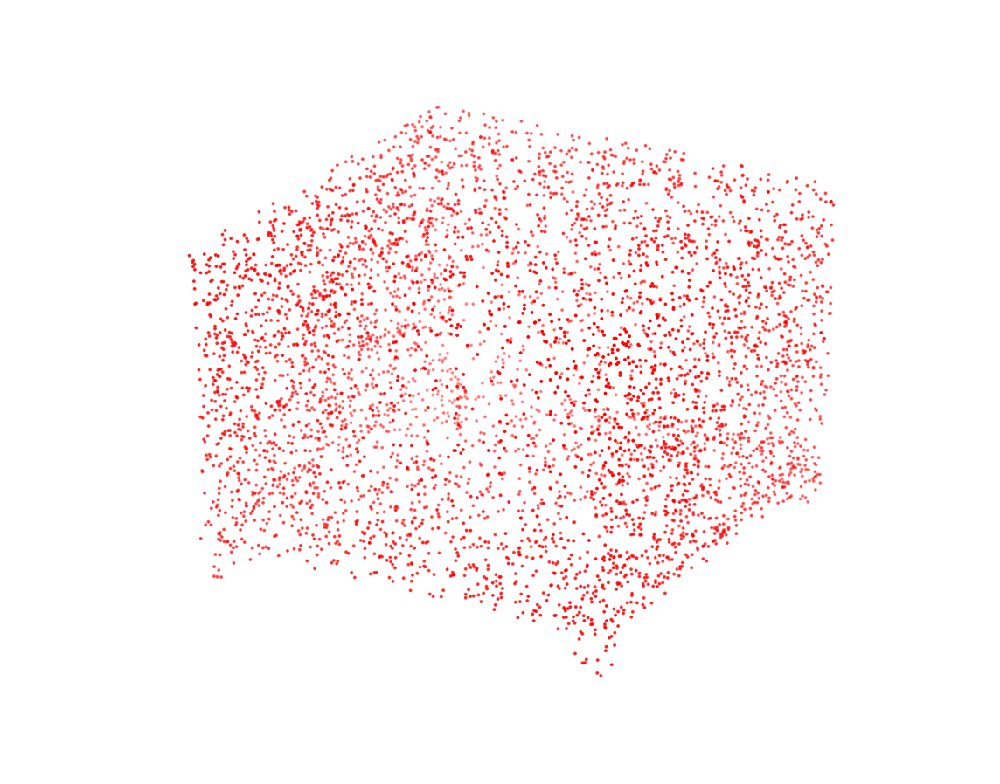

In [14]:
seen_class = set()
for i in range(len(X_train)):
    if y_train[i][0] not in seen_class:
        visualize_npy(X_train[i], save_img_fpath=None)
        seen_class.add(y_train[i][0])

## Train a single AutoDecoder to learn the encodings vector

In [15]:
adnet_HP = HyperParameter(lr=0.001, epochs=4)
adnet_DS = DirectorySetting()

mn_autodecoder, train_encoding_ds, test_encoding_ds, _, _ = return_decoder_train_test_encoding_ds(
    X_train,
    y_train,
    X_test,
    y_test,
    adnet_HP,
    adnet_DS,
    autodecoder=AutoDecoder())

Epoch: 0. batch_idx: 100
Loss:  6034263.330474395 3353674.881667633
Epoch: 1. batch_idx: 100
Loss:  2136251.929312744 2296496.758861389
Epoch: 2. batch_idx: 100
Loss:  3798571.0676361085 1164418.9867840577
Epoch: 3. batch_idx: 100
Loss:  3463862.149872589 1183941.661496582
0 1914909.9 tensor(5.1750, device='cuda:0', grad_fn=<NormBackward0>)
0 1511.9961 tensor(5.1505, device='cuda:0', grad_fn=<NormBackward0>)
0 4590902.5 tensor(5.1172, device='cuda:0', grad_fn=<NormBackward0>)
0 213936.38 tensor(5.1247, device='cuda:0', grad_fn=<NormBackward0>)
0 51997.03 tensor(5.0807, device='cuda:0', grad_fn=<NormBackward0>)
0 52416.652 tensor(5.1664, device='cuda:0', grad_fn=<NormBackward0>)
0 16412.191 tensor(5.1233, device='cuda:0', grad_fn=<NormBackward0>)
0 44789.133 tensor(5.1359, device='cuda:0', grad_fn=<NormBackward0>)
0 48412.695 tensor(5.1144, device='cuda:0', grad_fn=<NormBackward0>)
0 1152.2428 tensor(5.1428, device='cuda:0', grad_fn=<NormBackward0>)
0 2730.237 tensor(5.0381, device='cud

0 3656.7083 tensor(5.1842, device='cuda:0', grad_fn=<NormBackward0>)
0 440.11603 tensor(5.1432, device='cuda:0', grad_fn=<NormBackward0>)
0 346.661 tensor(5.1678, device='cuda:0', grad_fn=<NormBackward0>)
0 45633.918 tensor(5.2263, device='cuda:0', grad_fn=<NormBackward0>)
0 835.6147 tensor(5.1801, device='cuda:0', grad_fn=<NormBackward0>)
0 1821.5581 tensor(5.1706, device='cuda:0', grad_fn=<NormBackward0>)
0 8918.835 tensor(5.1045, device='cuda:0', grad_fn=<NormBackward0>)
0 385.41174 tensor(5.1185, device='cuda:0', grad_fn=<NormBackward0>)
0 618.8248 tensor(5.1658, device='cuda:0', grad_fn=<NormBackward0>)
0 675.9217 tensor(5.3058, device='cuda:0', grad_fn=<NormBackward0>)
0 1949.984 tensor(5.1996, device='cuda:0', grad_fn=<NormBackward0>)
0 4887.649 tensor(5.1850, device='cuda:0', grad_fn=<NormBackward0>)
0 1130.9396 tensor(5.0837, device='cuda:0', grad_fn=<NormBackward0>)
0 9513.016 tensor(5.1879, device='cuda:0', grad_fn=<NormBackward0>)
0 13837.468 tensor(5.1261, device='cuda:0',

0 2013.4268 tensor(5.1070, device='cuda:0', grad_fn=<NormBackward0>)
0 20465.938 tensor(5.1568, device='cuda:0', grad_fn=<NormBackward0>)
0 405008.4 tensor(5.1616, device='cuda:0', grad_fn=<NormBackward0>)
0 380589.97 tensor(5.1580, device='cuda:0', grad_fn=<NormBackward0>)
0 362.2747 tensor(5.0599, device='cuda:0', grad_fn=<NormBackward0>)
0 1130.4087 tensor(5.1739, device='cuda:0', grad_fn=<NormBackward0>)
0 478.79932 tensor(5.1660, device='cuda:0', grad_fn=<NormBackward0>)
0 2167533.5 tensor(5.1951, device='cuda:0', grad_fn=<NormBackward0>)
0 7548.356 tensor(5.1481, device='cuda:0', grad_fn=<NormBackward0>)
0 4595.9316 tensor(5.0720, device='cuda:0', grad_fn=<NormBackward0>)
0 485.28064 tensor(5.1078, device='cuda:0', grad_fn=<NormBackward0>)
0 1979.8127 tensor(5.0966, device='cuda:0', grad_fn=<NormBackward0>)
0 645.885 tensor(5.1365, device='cuda:0', grad_fn=<NormBackward0>)
0 265.1628 tensor(5.1040, device='cuda:0', grad_fn=<NormBackward0>)
0 521.9283 tensor(5.1787, device='cuda:0

0 8746.694 tensor(5.1702, device='cuda:0', grad_fn=<NormBackward0>)
0 3145.8313 tensor(5.1343, device='cuda:0', grad_fn=<NormBackward0>)
0 1629.0134 tensor(5.1286, device='cuda:0', grad_fn=<NormBackward0>)
0 3957.536 tensor(5.1587, device='cuda:0', grad_fn=<NormBackward0>)
0 1632.3519 tensor(5.1306, device='cuda:0', grad_fn=<NormBackward0>)
0 1620.5791 tensor(5.0698, device='cuda:0', grad_fn=<NormBackward0>)
0 96361.88 tensor(5.1302, device='cuda:0', grad_fn=<NormBackward0>)
0 3717.2861 tensor(5.1447, device='cuda:0', grad_fn=<NormBackward0>)
0 945.6749 tensor(5.1803, device='cuda:0', grad_fn=<NormBackward0>)
0 1944.4813 tensor(5.1183, device='cuda:0', grad_fn=<NormBackward0>)
0 31592858.0 tensor(5.1295, device='cuda:0', grad_fn=<NormBackward0>)
0 413.43515 tensor(5.1173, device='cuda:0', grad_fn=<NormBackward0>)
0 3512702.2 tensor(5.1661, device='cuda:0', grad_fn=<NormBackward0>)
0 3552869.0 tensor(5.2152, device='cuda:0', grad_fn=<NormBackward0>)
0 1336.5406 tensor(5.1582, device='cu

0 8437.6875 tensor(5.1181, device='cuda:0', grad_fn=<NormBackward0>)
0 6399.7217 tensor(5.1156, device='cuda:0', grad_fn=<NormBackward0>)
0 3232.4778 tensor(5.1014, device='cuda:0', grad_fn=<NormBackward0>)
0 211286.81 tensor(5.1483, device='cuda:0', grad_fn=<NormBackward0>)
0 1393.426 tensor(5.0982, device='cuda:0', grad_fn=<NormBackward0>)
0 15997.913 tensor(5.1463, device='cuda:0', grad_fn=<NormBackward0>)
0 350694.8 tensor(5.1007, device='cuda:0', grad_fn=<NormBackward0>)
0 275.50247 tensor(5.1770, device='cuda:0', grad_fn=<NormBackward0>)
0 909.7333 tensor(5.0935, device='cuda:0', grad_fn=<NormBackward0>)
0 224.21056 tensor(5.1816, device='cuda:0', grad_fn=<NormBackward0>)
0 296.0484 tensor(5.0971, device='cuda:0', grad_fn=<NormBackward0>)
0 209758.7 tensor(5.0745, device='cuda:0', grad_fn=<NormBackward0>)
0 6791.4165 tensor(5.1757, device='cuda:0', grad_fn=<NormBackward0>)
0 1071.9287 tensor(5.0618, device='cuda:0', grad_fn=<NormBackward0>)
0 8181865.5 tensor(5.1921, device='cuda

0 253.29094 tensor(5.2156, device='cuda:0', grad_fn=<NormBackward0>)
0 585703.5 tensor(5.1464, device='cuda:0', grad_fn=<NormBackward0>)
0 3891.7803 tensor(5.1011, device='cuda:0', grad_fn=<NormBackward0>)
0 18316010.0 tensor(5.0884, device='cuda:0', grad_fn=<NormBackward0>)
0 3965.0579 tensor(5.0611, device='cuda:0', grad_fn=<NormBackward0>)
0 294819.7 tensor(5.2217, device='cuda:0', grad_fn=<NormBackward0>)
0 22993.482 tensor(5.1344, device='cuda:0', grad_fn=<NormBackward0>)
0 24125.717 tensor(5.1449, device='cuda:0', grad_fn=<NormBackward0>)
0 3389.8638 tensor(5.1011, device='cuda:0', grad_fn=<NormBackward0>)
0 4554.9844 tensor(5.2247, device='cuda:0', grad_fn=<NormBackward0>)
0 370.45636 tensor(5.1814, device='cuda:0', grad_fn=<NormBackward0>)
0 214.01889 tensor(5.1119, device='cuda:0', grad_fn=<NormBackward0>)
0 1094.9266 tensor(5.1302, device='cuda:0', grad_fn=<NormBackward0>)
0 31918.924 tensor(5.1234, device='cuda:0', grad_fn=<NormBackward0>)
0 586345.9 tensor(5.0943, device='c

## Train Single CompNet on ModelNet10 Data

In [16]:
# train the compnet
HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)
mn_compnet = train_compnet(HP, DS,
                           train_ds=train_encoding_ds,
                           save_wt_fname='mnet_compnet.pth',)

Epoch: 0. batch_idx: 100
Loss:  0.6178225046396255 0.7469002795219422
Epoch: 0. batch_idx: 200
Loss:  0.6362683391571045 0.6970484662055969
Epoch: 1. batch_idx: 100
Loss:  0.6452619397640228 0.6775444567203521
Epoch: 1. batch_idx: 200
Loss:  0.6412589821219444 0.6507117283344269
Epoch: 2. batch_idx: 100
Loss:  0.6456160661578179 0.6515183696150779
Epoch: 2. batch_idx: 200
Loss:  0.6337504410743713 0.6451549929380417
Epoch: 3. batch_idx: 100
Loss:  0.6254651403427124 0.6455638083815575
Epoch: 3. batch_idx: 200
Loss:  0.6446754828095436 0.6294990509748459
Epoch: 4. batch_idx: 100
Loss:  0.6089457431435585 0.6403671485185624
Epoch: 4. batch_idx: 200
Loss:  0.6481671345233917 0.6305137714743614
Epoch: 5. batch_idx: 100
Loss:  0.6336922281980515 0.6358000549674034
Epoch: 5. batch_idx: 200
Loss:  0.6121419537067413 0.6361867788434029
Epoch: 6. batch_idx: 100
Loss:  0.6106488299369812 0.631843492090702
Epoch: 6. batch_idx: 200
Loss:  0.617042384147644 0.6220784258842468
Epoch: 7. batch_idx: 1

### Single CompNet result on ModelNet10 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.6586068654472563
After 250 batches and 3991 test points

Metrics for the same class:
Avg loss: 0.45262579822540283
Precision: 0.6148403483309144
Recall: 0.8491606113755951
F1 Score: 0.7132484478585711

Metrics for the diff class:
Avg loss: 0.7604410381317138
Precision: 0.7562753036437248
Recall: 0.46805311951891754
F1 Score: 0.578238662745705


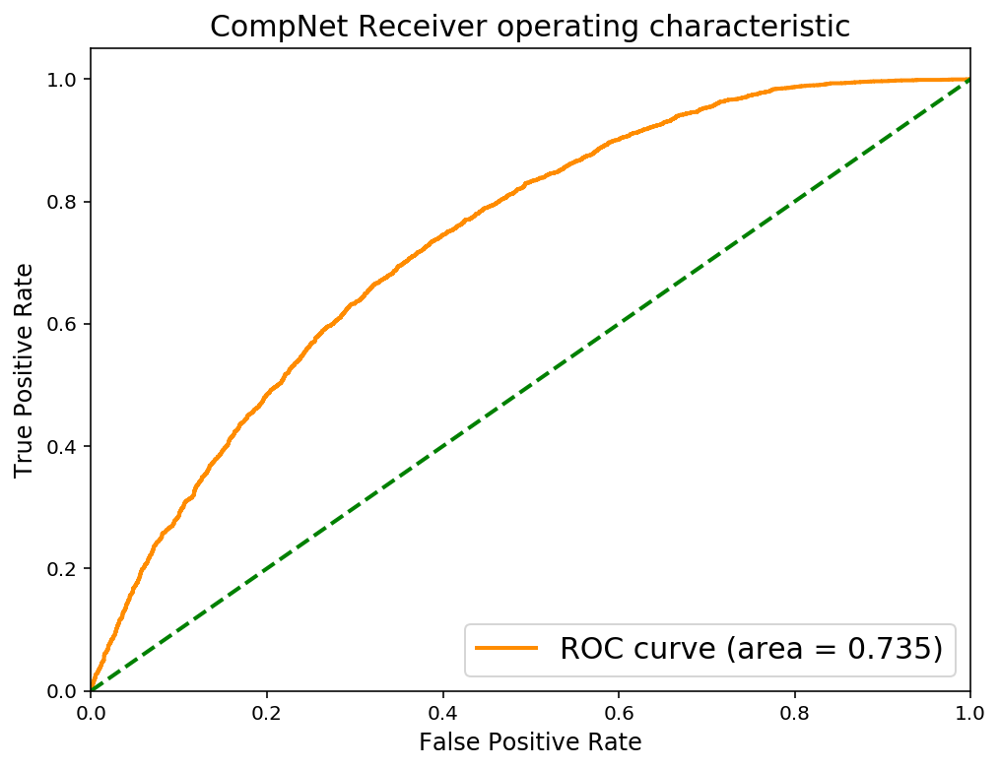

(113.15644955635071,
 190.11025953292847,
 3389.0,
 1868.0,
 602.0,
 2123.0,
 250,
 3991)

In [17]:
# Train set results
eval_compnet(mn_compnet, train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.6343612334801763
After 57 batches and 908 test points

Metrics for the same class:
Avg loss: 0.49074665757647734
Precision: 0.5953125
Recall: 0.8392070484581498
F1 Score: 0.6965265082266909

Metrics for the diff class:
Avg loss: 0.8145852329438192
Precision: 0.7276119402985075
Recall: 0.42951541850220265
F1 Score: 0.5401662049861496


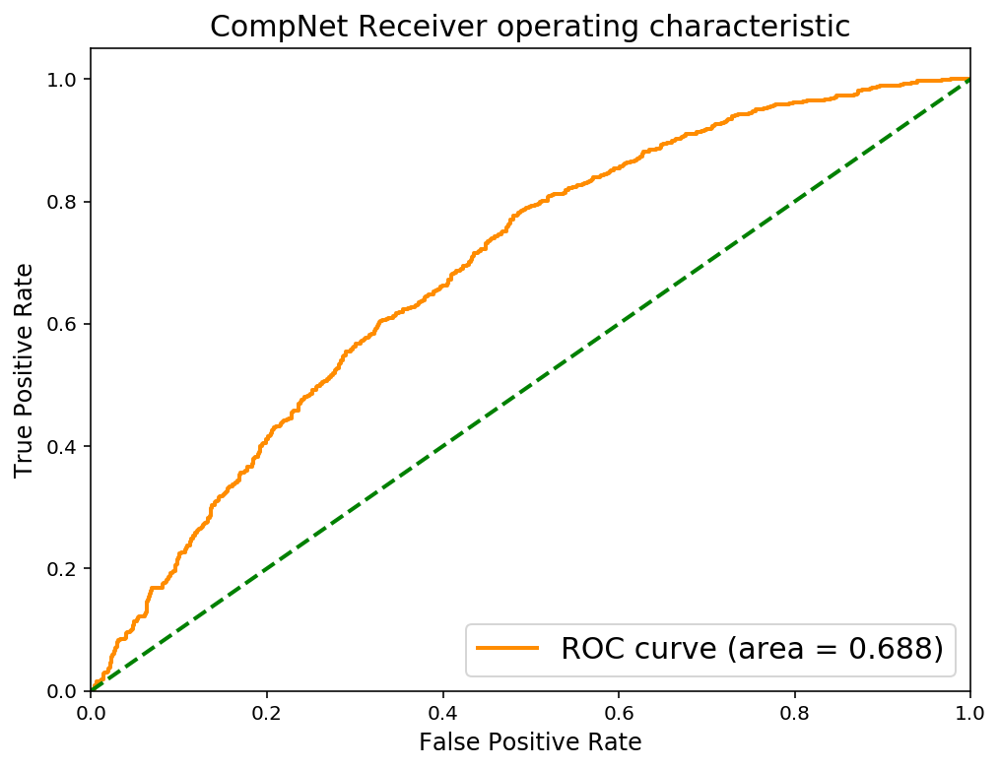

(27.972559481859207, 46.4313582777977, 762.0, 390.0, 146.0, 518.0, 57, 908)

In [18]:
# Test set results
eval_compnet(mn_compnet, test_encoding_ds)

### Train Ensemble CompNet1 on ModelNet10 Data

In [19]:
ensemble_HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)

# Train with the ensemble net
ensemble1 = train_compnet(ensemble_HP, DS,
                           train_ds=train_encoding_ds,
                           save_wt_fname='mnet_ensemble1.pth',
                           compnet=EnsembleCompNet())

Epoch: 0. batch_idx: 100
Loss:  0.8273249036073684 0.5889202100038529
Epoch: 0. batch_idx: 200
Loss:  0.7231337213516236 0.6619264388084412


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.6611132955551148 0.732459824681282
Epoch: 1. batch_idx: 200
Loss:  0.6389287954568863 0.7334102803468704
Epoch: 2. batch_idx: 100
Loss:  0.6260892635583878 0.7426053732633591
Epoch: 2. batch_idx: 200
Loss:  0.6016596966981888 0.739631078839302
Epoch: 3. batch_idx: 100
Loss:  0.5883301094174385 0.7342198359966278
Epoch: 3. batch_idx: 200
Loss:  0.5635903215408326 0.7289125323295593
Epoch: 4. batch_idx: 100
Loss:  0.5719422695040702 0.7112567627429962
Epoch: 4. batch_idx: 200
Loss:  0.542807258963585 0.7067249339818954
Epoch: 5. batch_idx: 100
Loss:  0.5545351645350456 0.6934617978334426
Epoch: 5. batch_idx: 200
Loss:  0.5497428777813912 0.6674203214049339
Epoch: 6. batch_idx: 100
Loss:  0.5553560662269592 0.6762764757871628
Epoch: 6. batch_idx: 200
Loss:  0.5211805075407028 0.6544025635719299
Epoch: 7. batch_idx: 100
Loss:  0.533266983628273 0.6812295654416084
Epoch: 7. batch_idx: 200
Loss:  0.549257176220417 0.5950372922420502
Epoch: 8. batch_idx: 100


### Evaluate Ensemble CompNet1 on ModelNet10 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.8043096968178401
After 250 batches and 3991 test points

Metrics for the same class:
Avg loss: 0.38691971158981325
Precision: 0.7748359357320661
Recall: 0.8579303432723628
F1 Score: 0.8142687277051129

Metrics for the diff class:
Avg loss: 0.529491416811943
Precision: 0.8408644400785854
Recall: 0.7506890503633175
F1 Score: 0.7932221339687583


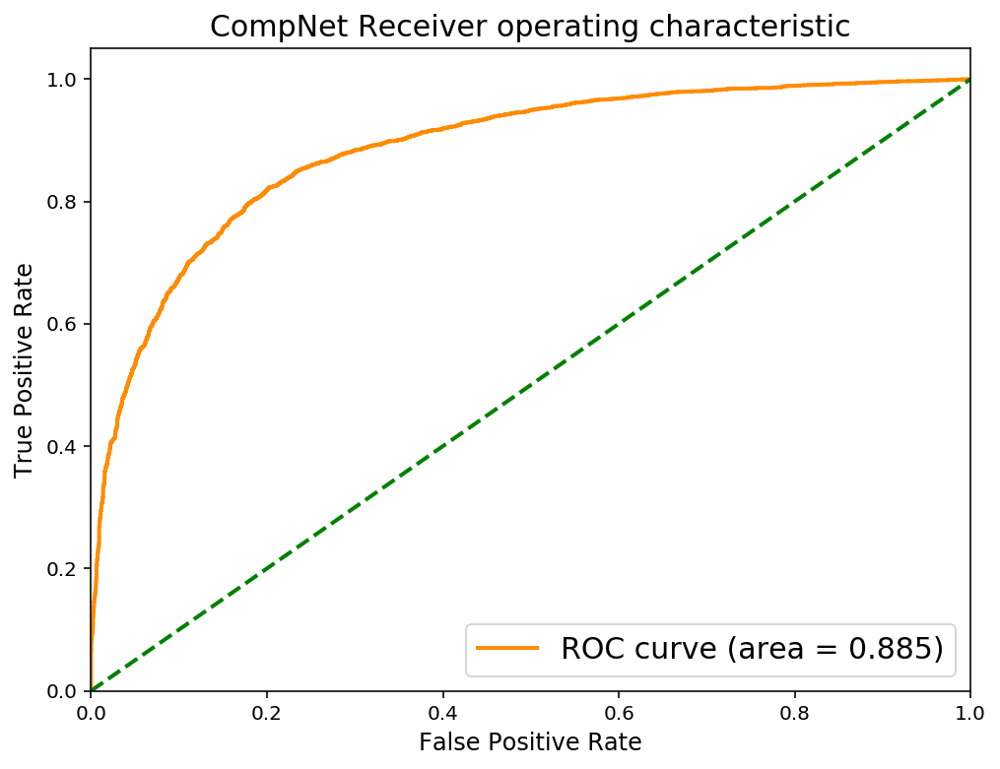

(96.72992789745331,
 132.37285420298576,
 3424.0,
 2996.0,
 567.0,
 995.0,
 250,
 3991)

In [20]:
# Train set results
eval_compnet(ensemble1, train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.7731277533039648
After 57 batches and 908 test points

Metrics for the same class:
Avg loss: 0.3859448385866065
Precision: 0.738003838771593
Recall: 0.8469162995594713
F1 Score: 0.7887179487179488

Metrics for the diff class:
Avg loss: 0.5874860511537183
Precision: 0.8204134366925064
Recall: 0.6993392070484582
F1 Score: 0.7550535077288943


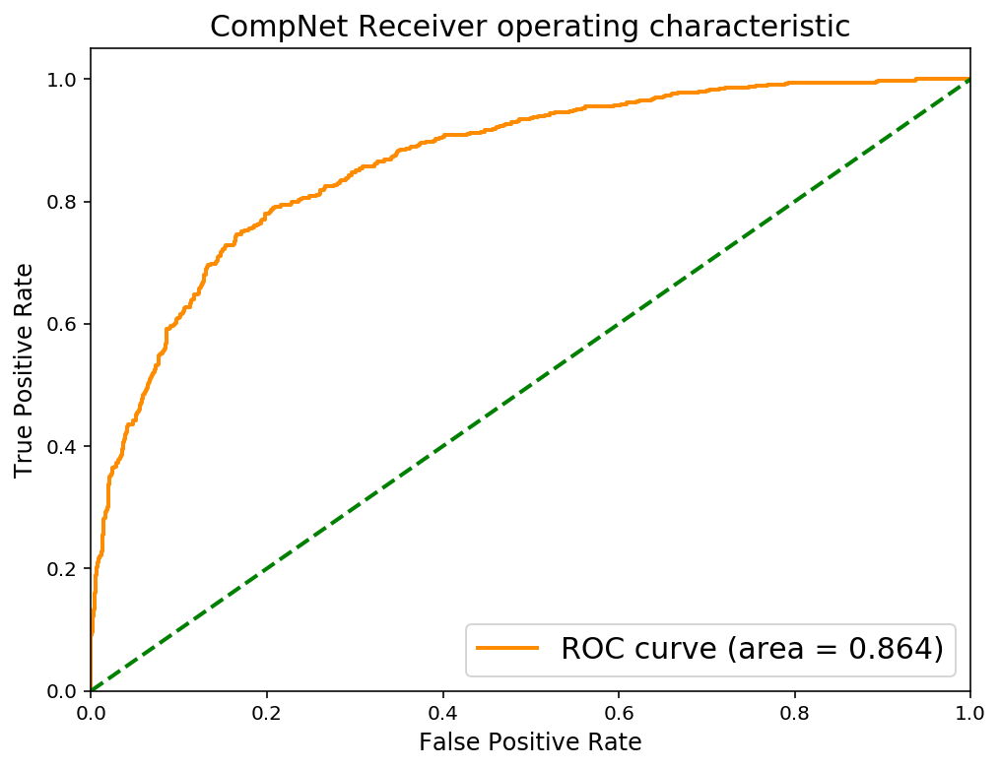

(21.99885579943657, 33.48670491576195, 769.0, 635.0, 139.0, 273.0, 57, 908)

In [21]:
# Test set results
eval_compnet(ensemble1, test_encoding_ds)

## Ensemble AutoDecoder Network

In [22]:
encoding_dim = 256
point_dim = 3
ensemble_adnet = [
    nn.Sequential(
        nn.Conv1d(encoding_dim + point_dim, 64, 1),
        nn.LeakyReLU()),
    nn.Sequential(
        nn.Conv1d(encoding_dim + point_dim, 128, 1),
        nn.LeakyReLU(),
        nn.Conv1d(128, 64, 1),
        nn.LeakyReLU()),
    nn.Sequential(
        nn.Conv1d(encoding_dim + point_dim, 256, 1),
        nn.LeakyReLU(),
        nn.Conv1d(256, 128, 1),
        nn.LeakyReLU(),
        nn.Conv1d(128, 64, 1),
        nn.LeakyReLU()),
    nn.Sequential(
        nn.Conv1d(encoding_dim + point_dim, 512, 1),
        nn.LeakyReLU(),
        nn.Conv1d(512, 256, 1),
        nn.LeakyReLU(),
        nn.Conv1d(256, 128, 1),
        nn.LeakyReLU(),
        nn.Conv1d(128, 64, 1),
        nn.LeakyReLU()),
]

## Train a Ensemble AutoDecoder to learn the encodings vector

In [23]:
ens_adnet_HP = HyperParameter(lr=0.001, epochs=4)
ens_adnet_DS = DirectorySetting()

ens_mn_autodecoder, ens_train_encoding_ds, ens_test_encoding_ds, _, _ = return_decoder_train_test_encoding_ds(
    X_train,
    y_train,
    X_test,
    y_test,
    ens_adnet_HP,
    ens_adnet_DS,
    autodecoder=EnsembleAutoDecoder(ensemble_adnet))

Epoch: 0. batch_idx: 100
Loss:  2592725.4246673584 6386821.382166748


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  1627026.6973610688 5506687.676568603
Epoch: 2. batch_idx: 100
Loss:  2315004.8734765626 5749084.839530029
Epoch: 3. batch_idx: 100
Loss:  1169495.8810723878 4984825.107083282
0 163.12279 tensor(5.2413, device='cuda:0', grad_fn=<NormBackward0>)
0 4164220.8 tensor(5.1249, device='cuda:0', grad_fn=<NormBackward0>)
0 1205.257 tensor(5.0809, device='cuda:0', grad_fn=<NormBackward0>)
0 762.8083 tensor(5.0873, device='cuda:0', grad_fn=<NormBackward0>)
0 24547.28 tensor(5.1600, device='cuda:0', grad_fn=<NormBackward0>)
0 23220.928 tensor(5.1118, device='cuda:0', grad_fn=<NormBackward0>)
0 490.10526 tensor(5.0692, device='cuda:0', grad_fn=<NormBackward0>)
0 68832.086 tensor(5.1140, device='cuda:0', grad_fn=<NormBackward0>)
0 914.8764 tensor(5.1230, device='cuda:0', grad_fn=<NormBackward0>)
0 358766.03 tensor(5.0759, device='cuda:0', grad_fn=<NormBackward0>)
0 4916.64 tensor(5.0428, device='cuda:0', grad_fn=<NormBackward0>)
0 35439.18 tensor(5.1179, device='cuda:0

0 126422.266 tensor(5.1005, device='cuda:0', grad_fn=<NormBackward0>)
0 5083.0713 tensor(5.1034, device='cuda:0', grad_fn=<NormBackward0>)
0 1752.2996 tensor(5.0744, device='cuda:0', grad_fn=<NormBackward0>)
0 464.4295 tensor(5.0174, device='cuda:0', grad_fn=<NormBackward0>)
0 4977.654 tensor(5.1256, device='cuda:0', grad_fn=<NormBackward0>)
0 54570.344 tensor(5.1848, device='cuda:0', grad_fn=<NormBackward0>)
0 432.9182 tensor(5.0710, device='cuda:0', grad_fn=<NormBackward0>)
0 714.6937 tensor(5.1202, device='cuda:0', grad_fn=<NormBackward0>)
0 473.60062 tensor(5.1232, device='cuda:0', grad_fn=<NormBackward0>)
0 971.40607 tensor(5.0792, device='cuda:0', grad_fn=<NormBackward0>)
0 530.05585 tensor(5.0434, device='cuda:0', grad_fn=<NormBackward0>)
0 458.40115 tensor(5.1572, device='cuda:0', grad_fn=<NormBackward0>)
0 18130.893 tensor(5.0452, device='cuda:0', grad_fn=<NormBackward0>)
0 6699.647 tensor(5.1621, device='cuda:0', grad_fn=<NormBackward0>)
0 404.9277 tensor(5.1731, device='cuda

0 3315.9915 tensor(5.1300, device='cuda:0', grad_fn=<NormBackward0>)
0 134446.23 tensor(5.1615, device='cuda:0', grad_fn=<NormBackward0>)
0 131589.8 tensor(5.0803, device='cuda:0', grad_fn=<NormBackward0>)
0 156.00208 tensor(5.1722, device='cuda:0', grad_fn=<NormBackward0>)
0 264.79184 tensor(5.1698, device='cuda:0', grad_fn=<NormBackward0>)
0 1462.0171 tensor(5.1274, device='cuda:0', grad_fn=<NormBackward0>)
0 350271.1 tensor(5.1213, device='cuda:0', grad_fn=<NormBackward0>)
0 303.27448 tensor(5.1533, device='cuda:0', grad_fn=<NormBackward0>)
0 431.1741 tensor(5.1516, device='cuda:0', grad_fn=<NormBackward0>)
0 73646.98 tensor(5.1345, device='cuda:0', grad_fn=<NormBackward0>)
0 6656.025 tensor(5.0554, device='cuda:0', grad_fn=<NormBackward0>)
0 942.41144 tensor(5.0852, device='cuda:0', grad_fn=<NormBackward0>)
0 175.88739 tensor(5.0888, device='cuda:0', grad_fn=<NormBackward0>)
0 4433504.5 tensor(5.0764, device='cuda:0', grad_fn=<NormBackward0>)
0 44020.44 tensor(5.0002, device='cuda:

0 4015.0386 tensor(5.0684, device='cuda:0', grad_fn=<NormBackward0>)
0 6902.1846 tensor(5.1332, device='cuda:0', grad_fn=<NormBackward0>)
0 4229.98 tensor(5.1919, device='cuda:0', grad_fn=<NormBackward0>)
0 388.82114 tensor(5.1272, device='cuda:0', grad_fn=<NormBackward0>)
0 1330.0239 tensor(5.1388, device='cuda:0', grad_fn=<NormBackward0>)
0 302.74377 tensor(5.1113, device='cuda:0', grad_fn=<NormBackward0>)
0 1195.5289 tensor(5.1778, device='cuda:0', grad_fn=<NormBackward0>)
0 802.44867 tensor(5.2217, device='cuda:0', grad_fn=<NormBackward0>)
0 597.767 tensor(5.1312, device='cuda:0', grad_fn=<NormBackward0>)
0 12435.907 tensor(5.1350, device='cuda:0', grad_fn=<NormBackward0>)
0 9472.914 tensor(5.1969, device='cuda:0', grad_fn=<NormBackward0>)
0 2374447.8 tensor(5.2411, device='cuda:0', grad_fn=<NormBackward0>)
0 2371476.0 tensor(5.1165, device='cuda:0', grad_fn=<NormBackward0>)
0 50867708.0 tensor(5.1873, device='cuda:0', grad_fn=<NormBackward0>)
0 14936.29 tensor(5.0742, device='cuda

0 3203.8354 tensor(5.1727, device='cuda:0', grad_fn=<NormBackward0>)
0 8367.89 tensor(5.0789, device='cuda:0', grad_fn=<NormBackward0>)
0 3189.2397 tensor(5.1356, device='cuda:0', grad_fn=<NormBackward0>)
0 48361.43 tensor(5.2074, device='cuda:0', grad_fn=<NormBackward0>)
0 330028.34 tensor(5.1501, device='cuda:0', grad_fn=<NormBackward0>)
0 51889630.0 tensor(5.1395, device='cuda:0', grad_fn=<NormBackward0>)
0 639.53723 tensor(5.1826, device='cuda:0', grad_fn=<NormBackward0>)
0 626809.44 tensor(5.2164, device='cuda:0', grad_fn=<NormBackward0>)
0 347567.2 tensor(5.1561, device='cuda:0', grad_fn=<NormBackward0>)
0 2553.8638 tensor(5.1931, device='cuda:0', grad_fn=<NormBackward0>)
0 235.54672 tensor(5.1254, device='cuda:0', grad_fn=<NormBackward0>)
0 1503.4188 tensor(5.1581, device='cuda:0', grad_fn=<NormBackward0>)
0 14588.278 tensor(5.0909, device='cuda:0', grad_fn=<NormBackward0>)
0 1430.0638 tensor(5.1904, device='cuda:0', grad_fn=<NormBackward0>)
0 407.92368 tensor(5.0985, device='cu

0 1137.3999 tensor(5.1291, device='cuda:0', grad_fn=<NormBackward0>)
0 715.6743 tensor(5.1373, device='cuda:0', grad_fn=<NormBackward0>)
0 369.6648 tensor(5.1506, device='cuda:0', grad_fn=<NormBackward0>)
0 4497.88 tensor(5.0878, device='cuda:0', grad_fn=<NormBackward0>)
0 372.60803 tensor(5.1249, device='cuda:0', grad_fn=<NormBackward0>)
0 727.21265 tensor(5.0982, device='cuda:0', grad_fn=<NormBackward0>)
0 8750.589 tensor(5.1912, device='cuda:0', grad_fn=<NormBackward0>)
0 9173.302 tensor(5.1478, device='cuda:0', grad_fn=<NormBackward0>)
0 3106.795 tensor(5.1652, device='cuda:0', grad_fn=<NormBackward0>)
0 289.41562 tensor(5.0441, device='cuda:0', grad_fn=<NormBackward0>)
0 222.91585 tensor(5.2478, device='cuda:0', grad_fn=<NormBackward0>)
0 3552.4175 tensor(5.1162, device='cuda:0', grad_fn=<NormBackward0>)
0 1007.43066 tensor(5.0466, device='cuda:0', grad_fn=<NormBackward0>)
0 528.17847 tensor(5.1201, device='cuda:0', grad_fn=<NormBackward0>)
0 3848.3313 tensor(5.1252, device='cuda:

## Train single CompNet on ModelNet10 Data

In [24]:
# train the compnet
HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)
ens_mn_compnet = train_compnet(HP, DS,
                           train_ds=ens_train_encoding_ds,
                           save_wt_fname='mnet_compnet.pth',)

Epoch: 0. batch_idx: 100
Loss:  0.6060150480270385 0.7513565629720688
Epoch: 0. batch_idx: 200
Loss:  0.6324635988473892 0.67190868973732
Epoch: 1. batch_idx: 100
Loss:  0.6417033123970032 0.6526713013648987
Epoch: 1. batch_idx: 200
Loss:  0.6194838017225266 0.6440808442234993
Epoch: 2. batch_idx: 100
Loss:  0.6130388635396957 0.6524769604206085
Epoch: 2. batch_idx: 200
Loss:  0.6291871899366379 0.6296185407042504
Epoch: 3. batch_idx: 100
Loss:  0.6133721071481705 0.6344611325860023
Epoch: 3. batch_idx: 200
Loss:  0.6117577922344207 0.6298721444606781
Epoch: 4. batch_idx: 100
Loss:  0.6105257478356362 0.6283020091056823
Epoch: 4. batch_idx: 200
Loss:  0.5994959372282028 0.6285910162329674
Epoch: 5. batch_idx: 100
Loss:  0.5908984333276749 0.6206690242886543
Epoch: 5. batch_idx: 200
Loss:  0.6103793036937714 0.6172729805111885
Epoch: 6. batch_idx: 100
Loss:  0.6017212271690369 0.6295822122693062
Epoch: 6. batch_idx: 200
Loss:  0.5843985533714294 0.6116083067655563
Epoch: 7. batch_idx: 1

## Evaluate single CompNet on ModelNet10 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.7042094713104485
After 250 batches and 3991 test points

Metrics for the same class:
Avg loss: 0.6423604040145874
Precision: 0.7161803713527851
Recall: 0.6765221748935104
F1 Score: 0.6957866254348666

Metrics for the diff class:
Avg loss: 0.47421520245075227
Precision: 0.6934947768281101
Recall: 0.7318967677273867
F1 Score: 0.7121784712909911


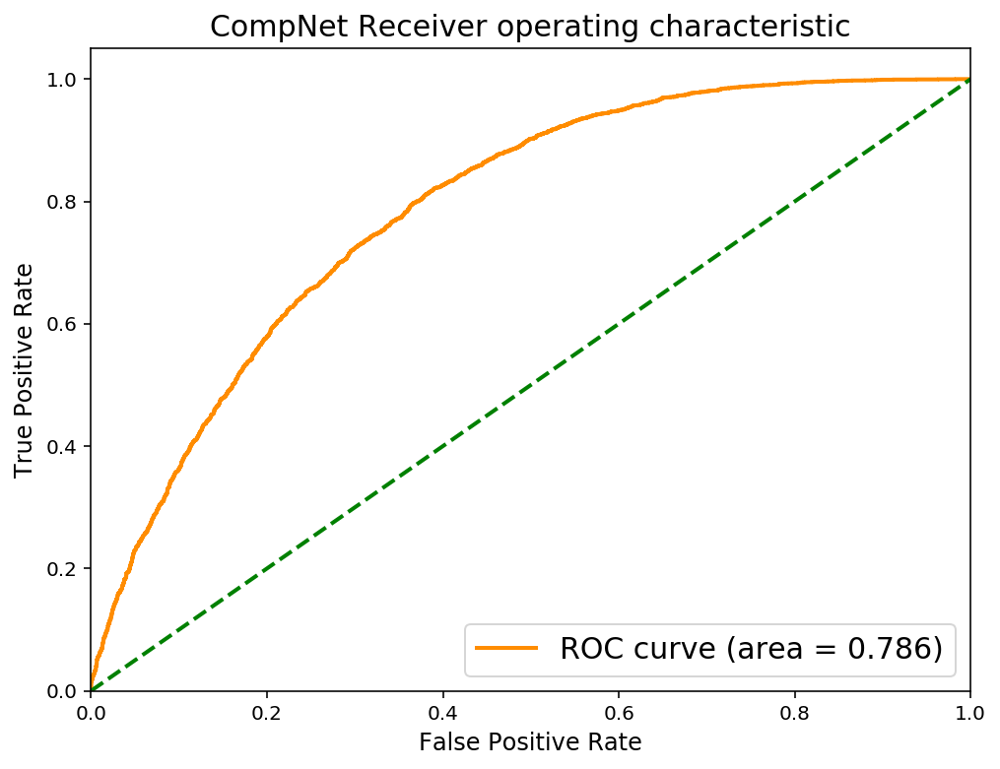

(160.59010100364685,
 118.55380061268806,
 2700.0,
 2921.0,
 1291.0,
 1070.0,
 250,
 3991)

In [25]:
# Train set results
eval_compnet(ens_mn_compnet, ens_train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.6481277533039648
After 57 batches and 908 test points

Metrics for the same class:
Avg loss: 0.7473225530825163
Precision: 0.6709021601016518
Recall: 0.5814977973568282
F1 Score: 0.623008849557522

Metrics for the diff class:
Avg loss: 0.48743335144561634
Precision: 0.630709426627794
Recall: 0.7147577092511013
F1 Score: 0.670108415074858


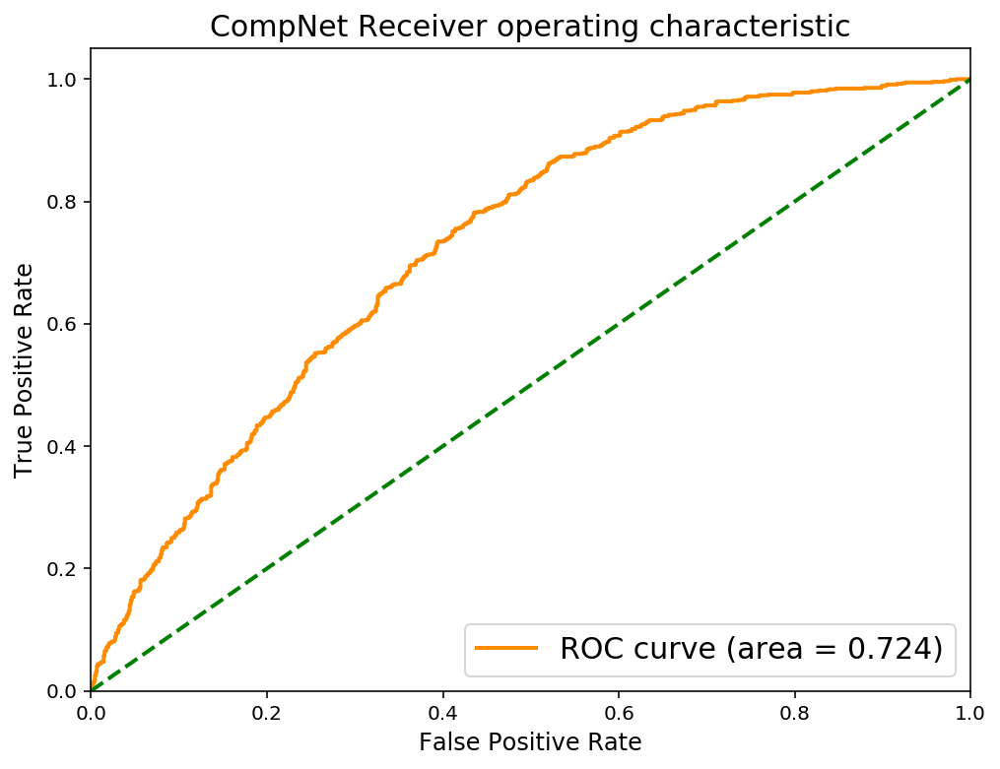

(42.59738552570343, 27.78370103240013, 528.0, 649.0, 380.0, 259.0, 57, 908)

In [26]:
# Test set results
eval_compnet(ens_mn_compnet, ens_test_encoding_ds)

## Train Ensemble CompNet on ModelNet10 Data

In [27]:
ensemble_HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)

# Train with the ensemble net
ensemble1 = train_compnet(ensemble_HP, DS,
                          train_ds=ens_train_encoding_ds,
                          save_wt_fname='mnet_ensemble1.pth',
                          compnet=EnsembleCompNet())

Epoch: 0. batch_idx: 100
Loss:  0.8225317269563674 0.5927107036113739
Epoch: 0. batch_idx: 200
Loss:  0.7145665019750596 0.6695973861217499


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.6515426307916641 0.7381796818971634
Epoch: 1. batch_idx: 200
Loss:  0.6380579382181167 0.7302328741550446
Epoch: 2. batch_idx: 100
Loss:  0.6187639200687408 0.7415636223554611
Epoch: 2. batch_idx: 200
Loss:  0.5867885303497314 0.7296348202228546
Epoch: 3. batch_idx: 100
Loss:  0.5699068713188171 0.7122515892982483
Epoch: 3. batch_idx: 200
Loss:  0.5369805854558944 0.7064126002788543
Epoch: 4. batch_idx: 100
Loss:  0.5255621373653412 0.6749042993783951
Epoch: 4. batch_idx: 200
Loss:  0.5004803049564361 0.7031697079539299
Epoch: 5. batch_idx: 100
Loss:  0.4941221860051155 0.6678197127580643
Epoch: 5. batch_idx: 200
Loss:  0.4899154406785965 0.6490680694580078
Epoch: 6. batch_idx: 100
Loss:  0.516564028263092 0.6261428266763687
Epoch: 6. batch_idx: 200
Loss:  0.45827175498008726 0.6152069017291069
Epoch: 7. batch_idx: 100
Loss:  0.46489093095064166 0.6101983234286308
Epoch: 7. batch_idx: 200
Loss:  0.47595610409975053 0.6077322700619697
Epoch: 8. batch_id

## Evaluate Ensemble CompNet on ModelNet10 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.8055625156602355
After 250 batches and 3991 test points

Metrics for the same class:
Avg loss: 0.5089185843467713
Precision: 0.8407376362112322
Recall: 0.7539463793535455
F1 Score: 0.7949801849405549

Metrics for the diff class:
Avg loss: 0.3823276931345463
Precision: 0.7769702475584829
Recall: 0.8571786519669256
F1 Score: 0.8151060281153204


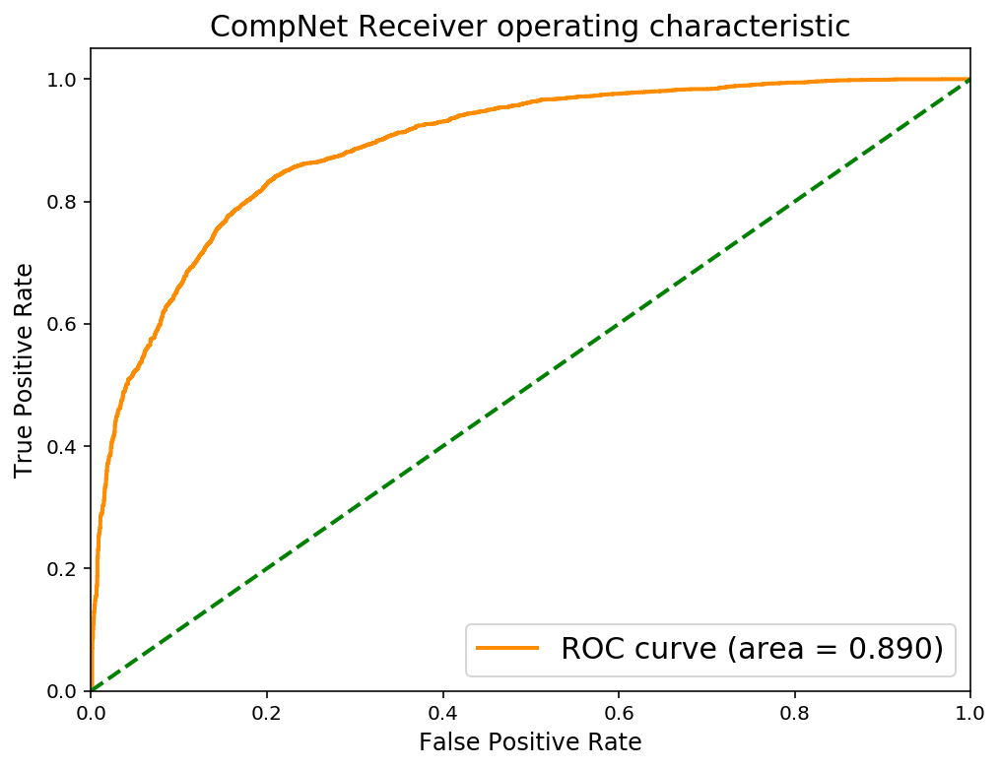

(127.22964608669281,
 95.58192328363657,
 3009.0,
 3421.0,
 982.0,
 570.0,
 250,
 3991)

In [28]:
# Train set results
eval_compnet(ensemble1, ens_train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.7979074889867841
After 57 batches and 908 test points

Metrics for the same class:
Avg loss: 0.5019072908581349
Precision: 0.8335388409371147
Recall: 0.7444933920704846
F1 Score: 0.7865037812681792

Metrics for the diff class:
Avg loss: 0.3904266701194278
Precision: 0.7691542288557214
Recall: 0.8513215859030837
F1 Score: 0.8081547307893361


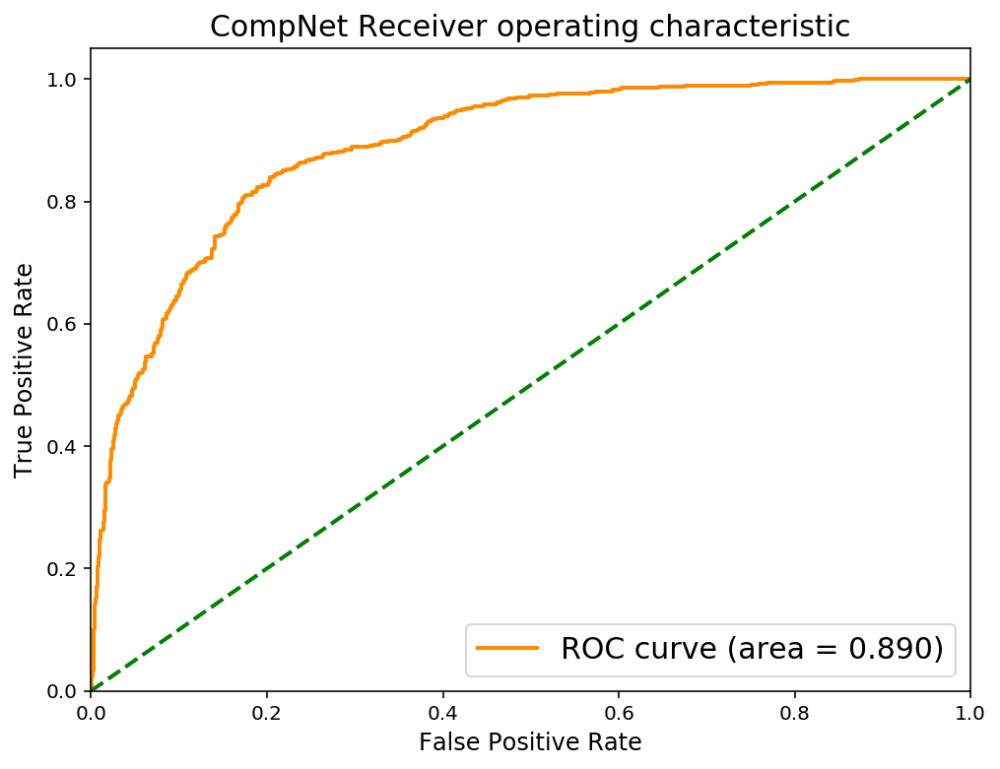

(28.60871557891369, 22.254320196807384, 676.0, 773.0, 232.0, 135.0, 57, 908)

In [29]:
# Test set results
eval_compnet(ensemble1, ens_test_encoding_ds)

# Loading ModelNet40 data with 33 classes

In [30]:
# Load the X_train, X_test, y_train, y_test after reading from the .npy file in the disk
train40 = './data/ModelNet40_train_npy/'
test40 = './data/ModelNet40_test_npy/'

# Warning: The train and test directories must have the same number of files
X_train40, y_train40 = get_X_y_from_npy(train40, 100)
X_test40, y_test40 = get_X_y_from_npy(test40, 100)

X_train40.shape, X_test40.shape, y_train40.shape, y_test40.shape

Adding data/ModelNet40_train_npy/modelnet_flower_pot.npy to X. X is now (149, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_tv_stand.npy to X. X is now (416, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_mantel.npy to X. X is now (700, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_tent.npy to X. X is now (863, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_chair.npy to X. X is now (1752, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_airplane.npy to X. X is now (2378, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_keyboard.npy to X. X is now (2523, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_person.npy to X. X is now (2611, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_bowl.npy to X. X is now (2675, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_door.npy to X. X is now (2784, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_lamp.npy to X. X is now (2908, 5000, 3)
Adding data/ModelNet40_train_npy/modelnet_xbox.npy to X. X is now (3011, 5000, 

((7598, 5000, 3), (1860, 5000, 3), (7598, 1), (1860, 1))

### Count the number of samples in each unique class

In [33]:
print("Train data count")
count_unique_labels(y_train40)
print("Test data count")
count_unique_labels(y_test40)

Train data count
(7598, 1)
0 149
1 267
2 284
3 163
4 889
5 626
6 145
7 88
8 64
9 109
10 124
11 103
12 515
13 79
14 231
15 87
16 166
17 104
18 572
19 128
20 344
21 240
22 115
23 90
24 171
25 155
26 197
27 475
28 335
29 124
30 149
31 137
32 173
Test data count
(1860, 1)
0 20
1 100
2 100
3 20
4 100
5 100
6 20
7 20
8 20
9 20
10 20
11 20
12 100
13 20
14 100
15 20
16 20
17 20
18 100
19 20
20 100
21 100
22 100
23 20
24 100
25 100
26 100
27 100
28 100
29 20
30 20
31 20
32 20


## Looking at ModelNet40 3D images

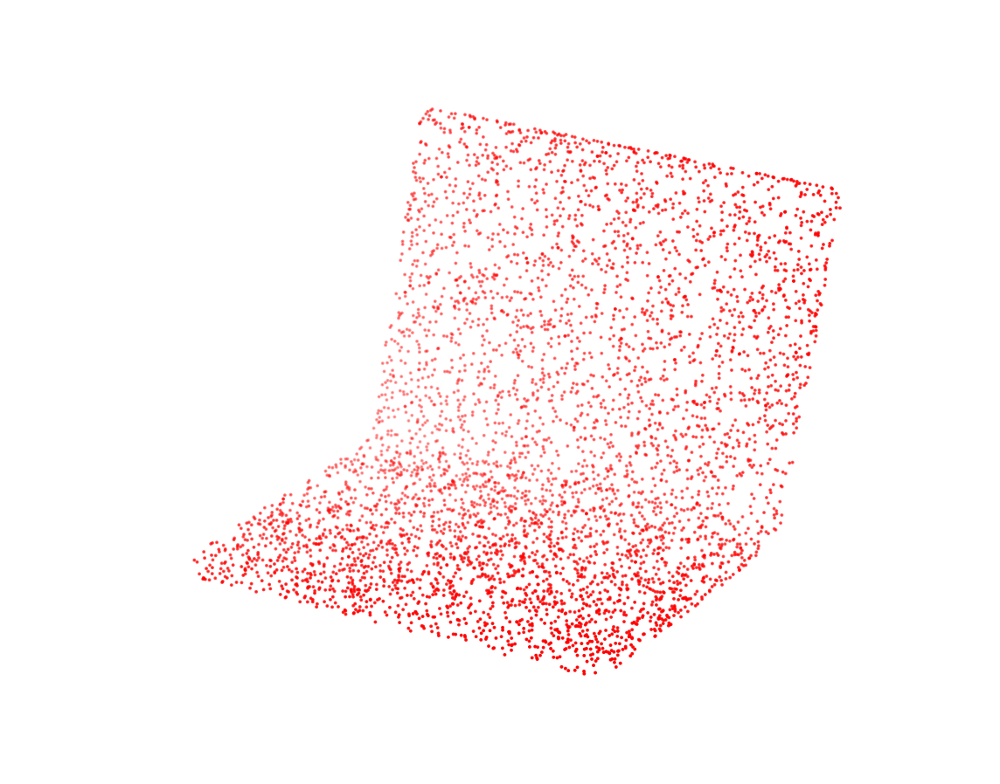

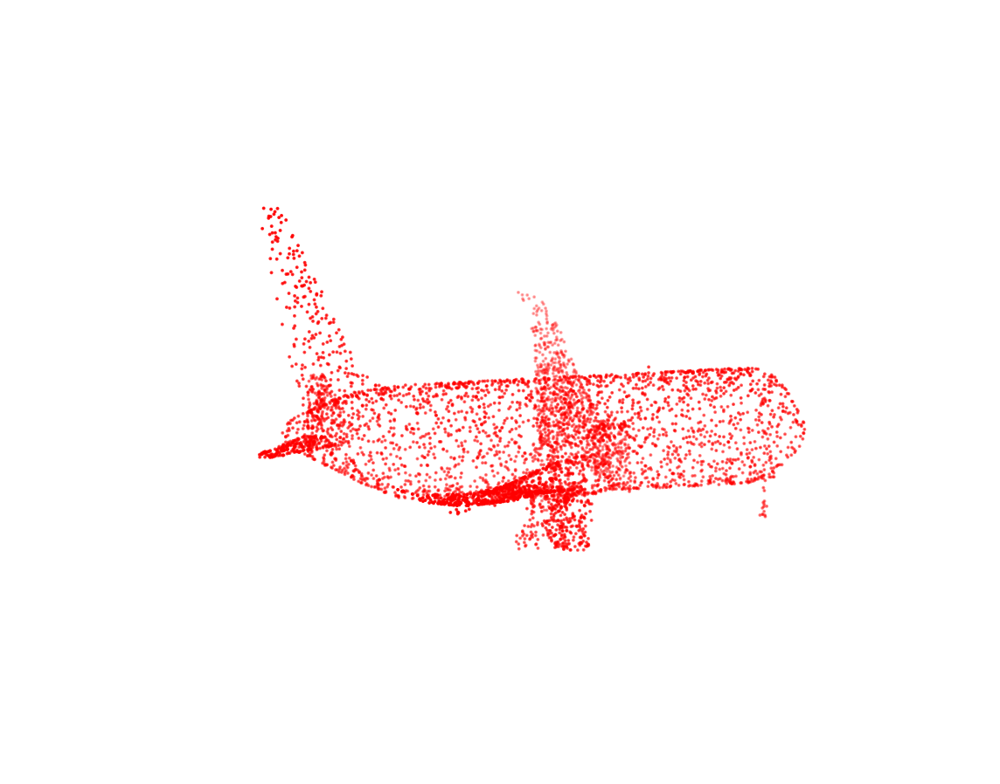

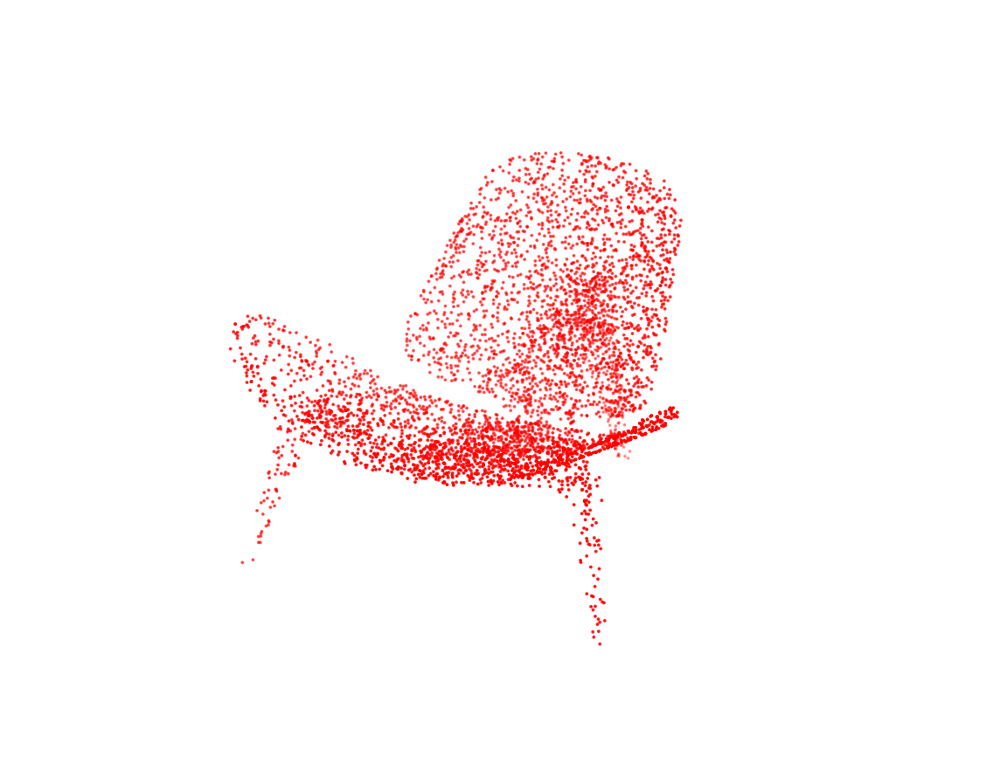

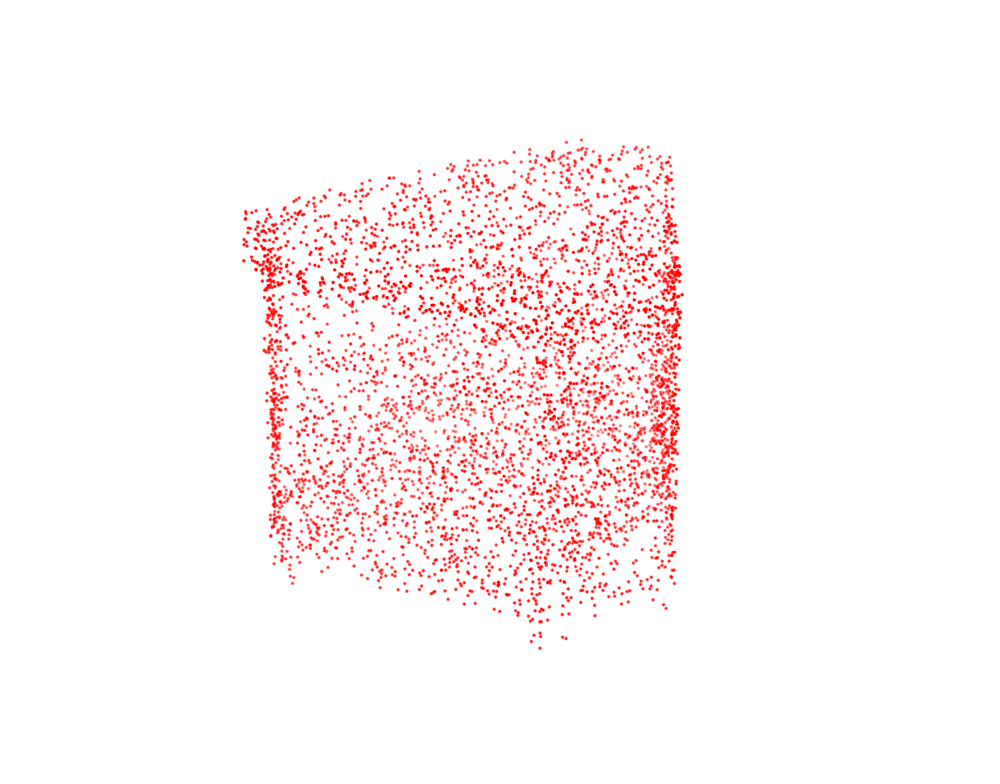

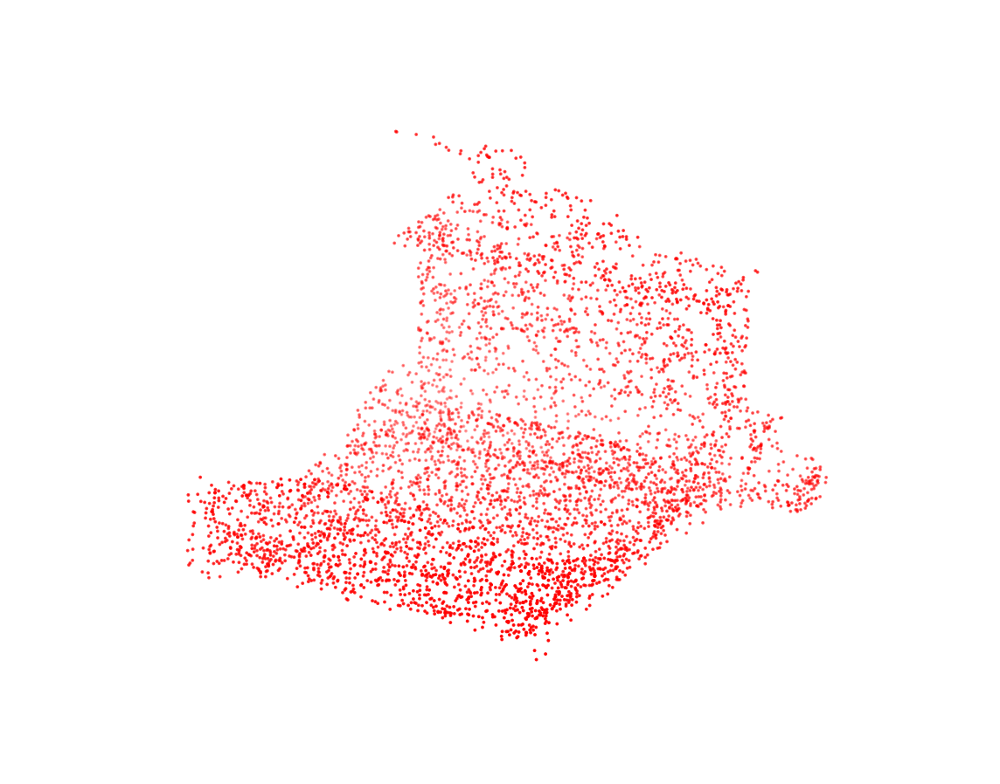

...

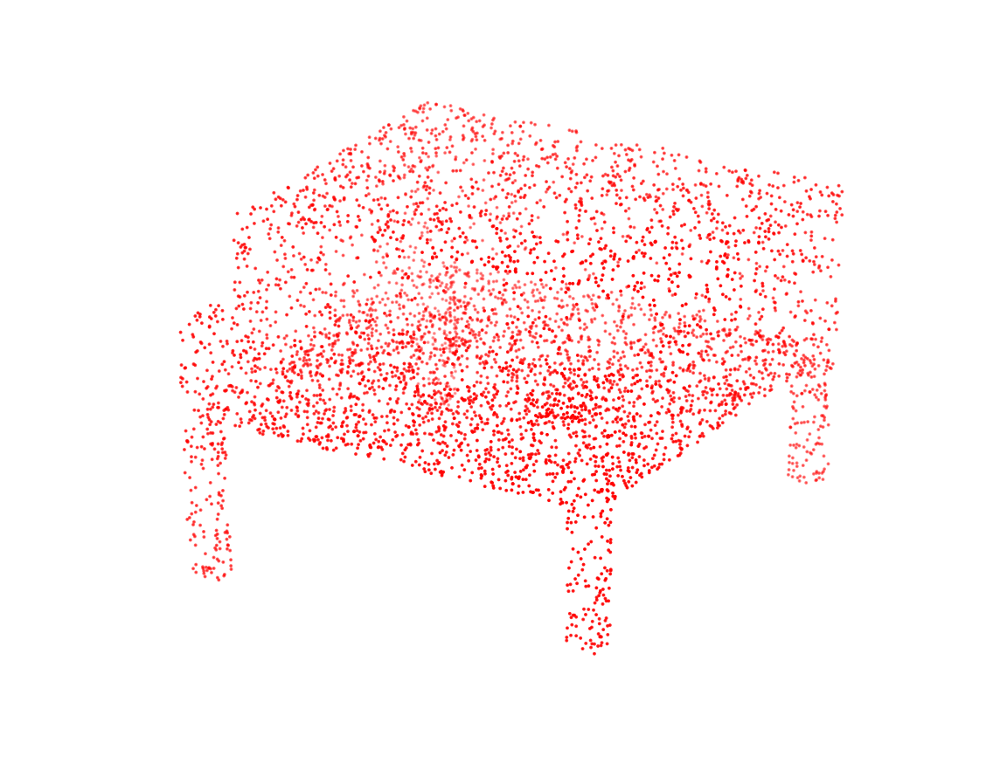

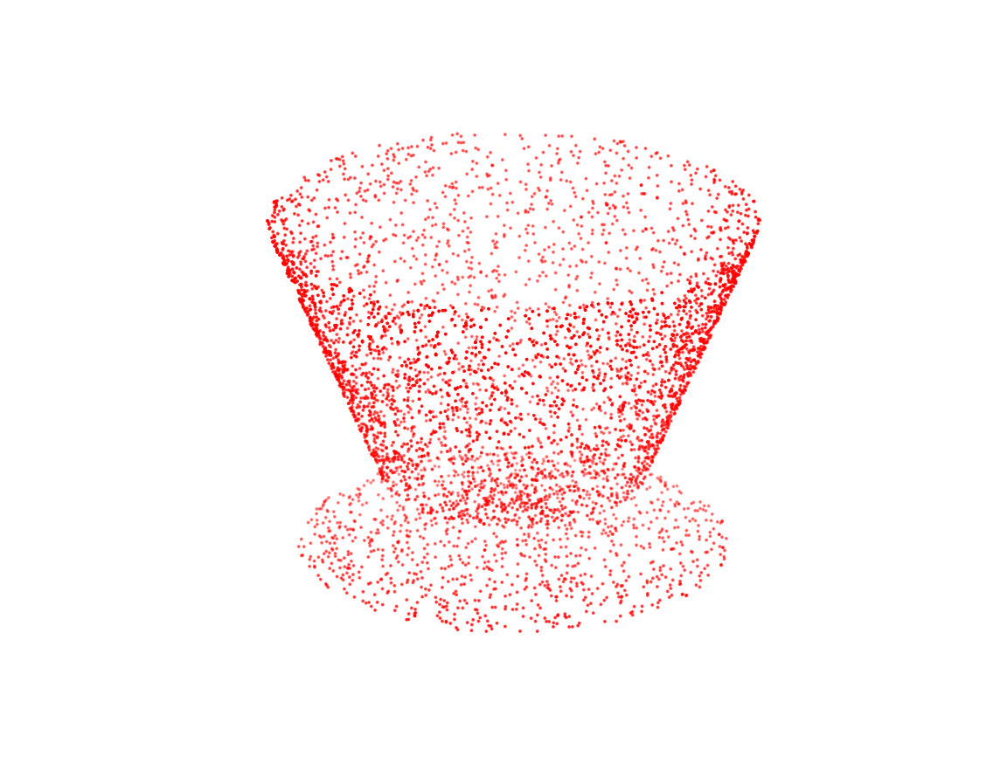

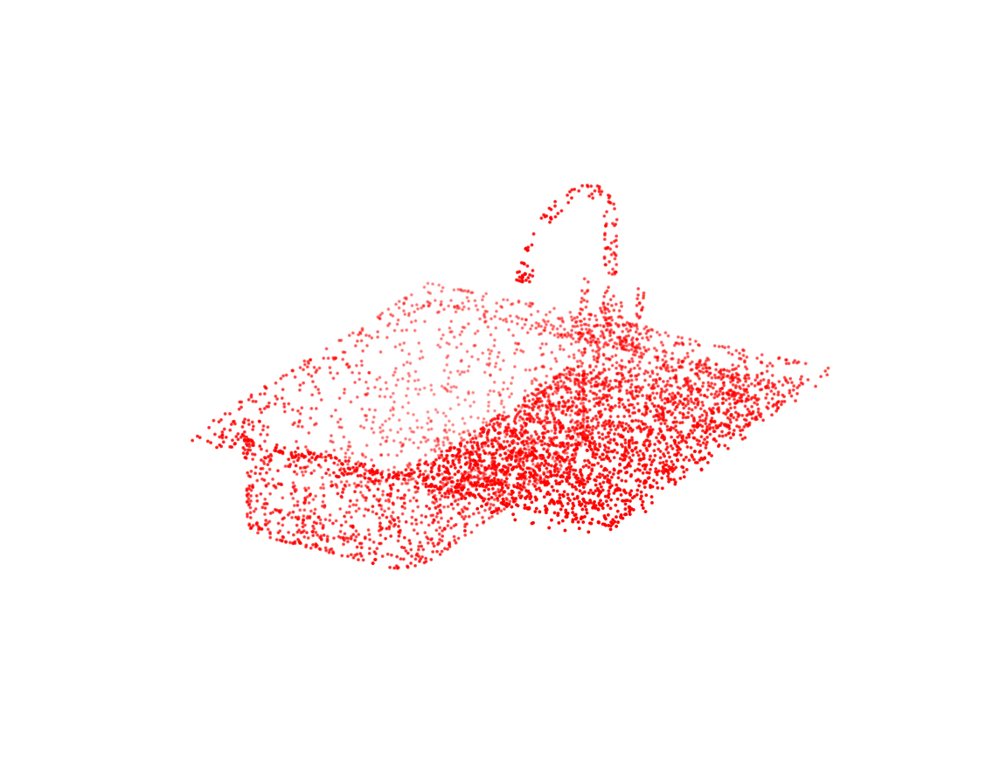

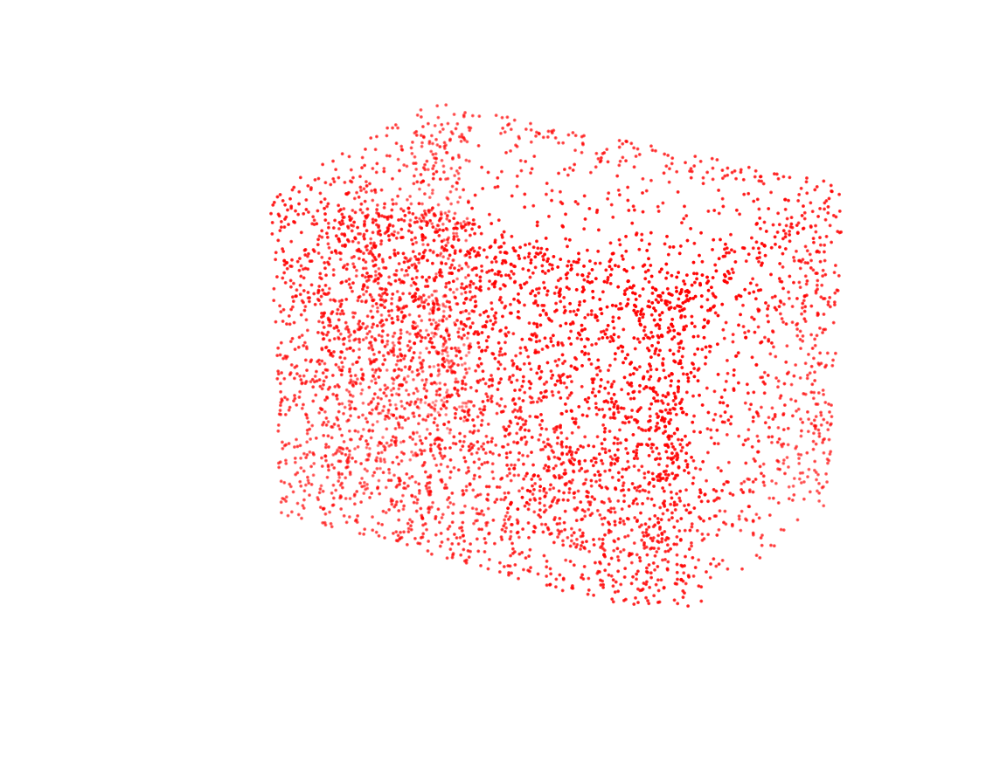

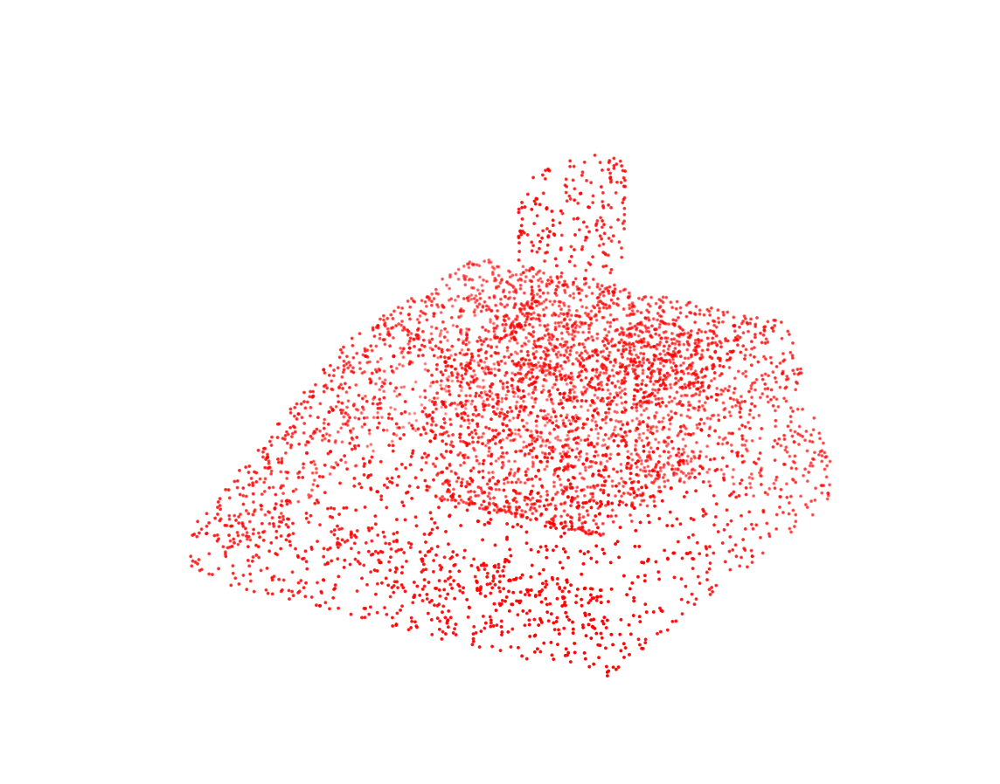

In [34]:
seen_class = set()
for i in range(len(X_train40)):
    if y_train40[i][0] not in seen_class:
        visualize_npy(X_train40[i], save_img_fpath=None)
        seen_class.add(y_train40[i][0])

# Training the single autodecoder and Ensemble CompNets on ModelNet40 data with 33 classes

## Training the single autodecoder and generating the latent space encodings

In [35]:
adnet_HP40 = HyperParameter(lr=0.001, epochs=4)
adnet_DS40 = DirectorySetting()

mn40_autodecoder, train_encoding_ds40, test_encoding_ds40, _, _ = return_decoder_train_test_encoding_ds(
    X_train40,
    y_train40,
    X_test40,
    y_test40,
    adnet_HP40,
    adnet_DS40,
    autodecoder=AutoDecoder())

Epoch: 0. batch_idx: 100
Loss:  17472884463594.447 17472281849780.65
Epoch: 0. batch_idx: 200
Loss:  18885004866407.31 90450948424.47523


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  18878036788816.99 169724811614.9089
Epoch: 1. batch_idx: 200
Loss:  34147842148369.84 15354737843499.654
Epoch: 2. batch_idx: 100
Loss:  3607273310.4091406 2181384345.9528904
Epoch: 2. batch_idx: 200
Loss:  26568095552370.395 7773026214495.207
Epoch: 3. batch_idx: 100
Loss:  2433659411.3802342 91065351091.20883
Epoch: 3. batch_idx: 200
Loss:  19678432887966.7 882790311626.1254
0 140889.98 tensor(5.0569, device='cuda:0', grad_fn=<NormBackward0>)
0 14302373.0 tensor(5.1735, device='cuda:0', grad_fn=<NormBackward0>)
0 313516.34 tensor(5.0428, device='cuda:0', grad_fn=<NormBackward0>)
0 6542806000.0 tensor(5.0712, device='cuda:0', grad_fn=<NormBackward0>)
0 26560866.0 tensor(5.1188, device='cuda:0', grad_fn=<NormBackward0>)
0 2462990.5 tensor(5.1265, device='cuda:0', grad_fn=<NormBackward0>)
0 613481.3 tensor(5.2223, device='cuda:0', grad_fn=<NormBackward0>)
0 614715.2 tensor(5.1459, device='cuda:0', grad_fn=<NormBackward0>)
0 262429.72 tensor(5.0632, device

0 11790740.0 tensor(5.1267, device='cuda:0', grad_fn=<NormBackward0>)
0 69527.14 tensor(5.0577, device='cuda:0', grad_fn=<NormBackward0>)
0 1042588.3 tensor(5.0549, device='cuda:0', grad_fn=<NormBackward0>)
0 50048.758 tensor(5.1223, device='cuda:0', grad_fn=<NormBackward0>)
0 4335287.0 tensor(5.0979, device='cuda:0', grad_fn=<NormBackward0>)
0 103360.61 tensor(5.0531, device='cuda:0', grad_fn=<NormBackward0>)
0 231556.25 tensor(5.0979, device='cuda:0', grad_fn=<NormBackward0>)
0 639811650.0 tensor(5.1303, device='cuda:0', grad_fn=<NormBackward0>)
0 551828060000.0 tensor(5.0861, device='cuda:0', grad_fn=<NormBackward0>)
0 1096218.2 tensor(5.0289, device='cuda:0', grad_fn=<NormBackward0>)
0 1335295.5 tensor(5.1235, device='cuda:0', grad_fn=<NormBackward0>)
0 20632.662 tensor(4.9971, device='cuda:0', grad_fn=<NormBackward0>)
0 39561.668 tensor(5.0560, device='cuda:0', grad_fn=<NormBackward0>)
0 78133864.0 tensor(5.1445, device='cuda:0', grad_fn=<NormBackward0>)
0 249807520.0 tensor(5.103

0 5605091.0 tensor(5.0922, device='cuda:0', grad_fn=<NormBackward0>)
0 5630492.5 tensor(5.2370, device='cuda:0', grad_fn=<NormBackward0>)
0 393673.44 tensor(5.0855, device='cuda:0', grad_fn=<NormBackward0>)
0 430368.47 tensor(5.0844, device='cuda:0', grad_fn=<NormBackward0>)
0 26854176.0 tensor(5.1465, device='cuda:0', grad_fn=<NormBackward0>)
0 331010850.0 tensor(5.1535, device='cuda:0', grad_fn=<NormBackward0>)
0 150081490.0 tensor(5.1578, device='cuda:0', grad_fn=<NormBackward0>)
0 85058036000.0 tensor(5.0902, device='cuda:0', grad_fn=<NormBackward0>)
0 289940260.0 tensor(5.1916, device='cuda:0', grad_fn=<NormBackward0>)
0 196771.4 tensor(5.0934, device='cuda:0', grad_fn=<NormBackward0>)
0 8107281.0 tensor(5.1058, device='cuda:0', grad_fn=<NormBackward0>)
0 18064074.0 tensor(5.0944, device='cuda:0', grad_fn=<NormBackward0>)
0 106596.29 tensor(5.1151, device='cuda:0', grad_fn=<NormBackward0>)
0 5643993.0 tensor(5.1540, device='cuda:0', grad_fn=<NormBackward0>)
0 2638314800.0 tensor(5

0 709331.8 tensor(5.1984, device='cuda:0', grad_fn=<NormBackward0>)
0 281501.94 tensor(5.1661, device='cuda:0', grad_fn=<NormBackward0>)
0 26509.8 tensor(5.0971, device='cuda:0', grad_fn=<NormBackward0>)
0 443236.12 tensor(5.0764, device='cuda:0', grad_fn=<NormBackward0>)
0 97583.39 tensor(5.1669, device='cuda:0', grad_fn=<NormBackward0>)
0 53690.332 tensor(5.0868, device='cuda:0', grad_fn=<NormBackward0>)
0 749629.7 tensor(5.0558, device='cuda:0', grad_fn=<NormBackward0>)
0 11618801.0 tensor(5.1564, device='cuda:0', grad_fn=<NormBackward0>)
0 7956.434 tensor(5.1477, device='cuda:0', grad_fn=<NormBackward0>)
0 6039.911 tensor(5.0307, device='cuda:0', grad_fn=<NormBackward0>)
0 125438270.0 tensor(5.1132, device='cuda:0', grad_fn=<NormBackward0>)
0 112068024.0 tensor(5.0737, device='cuda:0', grad_fn=<NormBackward0>)
0 300630.94 tensor(5.1430, device='cuda:0', grad_fn=<NormBackward0>)
0 400684.22 tensor(5.0852, device='cuda:0', grad_fn=<NormBackward0>)
0 45916.996 tensor(5.0717, device='c

0 180285.95 tensor(5.1386, device='cuda:0', grad_fn=<NormBackward0>)
0 256505.83 tensor(5.1296, device='cuda:0', grad_fn=<NormBackward0>)
0 381380.53 tensor(5.1540, device='cuda:0', grad_fn=<NormBackward0>)
0 365405.66 tensor(5.1981, device='cuda:0', grad_fn=<NormBackward0>)
0 96317.65 tensor(5.1792, device='cuda:0', grad_fn=<NormBackward0>)
0 190655.88 tensor(5.0485, device='cuda:0', grad_fn=<NormBackward0>)
0 98710.63 tensor(5.2000, device='cuda:0', grad_fn=<NormBackward0>)
0 61479.082 tensor(5.1846, device='cuda:0', grad_fn=<NormBackward0>)
0 10209954.0 tensor(5.1279, device='cuda:0', grad_fn=<NormBackward0>)
0 117316.125 tensor(5.1090, device='cuda:0', grad_fn=<NormBackward0>)
0 3081467.8 tensor(5.0461, device='cuda:0', grad_fn=<NormBackward0>)
0 132228.45 tensor(5.1714, device='cuda:0', grad_fn=<NormBackward0>)
0 223526.08 tensor(5.0704, device='cuda:0', grad_fn=<NormBackward0>)
0 235750.92 tensor(5.0563, device='cuda:0', grad_fn=<NormBackward0>)
0 983456.06 tensor(5.0647, device=

0 23785974.0 tensor(5.0195, device='cuda:0', grad_fn=<NormBackward0>)
0 191343.1 tensor(5.1841, device='cuda:0', grad_fn=<NormBackward0>)
0 4311233.5 tensor(5.0520, device='cuda:0', grad_fn=<NormBackward0>)
0 13332000.0 tensor(5.0748, device='cuda:0', grad_fn=<NormBackward0>)
0 691919.6 tensor(5.0620, device='cuda:0', grad_fn=<NormBackward0>)
0 334083.44 tensor(5.0017, device='cuda:0', grad_fn=<NormBackward0>)
0 57337.855 tensor(5.1460, device='cuda:0', grad_fn=<NormBackward0>)
0 394951.84 tensor(5.1364, device='cuda:0', grad_fn=<NormBackward0>)
0 632253200.0 tensor(5.0868, device='cuda:0', grad_fn=<NormBackward0>)
0 42486.805 tensor(5.0381, device='cuda:0', grad_fn=<NormBackward0>)
0 250598.94 tensor(5.1138, device='cuda:0', grad_fn=<NormBackward0>)
0 44772.99 tensor(5.0700, device='cuda:0', grad_fn=<NormBackward0>)
0 72877.516 tensor(5.1666, device='cuda:0', grad_fn=<NormBackward0>)
0 208028.52 tensor(5.1324, device='cuda:0', grad_fn=<NormBackward0>)
0 326160.53 tensor(5.1432, device

0 71779.42 tensor(5.1017, device='cuda:0', grad_fn=<NormBackward0>)
0 555043.5 tensor(5.0703, device='cuda:0', grad_fn=<NormBackward0>)
0 7928979.0 tensor(5.0493, device='cuda:0', grad_fn=<NormBackward0>)
0 7067049.5 tensor(5.1587, device='cuda:0', grad_fn=<NormBackward0>)
0 118913.99 tensor(5.1133, device='cuda:0', grad_fn=<NormBackward0>)
0 673714.44 tensor(5.0196, device='cuda:0', grad_fn=<NormBackward0>)
0 11473.219 tensor(5.1174, device='cuda:0', grad_fn=<NormBackward0>)
0 2602655.8 tensor(5.1347, device='cuda:0', grad_fn=<NormBackward0>)
0 74340.266 tensor(5.1512, device='cuda:0', grad_fn=<NormBackward0>)
0 565330.94 tensor(5.1390, device='cuda:0', grad_fn=<NormBackward0>)
0 141515.33 tensor(5.0938, device='cuda:0', grad_fn=<NormBackward0>)
0 726418.8 tensor(5.1493, device='cuda:0', grad_fn=<NormBackward0>)
0 63479.918 tensor(5.1298, device='cuda:0', grad_fn=<NormBackward0>)
0 50035.96 tensor(5.1110, device='cuda:0', grad_fn=<NormBackward0>)
0 69417310.0 tensor(5.0781, device='cu

0 3592.0796 tensor(5.0475, device='cuda:0', grad_fn=<NormBackward0>)
0 186127.7 tensor(5.0806, device='cuda:0', grad_fn=<NormBackward0>)
0 4324142.0 tensor(5.0719, device='cuda:0', grad_fn=<NormBackward0>)
0 15459.732 tensor(5.0315, device='cuda:0', grad_fn=<NormBackward0>)
0 419920.53 tensor(5.1210, device='cuda:0', grad_fn=<NormBackward0>)
0 41778136.0 tensor(5.2100, device='cuda:0', grad_fn=<NormBackward0>)
0 93083.86 tensor(5.2030, device='cuda:0', grad_fn=<NormBackward0>)
0 65983.555 tensor(5.1235, device='cuda:0', grad_fn=<NormBackward0>)
0 109595.54 tensor(5.0819, device='cuda:0', grad_fn=<NormBackward0>)
0 12057573000.0 tensor(5.0724, device='cuda:0', grad_fn=<NormBackward0>)
0 48486450.0 tensor(5.1073, device='cuda:0', grad_fn=<NormBackward0>)
0 6657502.5 tensor(5.0406, device='cuda:0', grad_fn=<NormBackward0>)
0 31067.555 tensor(5.1037, device='cuda:0', grad_fn=<NormBackward0>)
0 88453.65 tensor(5.1507, device='cuda:0', grad_fn=<NormBackward0>)
0 4274617.5 tensor(5.1003, devi

0 2317686800.0 tensor(5.1164, device='cuda:0', grad_fn=<NormBackward0>)
0 262122.03 tensor(5.1480, device='cuda:0', grad_fn=<NormBackward0>)
0 551596460000.0 tensor(5.1345, device='cuda:0', grad_fn=<NormBackward0>)
0 3735913.5 tensor(5.1625, device='cuda:0', grad_fn=<NormBackward0>)
0 277072.47 tensor(4.8158, device='cuda:0', grad_fn=<NormBackward0>)
0 311039.28 tensor(4.8164, device='cuda:0', grad_fn=<NormBackward0>)
Encodings trained
0 4272943.5 tensor(5.0585, device='cuda:0', grad_fn=<NormBackward0>)
0 401584.94 tensor(5.0829, device='cuda:0', grad_fn=<NormBackward0>)
0 1517141.6 tensor(5.2482, device='cuda:0', grad_fn=<NormBackward0>)
0 11950879.0 tensor(5.0424, device='cuda:0', grad_fn=<NormBackward0>)
0 250879090.0 tensor(5.0421, device='cuda:0', grad_fn=<NormBackward0>)
0 251215970.0 tensor(5.1209, device='cuda:0', grad_fn=<NormBackward0>)
0 138885.58 tensor(5.1552, device='cuda:0', grad_fn=<NormBackward0>)
0 27699767000.0 tensor(5.2575, device='cuda:0', grad_fn=<NormBackward0>)

0 6337049600.0 tensor(5.0258, device='cuda:0', grad_fn=<NormBackward0>)
0 884246.56 tensor(5.1059, device='cuda:0', grad_fn=<NormBackward0>)
0 10614758.0 tensor(5.0191, device='cuda:0', grad_fn=<NormBackward0>)
0 10268259.0 tensor(5.1302, device='cuda:0', grad_fn=<NormBackward0>)
0 173363.44 tensor(5.1091, device='cuda:0', grad_fn=<NormBackward0>)
0 86408.13 tensor(5.1209, device='cuda:0', grad_fn=<NormBackward0>)
0 227892.58 tensor(5.1613, device='cuda:0', grad_fn=<NormBackward0>)
0 853485.06 tensor(5.0866, device='cuda:0', grad_fn=<NormBackward0>)
0 20111479000.0 tensor(5.1670, device='cuda:0', grad_fn=<NormBackward0>)
0 20114782000.0 tensor(5.1871, device='cuda:0', grad_fn=<NormBackward0>)
0 5709082.0 tensor(5.1413, device='cuda:0', grad_fn=<NormBackward0>)
0 83042.23 tensor(5.1745, device='cuda:0', grad_fn=<NormBackward0>)
0 168250.16 tensor(5.0350, device='cuda:0', grad_fn=<NormBackward0>)
0 2244237.8 tensor(5.1242, device='cuda:0', grad_fn=<NormBackward0>)
0 5451.9004 tensor(5.14

0 4925717.5 tensor(5.0309, device='cuda:0', grad_fn=<NormBackward0>)
0 508127.38 tensor(5.1381, device='cuda:0', grad_fn=<NormBackward0>)
0 5742900.0 tensor(2.5605, device='cuda:0', grad_fn=<NormBackward0>)
0 9054585.0 tensor(2.5345, device='cuda:0', grad_fn=<NormBackward0>)
Encodings trained


## Train a single CompNet for classification on the ModelNet40 data

In [36]:
# train the compnet
compnet_HP40 = HyperParameter(epochs=50, batch_size=16, lr=0.001)
mn40_compnet = train_compnet(compnet_HP40, adnet_DS40,
                             train_ds=train_encoding_ds40,
                             save_wt_fname='mnet40_compnet.pth',)

Epoch: 0. batch_idx: 100
Loss:  0.6446523788571358 0.6882939580082893
Epoch: 0. batch_idx: 200
Loss:  0.6511158391833305 0.676171789765358
Epoch: 0. batch_idx: 300
Loss:  0.6524175068736077 0.6721673971414566
Epoch: 0. batch_idx: 400
Loss:  0.6441578122973443 0.6644813650846482
Epoch: 1. batch_idx: 100
Loss:  0.6630244347453117 0.6604576420783996
Epoch: 1. batch_idx: 200
Loss:  0.6451252162456512 0.6521971976757049
Epoch: 1. batch_idx: 300
Loss:  0.6498241347074508 0.6552527433633805
Epoch: 1. batch_idx: 400
Loss:  0.6413784199953079 0.6598569637537003
Epoch: 2. batch_idx: 100
Loss:  0.6578583317995071 0.6584416168928147
Epoch: 2. batch_idx: 200
Loss:  0.6338829216361046 0.6311664929986001
Epoch: 2. batch_idx: 300
Loss:  0.645219552218914 0.6460118585824967
Epoch: 2. batch_idx: 400
Loss:  0.6610290694236756 0.6532499146461487
Epoch: 3. batch_idx: 100
Loss:  0.6434026452898979 0.6520921537280082
Epoch: 3. batch_idx: 200
Loss:  0.6528512752056121 0.634705561697483
Epoch: 3. batch_idx: 30

Epoch: 29. batch_idx: 300
Loss:  0.6042491886019706 0.5884746319055557
Epoch: 29. batch_idx: 400
Loss:  0.5874361035227775 0.5820571544766426
Epoch: 30. batch_idx: 100
Loss:  0.5934583976864815 0.5879064133763313
Epoch: 30. batch_idx: 200
Loss:  0.5946070092916489 0.5858899852633477
Epoch: 30. batch_idx: 300
Loss:  0.6018707942962647 0.5886636638641357
Epoch: 30. batch_idx: 400
Loss:  0.5951544693112374 0.572940211892128
Epoch: 31. batch_idx: 100
Loss:  0.5978973621129989 0.56780921459198
Epoch: 31. batch_idx: 200
Loss:  0.5978779530525208 0.5958180636167526
Epoch: 31. batch_idx: 300
Loss:  0.5834564390778542 0.5649089947342872
Epoch: 31. batch_idx: 400
Loss:  0.5906646844744682 0.5705677291750908
Epoch: 32. batch_idx: 100
Loss:  0.603634115755558 0.5900027567148208
Epoch: 32. batch_idx: 200
Loss:  0.5754346925020218 0.5712256056070327
Epoch: 32. batch_idx: 300
Loss:  0.5866779160499572 0.5581847143173218
Epoch: 32. batch_idx: 400
Loss:  0.5831144988536835 0.5753352400660515
Epoch: 33.

### Evaluate Single CompNet on ModelNet40 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.7068965517241379
After 475 batches and 7598 test points

Metrics for the same class:
Avg loss: 0.5334525173588803
Precision: 0.7129504199403955
Recall: 0.6926822848117926
F1 Score: 0.7026702269692925

Metrics for the diff class:
Avg loss: 0.5784796647021645
Precision: 0.7011773739442028
Recall: 0.7211108186364833
F1 Score: 0.7110044121463795


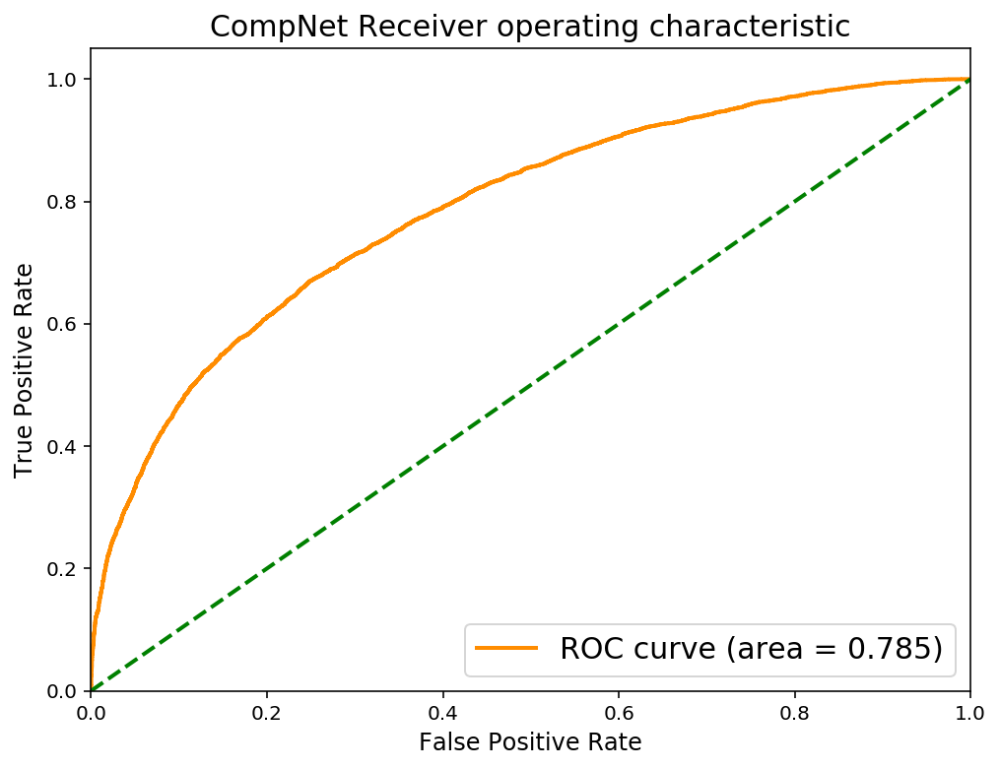

(253.38994574546814,
 274.77784073352814,
 5263.0,
 5479.0,
 2335.0,
 2119.0,
 475,
 7598)

In [37]:
eval_compnet(mn40_compnet, train_encoding_ds40)

------------------ Evaluation Report ------------------
Total Accuracy: 0.5954301075268817
After 117 batches and 1860 test points

Metrics for the same class:
Avg loss: 0.6641698326819983
Precision: 0.59683578832515
Recall: 0.5881720430107527
F1 Score: 0.5924722447874357

Metrics for the diff class:
Avg loss: 0.7049450313943064
Precision: 0.5940646528881823
Recall: 0.6026881720430107
F1 Score: 0.5983453429410194


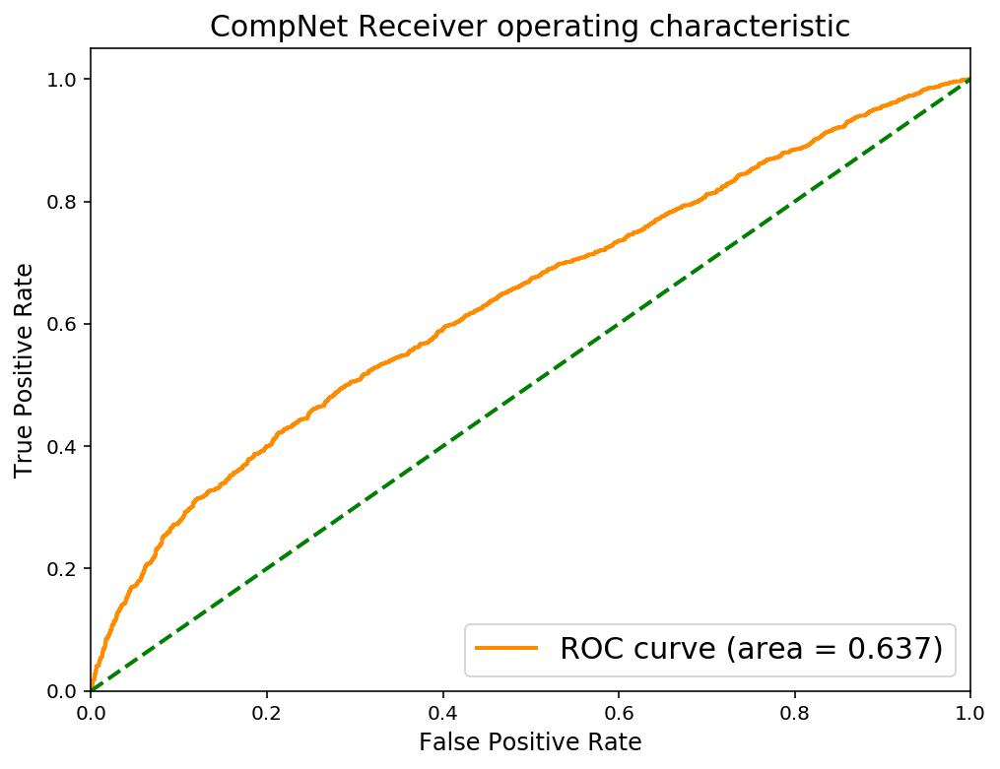

(77.70787042379379, 82.47856867313385, 1094.0, 1121.0, 766.0, 739.0, 117, 1860)

In [38]:
eval_compnet(mn40_compnet, test_encoding_ds40)

## Train Ensemble Compnet1 on ModelNet40 data

In [39]:
ensemble_HP40 = HyperParameter(epochs=50, batch_size=16, lr=0.001)
ensemble_DS40 = DirectorySetting()

# Train with the ensemble net
ensemble1_40 = train_compnet(ensemble_HP40, ensemble_DS40,
                             train_ds=train_encoding_ds40,
                             save_wt_fname='mnet40_ensemble1.pth',
                             compnet=EnsembleCompNet())

Epoch: 0. batch_idx: 100
Loss:  0.8222687530517578 0.5927874433994293
Epoch: 0. batch_idx: 200
Loss:  0.7152306765317917 0.670438215136528
Epoch: 0. batch_idx: 300
Loss:  0.6632020825147629 0.7123418205976486
Epoch: 0. batch_idx: 400
Loss:  0.622696790099144 0.7301873391866684


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.5791420841217041 0.7241430586576462
Epoch: 1. batch_idx: 200
Loss:  0.5365774011611939 0.6985428744554519
Epoch: 1. batch_idx: 300
Loss:  0.544158596098423 0.673955272436142
Epoch: 1. batch_idx: 400
Loss:  0.5179126486182213 0.6884818825125695
Epoch: 2. batch_idx: 100
Loss:  0.5045286524295807 0.6467531317472458
Epoch: 2. batch_idx: 200
Loss:  0.5001262457668781 0.6172308793663979
Epoch: 2. batch_idx: 300
Loss:  0.5171518914401532 0.6278135746717453
Epoch: 2. batch_idx: 400
Loss:  0.49958479702472686 0.6048499536514282
Epoch: 3. batch_idx: 100
Loss:  0.4968715647608042 0.5714603716135025
Epoch: 3. batch_idx: 200
Loss:  0.4804555585980415 0.5714824956655502
Epoch: 3. batch_idx: 300
Loss:  0.4751933427155018 0.591928240954876
Epoch: 3. batch_idx: 400
Loss:  0.46601458042860033 0.6282888635993004
Epoch: 4. batch_idx: 100
Loss:  0.5080732345581055 0.5541917908191681
Epoch: 4. batch_idx: 200
Loss:  0.4637378288805485 0.5575035037100315
Epoch: 4. batch_idx: 

Epoch: 30. batch_idx: 100
Loss:  0.4490371850132942 0.40323372207582
Epoch: 30. batch_idx: 200
Loss:  0.4395553686656058 0.3969202083349228
Epoch: 30. batch_idx: 300
Loss:  0.42549664290621875 0.40614401511847975
Epoch: 30. batch_idx: 400
Loss:  0.4560939503461123 0.4231175833940506
Epoch: 31. batch_idx: 100
Loss:  0.43365452747792005 0.4042098554223776
Epoch: 31. batch_idx: 200
Loss:  0.43228290671482683 0.40262454621493815
Epoch: 31. batch_idx: 300
Loss:  0.40135620089247825 0.39658551670610903
Epoch: 31. batch_idx: 400
Loss:  0.47294815130531787 0.41462174952030184
Epoch: 32. batch_idx: 100
Loss:  0.4294969145581126 0.38227535150945186
Epoch: 32. batch_idx: 200
Loss:  0.4042609796859324 0.3965514681488276
Epoch: 32. batch_idx: 300
Loss:  0.4190348126646131 0.38839327201247215
Epoch: 32. batch_idx: 400
Loss:  0.40250479824841023 0.4152061867713928
Epoch: 33. batch_idx: 100
Loss:  0.4307671581208706 0.4172202876955271
Epoch: 33. batch_idx: 200
Loss:  0.397405210994184 0.38405228905379

### Evaluate Ensemble CompNet1 on ModelNet40 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.8355488286391155
After 475 batches and 7598 test points

Metrics for the same class:
Avg loss: 0.4217733393609524
Precision: 0.8642663237605372
Recall: 0.7961305606738616
F1 Score: 0.8288004384462562

Metrics for the diff class:
Avg loss: 0.33481644379465203
Precision: 0.8110284250335489
Recall: 0.8749670966043696
F1 Score: 0.8417853751187084


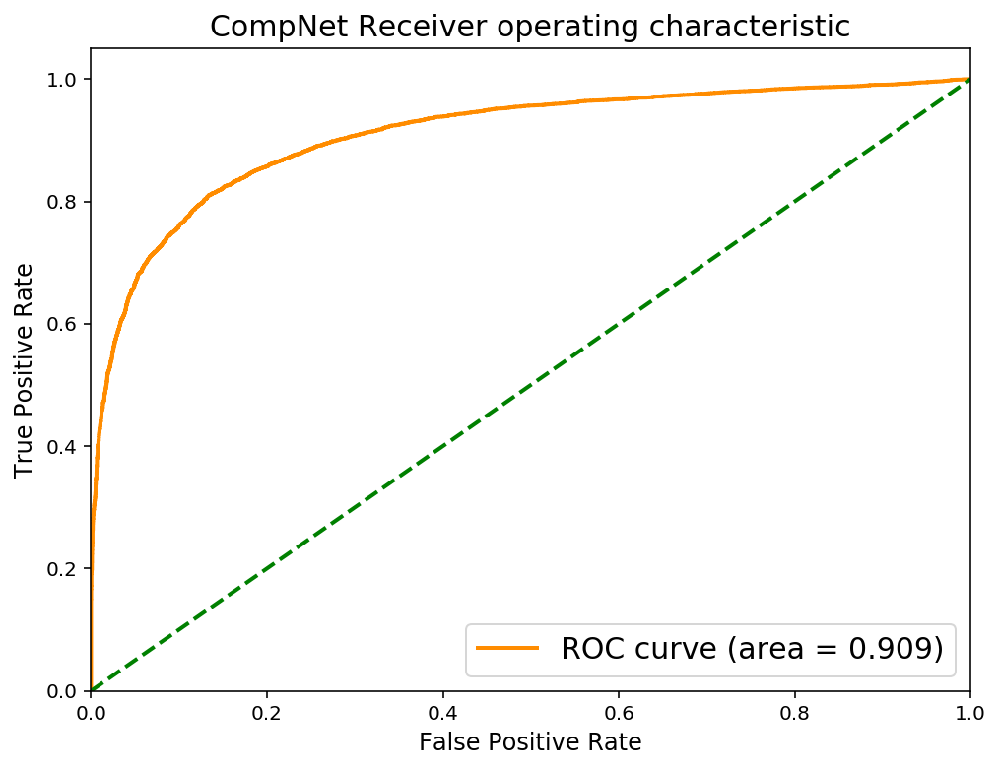

(200.34233619645238,
 159.03781080245972,
 6049.0,
 6648.0,
 1549.0,
 950.0,
 475,
 7598)

In [40]:
eval_compnet(ensemble1_40, train_encoding_ds40)

------------------ Evaluation Report ------------------
Total Accuracy: 0.7365591397849462
After 117 batches and 1860 test points

Metrics for the same class:
Avg loss: 0.6784101350822
Precision: 0.8013698630136986
Recall: 0.6290322580645161
F1 Score: 0.7048192771084337

Metrics for the diff class:
Avg loss: 0.3892014120888506
Precision: 0.6946902654867256
Recall: 0.8440860215053764
F1 Score: 0.7621359223300972


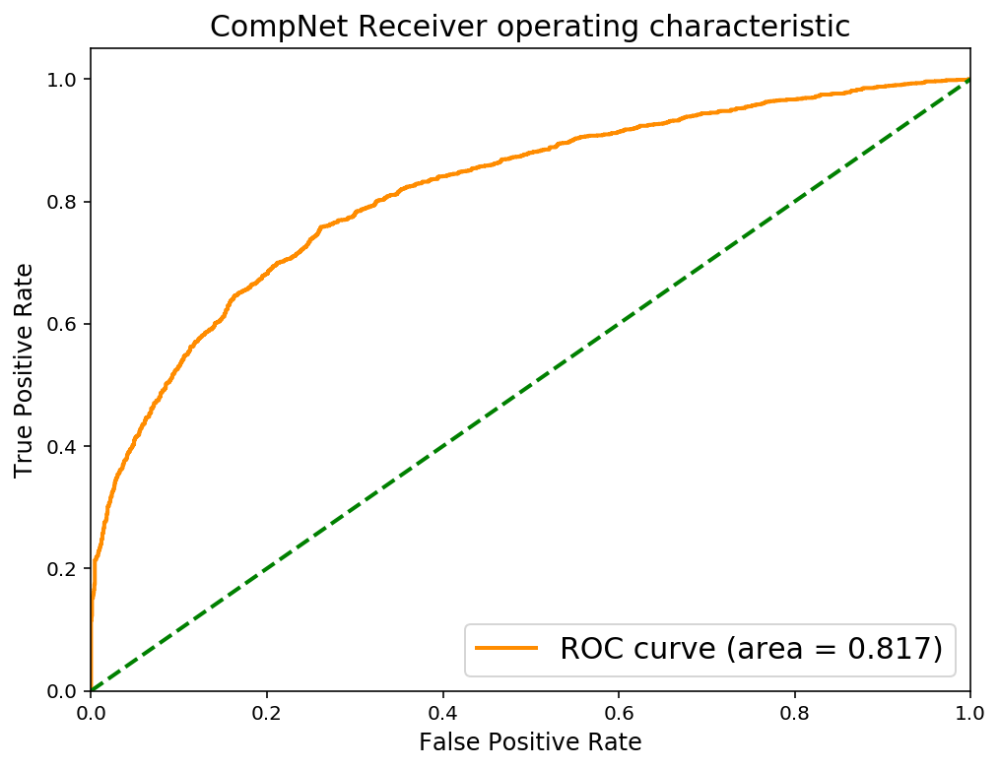

(79.3739858046174, 45.53656521439552, 1170.0, 1570.0, 690.0, 290.0, 117, 1860)

In [41]:
eval_compnet(ensemble1_40, test_encoding_ds40)

# Training Ensemble autodecoder and Ensemble CompNets on ModelNet40 data with 33 classes

In [42]:
adnet_HP40 = HyperParameter(lr=0.001, epochs=4)
adnet_DS40 = DirectorySetting()

ens_mn40_autodecoder, ens_train_encoding_ds40, ens_test_encoding_ds40, _, _ = return_decoder_train_test_encoding_ds(
    X_train40,
    y_train40,
    X_test40,
    y_test40,
    adnet_HP40,
    adnet_DS40,
    autodecoder=EnsembleAutoDecoder(ensemble_adnet))

Epoch: 0. batch_idx: 100
Loss:  14055511461197.86 14054199341008.418
Epoch: 0. batch_idx: 200
Loss:  18885477544775.938 37590656016480.52


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  18885544034673.973 18796143595976.203
Epoch: 1. batch_idx: 200
Loss:  2756983986067.648 21462696927047.824
Epoch: 2. batch_idx: 100
Loss:  46514510533583.02 46338277149943.77
Epoch: 2. batch_idx: 200
Loss:  2891231260.107832 18795719430444.332
Epoch: 3. batch_idx: 100
Loss:  18930417413352.68 37635182593541.555
Epoch: 3. batch_idx: 200
Loss:  12245706992449.244 12156852249908.59
0 50442856.0 tensor(5.1086, device='cuda:0', grad_fn=<NormBackward0>)
0 218517.38 tensor(5.1575, device='cuda:0', grad_fn=<NormBackward0>)
0 172714160.0 tensor(5.0366, device='cuda:0', grad_fn=<NormBackward0>)
0 425717.53 tensor(5.1635, device='cuda:0', grad_fn=<NormBackward0>)
0 45284868.0 tensor(5.1590, device='cuda:0', grad_fn=<NormBackward0>)
0 2644021.2 tensor(5.0812, device='cuda:0', grad_fn=<NormBackward0>)
0 1799404.8 tensor(5.0408, device='cuda:0', grad_fn=<NormBackward0>)
0 2082687.4 tensor(5.1457, device='cuda:0', grad_fn=<NormBackward0>)
0 3489848.5 tensor(5.1275, dev

0 140912.88 tensor(5.1247, device='cuda:0', grad_fn=<NormBackward0>)
0 204848.23 tensor(5.1069, device='cuda:0', grad_fn=<NormBackward0>)
0 345355.2 tensor(5.0952, device='cuda:0', grad_fn=<NormBackward0>)
0 301641.78 tensor(5.1445, device='cuda:0', grad_fn=<NormBackward0>)
0 1299268.9 tensor(5.1665, device='cuda:0', grad_fn=<NormBackward0>)
0 40919132.0 tensor(5.1223, device='cuda:0', grad_fn=<NormBackward0>)
0 205933.48 tensor(5.0882, device='cuda:0', grad_fn=<NormBackward0>)
0 124672150.0 tensor(5.0701, device='cuda:0', grad_fn=<NormBackward0>)
0 378349.2 tensor(5.1168, device='cuda:0', grad_fn=<NormBackward0>)
0 1324705.5 tensor(5.1711, device='cuda:0', grad_fn=<NormBackward0>)
0 4583811.5 tensor(5.0948, device='cuda:0', grad_fn=<NormBackward0>)
0 112877.836 tensor(5.0691, device='cuda:0', grad_fn=<NormBackward0>)
0 149090670.0 tensor(5.1565, device='cuda:0', grad_fn=<NormBackward0>)
0 286034370.0 tensor(5.1451, device='cuda:0', grad_fn=<NormBackward0>)
0 286251780.0 tensor(5.0961,

0 5711132.0 tensor(5.1151, device='cuda:0', grad_fn=<NormBackward0>)
0 181425700.0 tensor(5.1180, device='cuda:0', grad_fn=<NormBackward0>)
0 50548824.0 tensor(5.1511, device='cuda:0', grad_fn=<NormBackward0>)
0 551847800000.0 tensor(5.1234, device='cuda:0', grad_fn=<NormBackward0>)
0 73103540.0 tensor(5.1425, device='cuda:0', grad_fn=<NormBackward0>)
0 43722800.0 tensor(5.0965, device='cuda:0', grad_fn=<NormBackward0>)
0 137343980.0 tensor(5.0338, device='cuda:0', grad_fn=<NormBackward0>)
0 136833390.0 tensor(5.0430, device='cuda:0', grad_fn=<NormBackward0>)
0 61878.92 tensor(4.9775, device='cuda:0', grad_fn=<NormBackward0>)
0 80411.26 tensor(5.2314, device='cuda:0', grad_fn=<NormBackward0>)
0 84907270000.0 tensor(5.0894, device='cuda:0', grad_fn=<NormBackward0>)
0 208521.17 tensor(5.1461, device='cuda:0', grad_fn=<NormBackward0>)
0 46302184.0 tensor(5.1463, device='cuda:0', grad_fn=<NormBackward0>)
0 180474.7 tensor(5.1093, device='cuda:0', grad_fn=<NormBackward0>)
0 5923582000.0 ten

0 193665830000.0 tensor(5.0519, device='cuda:0', grad_fn=<NormBackward0>)
0 353234700.0 tensor(5.1440, device='cuda:0', grad_fn=<NormBackward0>)
0 53419.07 tensor(4.9708, device='cuda:0', grad_fn=<NormBackward0>)
0 1329149.2 tensor(5.2822, device='cuda:0', grad_fn=<NormBackward0>)
0 858618.8 tensor(5.0497, device='cuda:0', grad_fn=<NormBackward0>)
0 110635.95 tensor(5.1181, device='cuda:0', grad_fn=<NormBackward0>)
0 4616785400.0 tensor(5.1653, device='cuda:0', grad_fn=<NormBackward0>)
0 4552280.0 tensor(5.1127, device='cuda:0', grad_fn=<NormBackward0>)
0 88924.77 tensor(5.0509, device='cuda:0', grad_fn=<NormBackward0>)
0 358730.94 tensor(5.1373, device='cuda:0', grad_fn=<NormBackward0>)
0 221049340.0 tensor(5.1239, device='cuda:0', grad_fn=<NormBackward0>)
0 221981940.0 tensor(5.1531, device='cuda:0', grad_fn=<NormBackward0>)
0 297386.22 tensor(5.2529, device='cuda:0', grad_fn=<NormBackward0>)
0 466982.7 tensor(5.1995, device='cuda:0', grad_fn=<NormBackward0>)
0 125044250.0 tensor(5.1

0 13827874.0 tensor(5.0944, device='cuda:0', grad_fn=<NormBackward0>)
0 906470.5 tensor(5.1862, device='cuda:0', grad_fn=<NormBackward0>)
0 902567.7 tensor(5.0538, device='cuda:0', grad_fn=<NormBackward0>)
0 411049.16 tensor(5.1876, device='cuda:0', grad_fn=<NormBackward0>)
0 306510.7 tensor(5.0835, device='cuda:0', grad_fn=<NormBackward0>)
0 367628.5 tensor(5.0697, device='cuda:0', grad_fn=<NormBackward0>)
0 270556060.0 tensor(5.0992, device='cuda:0', grad_fn=<NormBackward0>)
0 2728499.8 tensor(5.1216, device='cuda:0', grad_fn=<NormBackward0>)
0 869361.3 tensor(5.1037, device='cuda:0', grad_fn=<NormBackward0>)
0 642884.0 tensor(5.0715, device='cuda:0', grad_fn=<NormBackward0>)
0 542616.2 tensor(5.1086, device='cuda:0', grad_fn=<NormBackward0>)
0 1541991.1 tensor(5.1334, device='cuda:0', grad_fn=<NormBackward0>)
0 823331.5 tensor(5.0385, device='cuda:0', grad_fn=<NormBackward0>)
0 216506.75 tensor(5.1376, device='cuda:0', grad_fn=<NormBackward0>)
0 355991.03 tensor(5.0435, device='cuda

0 1352699.0 tensor(5.1208, device='cuda:0', grad_fn=<NormBackward0>)
0 516398.12 tensor(5.1007, device='cuda:0', grad_fn=<NormBackward0>)
0 1951055.6 tensor(5.1444, device='cuda:0', grad_fn=<NormBackward0>)
0 21630138.0 tensor(5.0395, device='cuda:0', grad_fn=<NormBackward0>)
0 307044.1 tensor(5.0831, device='cuda:0', grad_fn=<NormBackward0>)
0 187141.94 tensor(5.1587, device='cuda:0', grad_fn=<NormBackward0>)
0 152161.61 tensor(5.1226, device='cuda:0', grad_fn=<NormBackward0>)
0 334671.38 tensor(5.1286, device='cuda:0', grad_fn=<NormBackward0>)
0 40012.867 tensor(5.1382, device='cuda:0', grad_fn=<NormBackward0>)
0 28339980.0 tensor(5.0633, device='cuda:0', grad_fn=<NormBackward0>)
0 780364.25 tensor(5.1234, device='cuda:0', grad_fn=<NormBackward0>)
0 74745160000.0 tensor(5.1859, device='cuda:0', grad_fn=<NormBackward0>)
0 376650.84 tensor(5.0959, device='cuda:0', grad_fn=<NormBackward0>)
0 10763457.0 tensor(5.1809, device='cuda:0', grad_fn=<NormBackward0>)
0 5076649.5 tensor(5.0071, d

0 193538.73 tensor(5.1492, device='cuda:0', grad_fn=<NormBackward0>)
0 360967550.0 tensor(5.1589, device='cuda:0', grad_fn=<NormBackward0>)
0 8598983.0 tensor(5.0366, device='cuda:0', grad_fn=<NormBackward0>)
0 450715.25 tensor(5.1159, device='cuda:0', grad_fn=<NormBackward0>)
0 13587112.0 tensor(5.1407, device='cuda:0', grad_fn=<NormBackward0>)
0 4262288.5 tensor(5.1361, device='cuda:0', grad_fn=<NormBackward0>)
0 456800.34 tensor(5.1868, device='cuda:0', grad_fn=<NormBackward0>)
0 39056.777 tensor(5.1540, device='cuda:0', grad_fn=<NormBackward0>)
0 602295.94 tensor(4.9898, device='cuda:0', grad_fn=<NormBackward0>)
0 280666.2 tensor(5.0852, device='cuda:0', grad_fn=<NormBackward0>)
0 133986.64 tensor(5.1999, device='cuda:0', grad_fn=<NormBackward0>)
0 11678368.0 tensor(5.1905, device='cuda:0', grad_fn=<NormBackward0>)
0 62793170.0 tensor(5.0448, device='cuda:0', grad_fn=<NormBackward0>)
0 340452700.0 tensor(5.1226, device='cuda:0', grad_fn=<NormBackward0>)
0 339557860.0 tensor(5.1827,

0 152303.98 tensor(5.1662, device='cuda:0', grad_fn=<NormBackward0>)
0 161161.33 tensor(5.1258, device='cuda:0', grad_fn=<NormBackward0>)
0 84329.25 tensor(5.0060, device='cuda:0', grad_fn=<NormBackward0>)
0 664003.9 tensor(5.0531, device='cuda:0', grad_fn=<NormBackward0>)
0 4962267.0 tensor(5.0056, device='cuda:0', grad_fn=<NormBackward0>)
0 74746480000.0 tensor(5.0774, device='cuda:0', grad_fn=<NormBackward0>)
0 219852.86 tensor(5.0712, device='cuda:0', grad_fn=<NormBackward0>)
0 4738306600.0 tensor(5.1019, device='cuda:0', grad_fn=<NormBackward0>)
0 1772605.4 tensor(5.1145, device='cuda:0', grad_fn=<NormBackward0>)
0 135132350.0 tensor(5.1960, device='cuda:0', grad_fn=<NormBackward0>)
0 18311234.0 tensor(5.1190, device='cuda:0', grad_fn=<NormBackward0>)
0 85017.94 tensor(5.1070, device='cuda:0', grad_fn=<NormBackward0>)
0 312889.1 tensor(5.1278, device='cuda:0', grad_fn=<NormBackward0>)
0 372730.3 tensor(4.9910, device='cuda:0', grad_fn=<NormBackward0>)
0 1001596.2 tensor(5.1300, de

0 409717.78 tensor(5.0844, device='cuda:0', grad_fn=<NormBackward0>)
0 747975.0 tensor(5.1166, device='cuda:0', grad_fn=<NormBackward0>)
0 639640.25 tensor(5.2059, device='cuda:0', grad_fn=<NormBackward0>)
0 12187022.0 tensor(5.0811, device='cuda:0', grad_fn=<NormBackward0>)
0 551317.56 tensor(4.8053, device='cuda:0', grad_fn=<NormBackward0>)
0 600753.44 tensor(4.8422, device='cuda:0', grad_fn=<NormBackward0>)
Encodings trained
0 850208.7 tensor(5.1305, device='cuda:0', grad_fn=<NormBackward0>)
0 1007172.94 tensor(5.1044, device='cuda:0', grad_fn=<NormBackward0>)
0 3148995.5 tensor(5.1660, device='cuda:0', grad_fn=<NormBackward0>)
0 1488930.4 tensor(5.0729, device='cuda:0', grad_fn=<NormBackward0>)
0 1024688300.0 tensor(5.1448, device='cuda:0', grad_fn=<NormBackward0>)
0 335198900.0 tensor(5.1233, device='cuda:0', grad_fn=<NormBackward0>)
0 318664.12 tensor(5.1533, device='cuda:0', grad_fn=<NormBackward0>)
0 116252.12 tensor(5.1580, device='cuda:0', grad_fn=<NormBackward0>)
0 626635.4 

0 4186001.2 tensor(5.0861, device='cuda:0', grad_fn=<NormBackward0>)
0 28593152.0 tensor(5.1288, device='cuda:0', grad_fn=<NormBackward0>)
0 44177572.0 tensor(5.1352, device='cuda:0', grad_fn=<NormBackward0>)
0 44271028.0 tensor(5.1542, device='cuda:0', grad_fn=<NormBackward0>)
0 10137352000.0 tensor(5.1080, device='cuda:0', grad_fn=<NormBackward0>)
0 1674958200.0 tensor(5.1041, device='cuda:0', grad_fn=<NormBackward0>)
0 392432.4 tensor(5.1930, device='cuda:0', grad_fn=<NormBackward0>)
0 998904.3 tensor(5.0953, device='cuda:0', grad_fn=<NormBackward0>)
0 27288474000.0 tensor(5.0303, device='cuda:0', grad_fn=<NormBackward0>)
0 27276745000.0 tensor(5.0293, device='cuda:0', grad_fn=<NormBackward0>)
0 2959043.8 tensor(5.1636, device='cuda:0', grad_fn=<NormBackward0>)
0 243396.67 tensor(5.1162, device='cuda:0', grad_fn=<NormBackward0>)
0 271807.47 tensor(5.1639, device='cuda:0', grad_fn=<NormBackward0>)
0 1681106300.0 tensor(5.2019, device='cuda:0', grad_fn=<NormBackward0>)
0 194857.17 ten

0 716977.6 tensor(5.1264, device='cuda:0', grad_fn=<NormBackward0>)
0 930814.9 tensor(5.0943, device='cuda:0', grad_fn=<NormBackward0>)
0 325397.44 tensor(2.5057, device='cuda:0', grad_fn=<NormBackward0>)
0 272427.66 tensor(2.6284, device='cuda:0', grad_fn=<NormBackward0>)
Encodings trained


## Train a single CompNet for classification on the ModelNet40 data

In [43]:
# train the compnet
compnet_HP40 = HyperParameter(epochs=50, batch_size=16, lr=0.001)
mn40_compnet = train_compnet(compnet_HP40, DS,
                           train_ds=train_encoding_ds40,
                           save_wt_fname='mnet40_compnet.pth',)

Epoch: 0. batch_idx: 100
Loss:  0.6525885689258576 0.6998662942647934
Epoch: 0. batch_idx: 200
Loss:  0.6452586901187897 0.6754319024085998
Epoch: 0. batch_idx: 300
Loss:  0.655792852640152 0.6662433701753616
Epoch: 0. batch_idx: 400
Loss:  0.6391325017809868 0.6806676232814789
Epoch: 1. batch_idx: 100
Loss:  0.650233174264431 0.66344970703125
Epoch: 1. batch_idx: 200
Loss:  0.6388139364123344 0.6534025734663009
Epoch: 1. batch_idx: 300
Loss:  0.6556157186627388 0.650531057715416
Epoch: 1. batch_idx: 400
Loss:  0.6498596650362015 0.6582574617862701
Epoch: 2. batch_idx: 100
Loss:  0.6554198151826859 0.6604416400194169
Epoch: 2. batch_idx: 200
Loss:  0.6532514885067939 0.6417571049928665
Epoch: 2. batch_idx: 300
Loss:  0.6411623632907868 0.6409092023968697
Epoch: 2. batch_idx: 400
Loss:  0.64362284719944 0.6411099380254746
Epoch: 3. batch_idx: 100
Loss:  0.6463958728313446 0.6430725383758545
Epoch: 3. batch_idx: 200
Loss:  0.6526740455627441 0.6496275100111961
Epoch: 3. batch_idx: 300
Lo

Epoch: 29. batch_idx: 200
Loss:  0.5968476670980454 0.5998588615655899
Epoch: 29. batch_idx: 300
Loss:  0.601435771882534 0.5882862362265587
Epoch: 29. batch_idx: 400
Loss:  0.5980559182167053 0.5876495784521103
Epoch: 30. batch_idx: 100
Loss:  0.5907438334822654 0.5810396367311478
Epoch: 30. batch_idx: 200
Loss:  0.5957945454120636 0.5725507012009621
Epoch: 30. batch_idx: 300
Loss:  0.6002738723158836 0.5891840055584907
Epoch: 30. batch_idx: 400
Loss:  0.5957160511612892 0.5760065087676048
Epoch: 31. batch_idx: 100
Loss:  0.593462869822979 0.5793998679518699
Epoch: 31. batch_idx: 200
Loss:  0.5831254476308823 0.5724899709224701
Epoch: 31. batch_idx: 300
Loss:  0.5855770224332809 0.5680964601039886
Epoch: 31. batch_idx: 400
Loss:  0.5801172381639481 0.5870413541793823
Epoch: 32. batch_idx: 100
Loss:  0.5895582830905914 0.560688572525978
Epoch: 32. batch_idx: 200
Loss:  0.5772720643877983 0.5707509765028953
Epoch: 32. batch_idx: 300
Loss:  0.599173573255539 0.5706791797280312
Epoch: 32.

### Evaluate Single CompNet on ModelNet40 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.7034745985785733
After 475 batches and 7598 test points

Metrics for the same class:
Avg loss: 0.6155961440111462
Precision: 0.7412609238451935
Recall: 0.6251645169781521
F1 Score: 0.678280736827074

Metrics for the diff class:
Avg loss: 0.5075893402099609
Precision: 0.6759217114246701
Recall: 0.7817846801789945
F1 Score: 0.7250091541559869


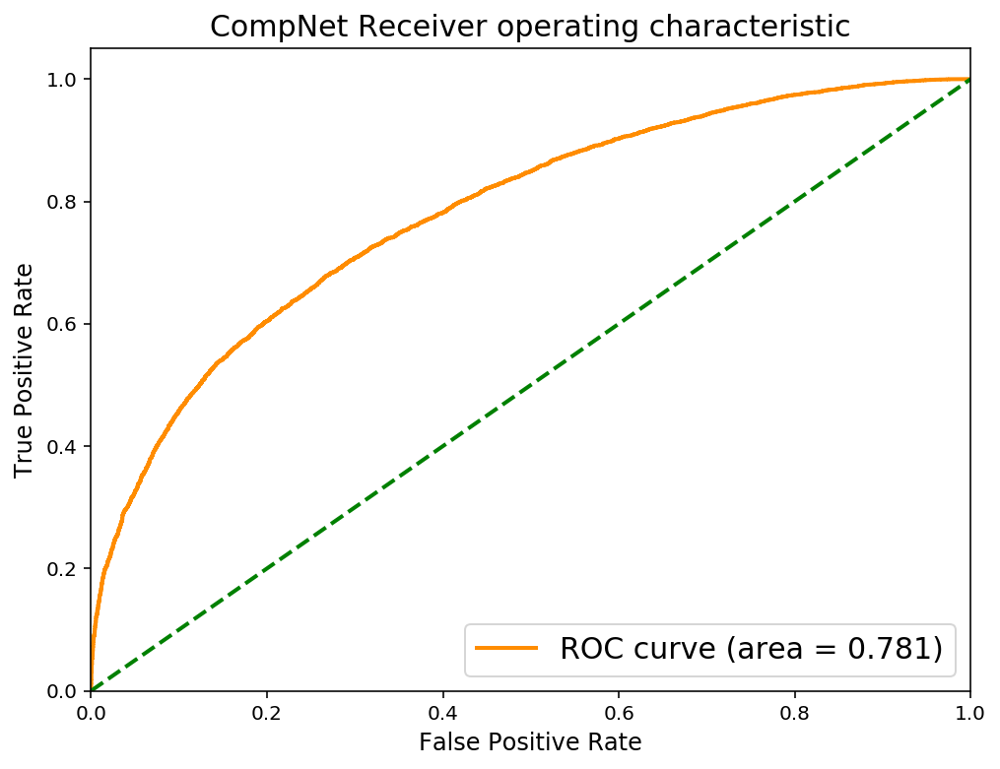

(292.4081684052944,
 241.10493659973145,
 4750.0,
 5940.0,
 2848.0,
 1658.0,
 475,
 7598)

In [44]:
eval_compnet(mn40_compnet, train_encoding_ds40)

------------------ Evaluation Report ------------------
Total Accuracy: 0.5962365591397849
After 117 batches and 1860 test points

Metrics for the same class:
Avg loss: 0.7600008822404422
Precision: 0.6166883963494133
Recall: 0.5086021505376344
F1 Score: 0.5574543311726575

Metrics for the diff class:
Avg loss: 0.6154395382628481
Precision: 0.5818847209515096
Recall: 0.6838709677419355
F1 Score: 0.6287691547207118


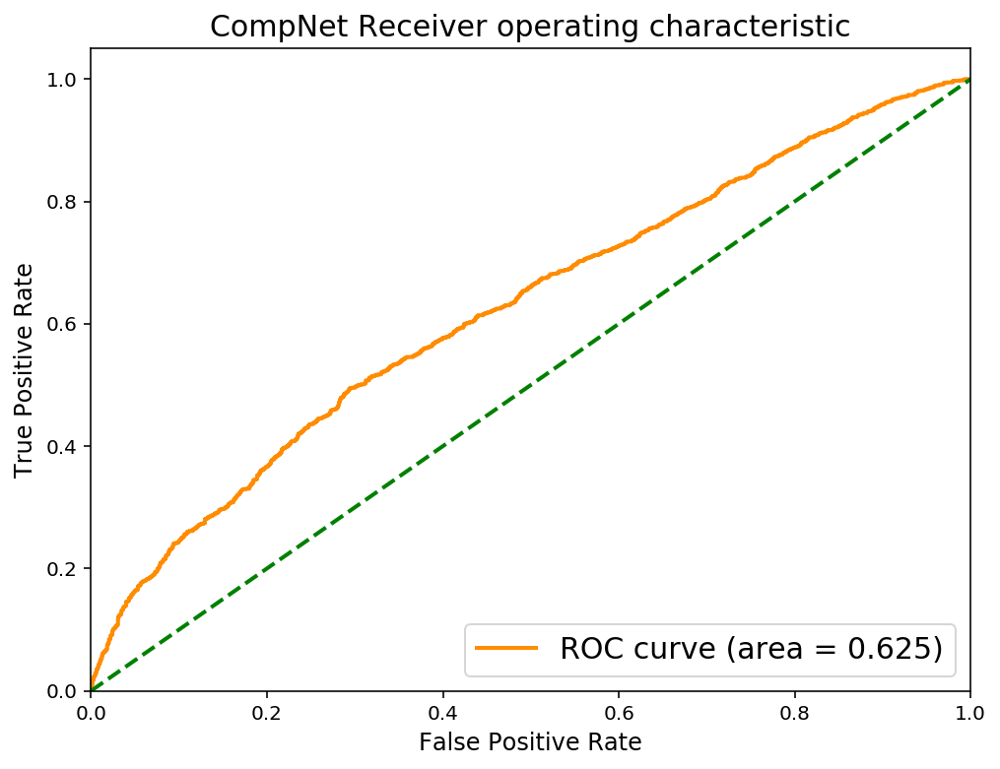

(88.92010322213173, 72.00642597675323, 946.0, 1272.0, 914.0, 588.0, 117, 1860)

In [45]:
eval_compnet(mn40_compnet, test_encoding_ds40)

## Train Ensemble Compnet1 on ModelNet40 data

In [46]:
ensemble_HP40 = HyperParameter(epochs=50, batch_size=16, lr=0.001)
ensemble_DS40 = DirectorySetting()

# Train with the ensemble net
ensemble1_40 = train_compnet(ensemble_HP40, ensemble_DS40,
                             train_ds=train_encoding_ds40,
                             save_wt_fname='mnet40_ensemble1.pth',
                             compnet=EnsembleCompNet())

Epoch: 0. batch_idx: 100
Loss:  0.8222687530517578 0.5927874433994293
Epoch: 0. batch_idx: 200
Loss:  0.7152306765317917 0.670438215136528
Epoch: 0. batch_idx: 300
Loss:  0.6632020825147629 0.7123418205976486
Epoch: 0. batch_idx: 400
Loss:  0.622696790099144 0.7301873391866684


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.5791420841217041 0.7241430586576462
Epoch: 1. batch_idx: 200
Loss:  0.5365774011611939 0.6985428744554519
Epoch: 1. batch_idx: 300
Loss:  0.544158596098423 0.673955272436142
Epoch: 1. batch_idx: 400
Loss:  0.5179126486182213 0.6884818825125695
Epoch: 2. batch_idx: 100
Loss:  0.5045286524295807 0.6467531317472458
Epoch: 2. batch_idx: 200
Loss:  0.5001262457668781 0.6172308793663979
Epoch: 2. batch_idx: 300
Loss:  0.5171518914401532 0.6278135746717453
Epoch: 2. batch_idx: 400
Loss:  0.49958479702472686 0.6048499536514282
Epoch: 3. batch_idx: 100
Loss:  0.4968715647608042 0.5714603716135025
Epoch: 3. batch_idx: 200
Loss:  0.4804555585980415 0.5714824956655502
Epoch: 3. batch_idx: 300
Loss:  0.4751933427155018 0.591928240954876
Epoch: 3. batch_idx: 400
Loss:  0.46601458042860033 0.6282888635993004
Epoch: 4. batch_idx: 100
Loss:  0.5080732345581055 0.5541917908191681
Epoch: 4. batch_idx: 200
Loss:  0.4637378288805485 0.5575035037100315
Epoch: 4. batch_idx: 

Epoch: 30. batch_idx: 100
Loss:  0.4490371850132942 0.40323372207582
Epoch: 30. batch_idx: 200
Loss:  0.4395553686656058 0.3969202083349228
Epoch: 30. batch_idx: 300
Loss:  0.42549664290621875 0.40614401511847975
Epoch: 30. batch_idx: 400
Loss:  0.4560939503461123 0.4231175833940506
Epoch: 31. batch_idx: 100
Loss:  0.43365452747792005 0.4042098554223776
Epoch: 31. batch_idx: 200
Loss:  0.43228290671482683 0.40262454621493815
Epoch: 31. batch_idx: 300
Loss:  0.40135620089247825 0.39658551670610903
Epoch: 31. batch_idx: 400
Loss:  0.47294815130531787 0.41462174952030184
Epoch: 32. batch_idx: 100
Loss:  0.4294969145581126 0.38227535150945186
Epoch: 32. batch_idx: 200
Loss:  0.4042609796859324 0.3965514681488276
Epoch: 32. batch_idx: 300
Loss:  0.4190348126646131 0.38839327201247215
Epoch: 32. batch_idx: 400
Loss:  0.40250479824841023 0.4152061867713928
Epoch: 33. batch_idx: 100
Loss:  0.4307671581208706 0.4172202876955271
Epoch: 33. batch_idx: 200
Loss:  0.397405210994184 0.38405228905379

### Evaluate Ensemble CompNet1 on ModelNet40 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.8355488286391155
After 475 batches and 7598 test points

Metrics for the same class:
Avg loss: 0.4217733393609524
Precision: 0.8642663237605372
Recall: 0.7961305606738616
F1 Score: 0.8288004384462562

Metrics for the diff class:
Avg loss: 0.33481644379465203
Precision: 0.8110284250335489
Recall: 0.8749670966043696
F1 Score: 0.8417853751187084


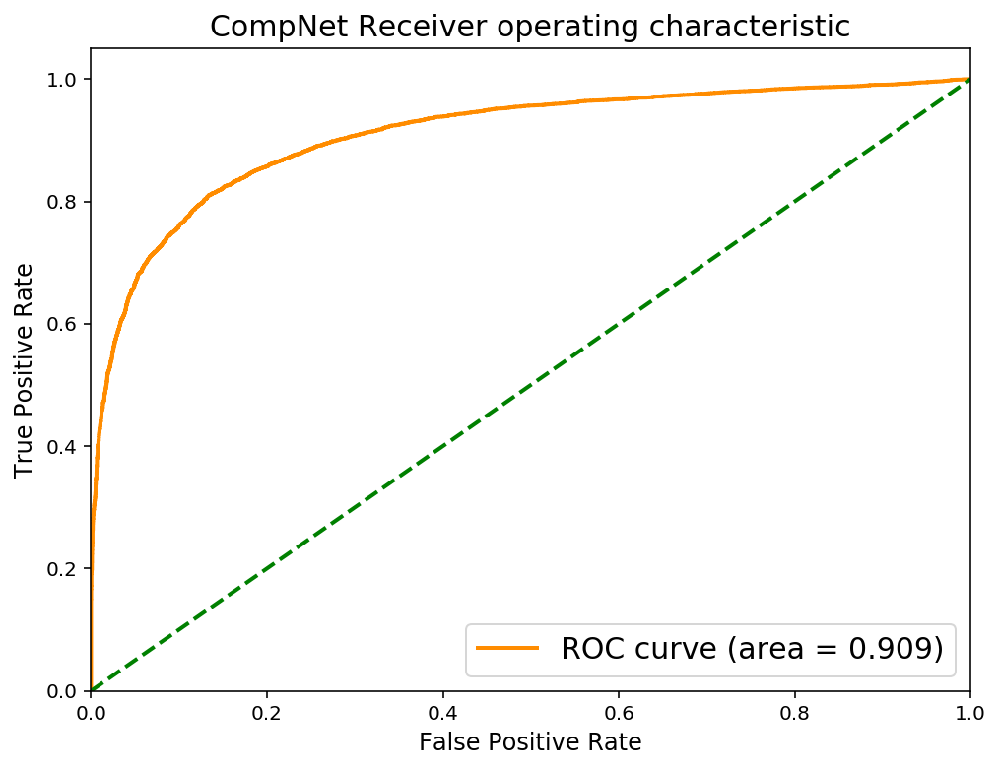

(200.34233619645238,
 159.03781080245972,
 6049.0,
 6648.0,
 1549.0,
 950.0,
 475,
 7598)

In [47]:
eval_compnet(ensemble1_40, train_encoding_ds40)

------------------ Evaluation Report ------------------
Total Accuracy: 0.7365591397849462
After 117 batches and 1860 test points

Metrics for the same class:
Avg loss: 0.6784101350822
Precision: 0.8013698630136986
Recall: 0.6290322580645161
F1 Score: 0.7048192771084337

Metrics for the diff class:
Avg loss: 0.3892014120888506
Precision: 0.6946902654867256
Recall: 0.8440860215053764
F1 Score: 0.7621359223300972


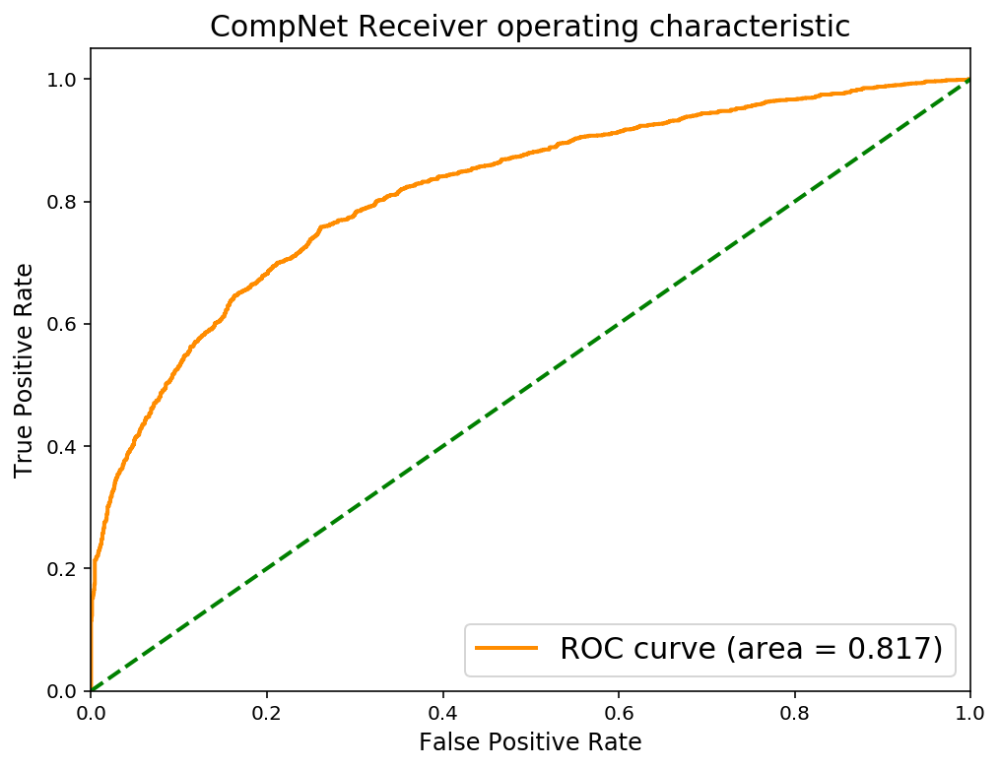

(79.3739858046174, 45.53656521439552, 1170.0, 1570.0, 690.0, 290.0, 117, 1860)

In [48]:
eval_compnet(ensemble1_40, test_encoding_ds40)

## Testing on PointNet7 data

In [49]:
pn_train_data   = np.load("./data/PointNetData/train/pntcloud_7.npy")
pn_train_labels = np.load("./data/PointNetData/train/label_7.npy")
pn_test_data    = np.load("./data/PointNetData/test/pntcloud_7.npy")
pn_test_labels  = np.load("./data/PointNetData/test/label_7.npy")

### Visualizing PointNet7 Data

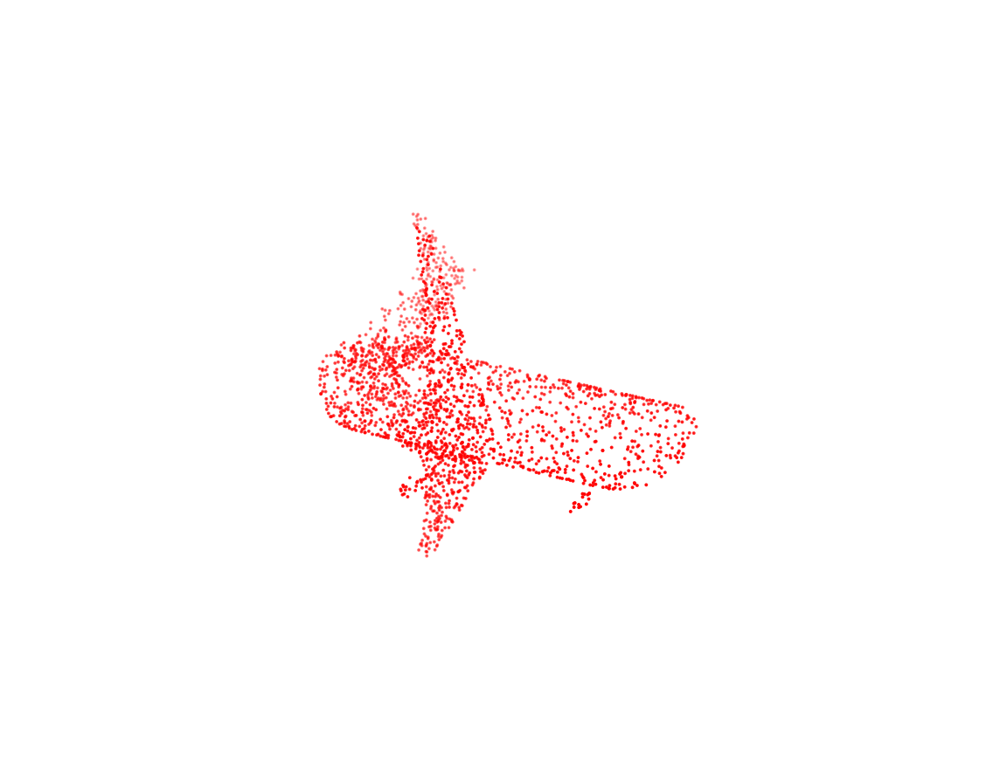

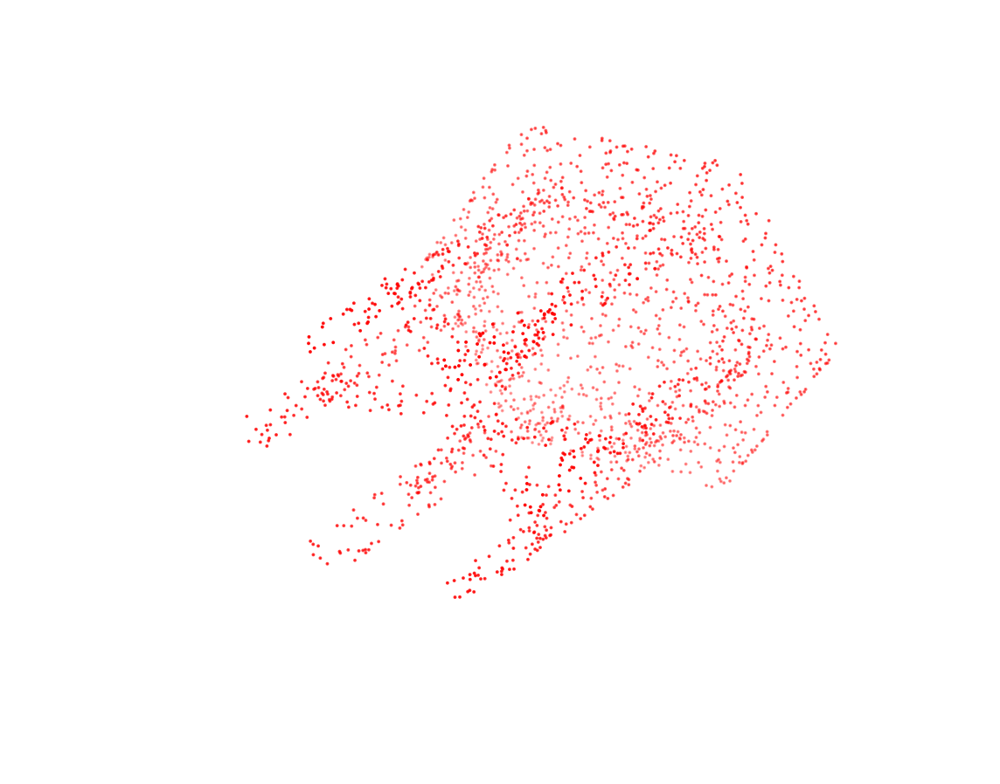

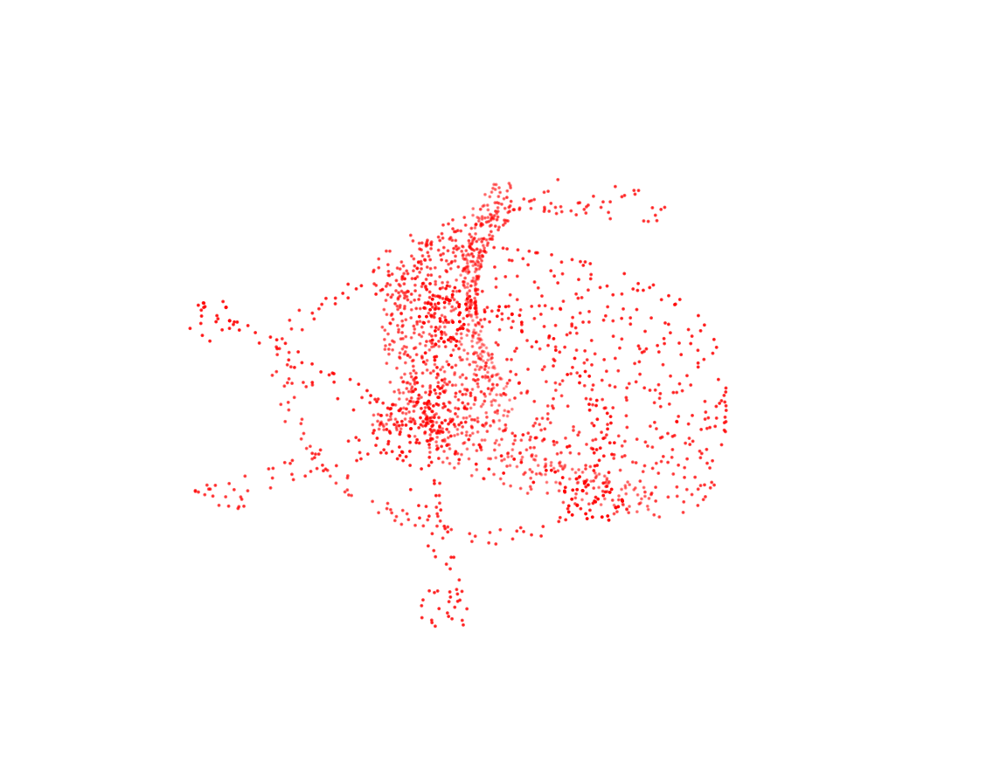

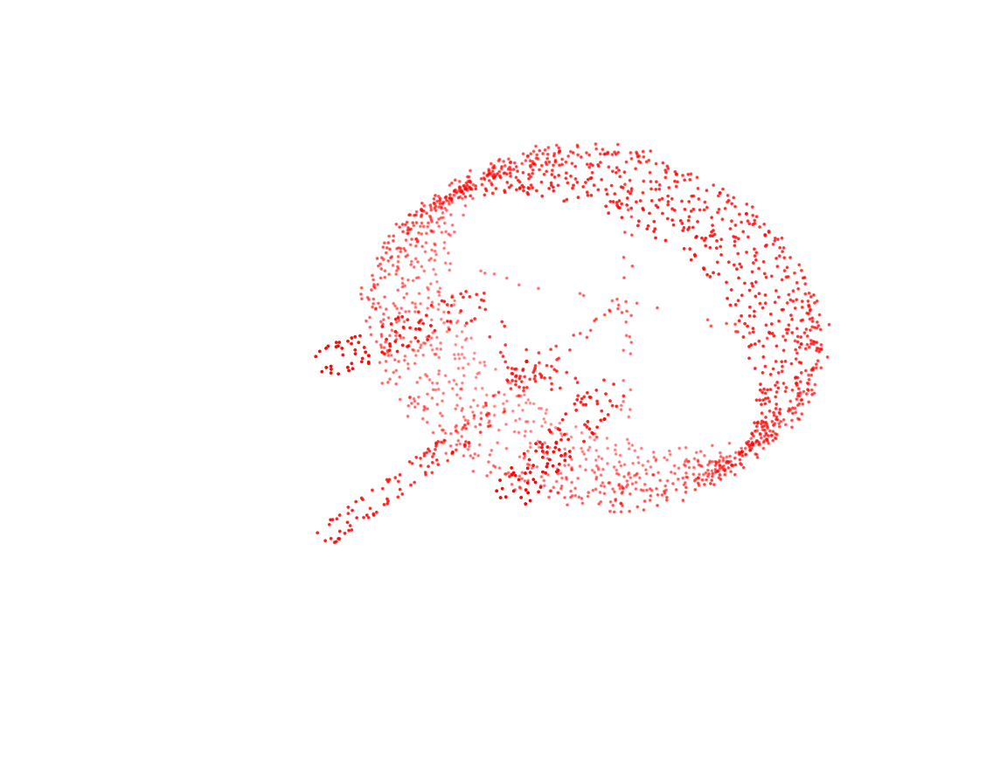

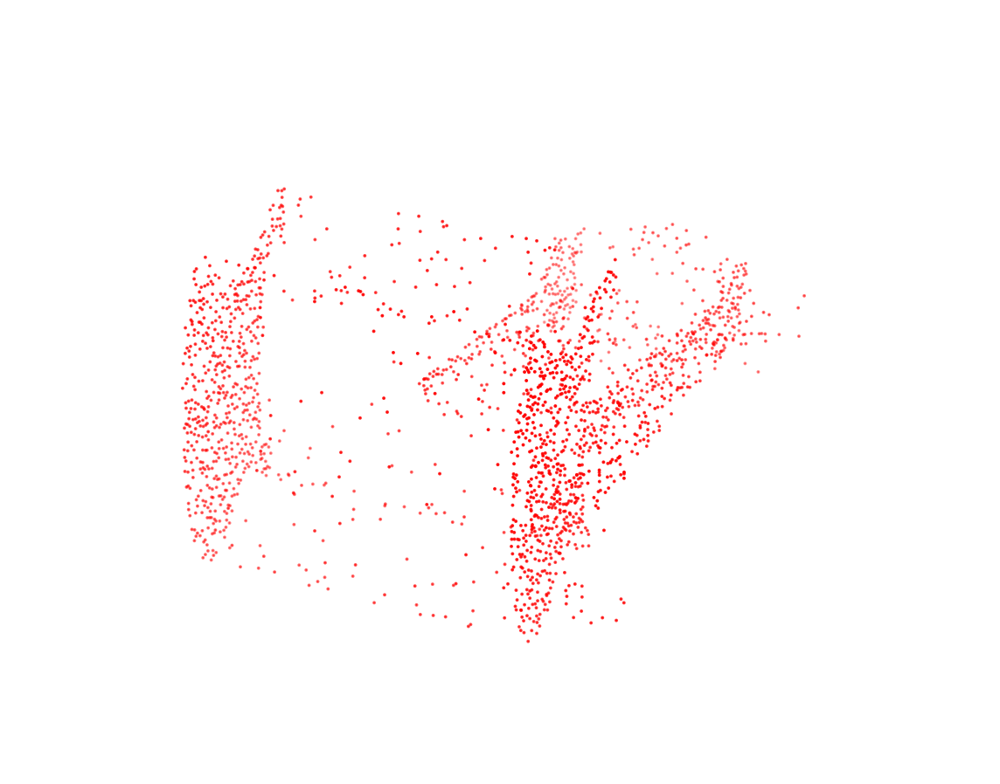

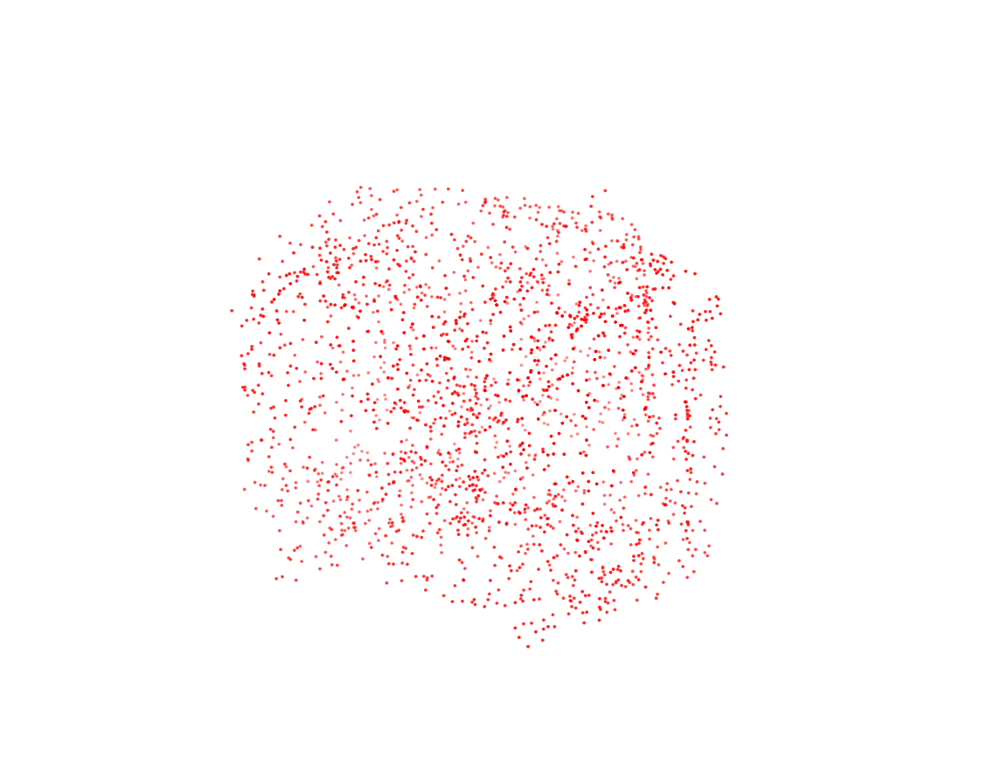

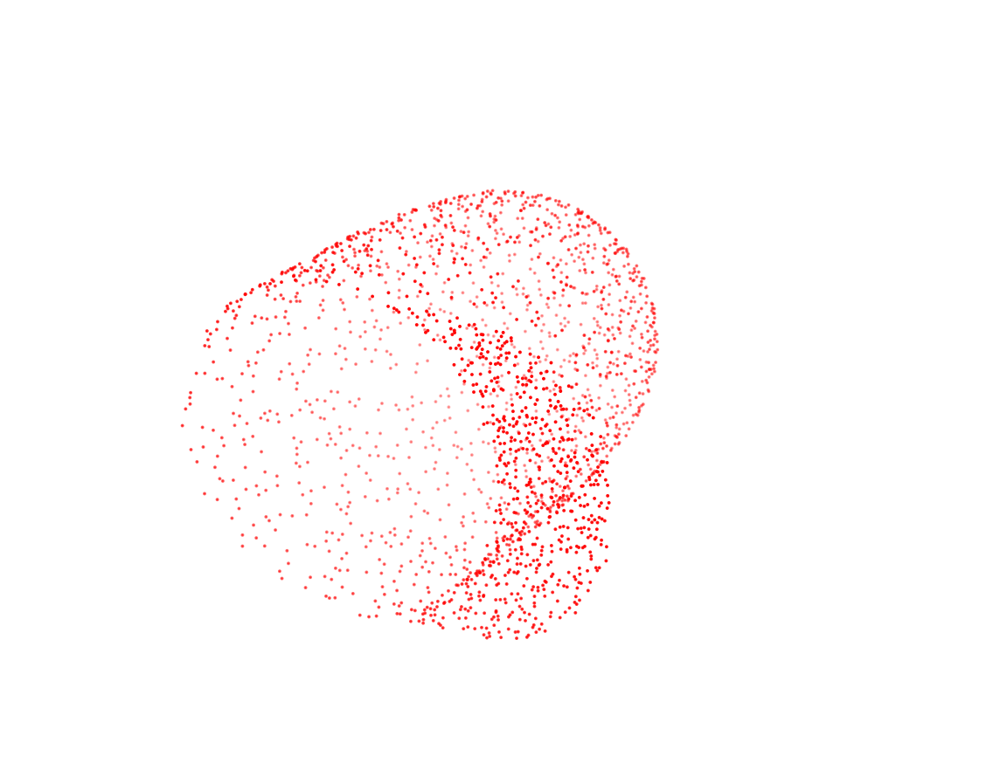

In [50]:
seen_class = set()
for i in range(len(pn_train_data)):
    if pn_train_labels[i][0] not in seen_class:
        visualize_npy(pn_train_data[i], save_img_fpath=None)
        seen_class.add(pn_train_labels[i][0])

# Train a Single AutoDecoder on the PointNet7 Data

In [51]:
adnet_HP = HyperParameter(lr=0.001, epochs=4)
adnet_DS = DirectorySetting()

pn_autodecoder, pn_train_encoding_ds, pn_test_encoding_ds, _, _ = return_decoder_train_test_encoding_ds(
    pn_train_data,
    pn_train_labels,
    pn_test_data,
    pn_test_labels,
    adnet_HP,
    adnet_DS,
    autodecoder=AutoDecoder())

Epoch: 0. batch_idx: 100
Loss:  0.02792750673368573 0.07402810681611299
Epoch: 0. batch_idx: 200
Loss:  0.027201019022613765 0.0689006732404232
Epoch: 0. batch_idx: 300
Loss:  0.027568871900439263 0.06473895274102688


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.024033080404624343 0.05219479132443666
Epoch: 1. batch_idx: 200
Loss:  0.02250216981396079 0.044395891949534416
Epoch: 1. batch_idx: 300
Loss:  0.02242948274128139 0.0419746857509017
Epoch: 2. batch_idx: 100
Loss:  0.017720868289470674 0.031126413308084012
Epoch: 2. batch_idx: 200
Loss:  0.01698012334294617 0.028592599388211966
Epoch: 2. batch_idx: 300
Loss:  0.016503973612561822 0.02758330659940839
Epoch: 3. batch_idx: 100
Loss:  0.01309674805495888 0.020715409023687244
Epoch: 3. batch_idx: 200
Loss:  0.012247191197238862 0.018917577248066662
Epoch: 3. batch_idx: 300
Loss:  0.011967421444132924 0.01848447852768004
0 0.034680687 tensor(5.0522, device='cuda:0', grad_fn=<NormBackward0>)
0 0.056845468 tensor(5.0571, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036904544 tensor(5.1073, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07596967 tensor(5.0172, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03085774 tensor(5.0209, device='cuda:0', grad_fn=<NormBa

0 0.03181832 tensor(5.0524, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05322316 tensor(5.0557, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04318254 tensor(5.0267, device='cuda:0', grad_fn=<NormBackward0>)
0 0.08482837 tensor(5.0749, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039780993 tensor(5.0397, device='cuda:0', grad_fn=<NormBackward0>)
0 0.059356265 tensor(5.1074, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03957064 tensor(5.0415, device='cuda:0', grad_fn=<NormBackward0>)
0 0.060069073 tensor(5.1184, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03429044 tensor(5.0480, device='cuda:0', grad_fn=<NormBackward0>)
0 0.051404536 tensor(5.0396, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03668961 tensor(4.9990, device='cuda:0', grad_fn=<NormBackward0>)
0 0.060325265 tensor(5.0996, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024319379 tensor(5.0476, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07212623 tensor(5.0185, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030825315 

0 0.045318477 tensor(5.0610, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05646354 tensor(5.0187, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03397689 tensor(5.0037, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042541843 tensor(5.0356, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052446205 tensor(5.0716, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04638404 tensor(5.0592, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03057739 tensor(5.0388, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05865925 tensor(5.0315, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042740405 tensor(4.9651, device='cuda:0', grad_fn=<NormBackward0>)
0 0.045387775 tensor(5.1202, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027795533 tensor(5.0502, device='cuda:0', grad_fn=<NormBackward0>)
0 0.056862492 tensor(4.9879, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030779125 tensor(5.0706, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07676876 tensor(5.0251, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02997983

0 0.05406821 tensor(4.9970, device='cuda:0', grad_fn=<NormBackward0>)
0 0.08714871 tensor(4.9963, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026476188 tensor(5.1506, device='cuda:0', grad_fn=<NormBackward0>)
0 0.060568232 tensor(5.0157, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028558662 tensor(5.0119, device='cuda:0', grad_fn=<NormBackward0>)
0 0.066500716 tensor(5.0987, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025691917 tensor(5.0479, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06824108 tensor(5.1127, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026373772 tensor(5.1477, device='cuda:0', grad_fn=<NormBackward0>)
0 0.045723893 tensor(5.1170, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03326259 tensor(5.0891, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04753907 tensor(5.0661, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035259232 tensor(5.0137, device='cuda:0', grad_fn=<NormBackward0>)
0 0.057090953 tensor(5.1167, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0387500

0 0.041261535 tensor(5.0012, device='cuda:0', grad_fn=<NormBackward0>)
0 0.056002595 tensor(5.0521, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030324299 tensor(5.0700, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07470602 tensor(5.0897, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035491165 tensor(5.0518, device='cuda:0', grad_fn=<NormBackward0>)
0 0.072853215 tensor(5.0576, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034504917 tensor(4.9815, device='cuda:0', grad_fn=<NormBackward0>)
0 0.055772327 tensor(5.1465, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035892725 tensor(5.0742, device='cuda:0', grad_fn=<NormBackward0>)
0 0.057109956 tensor(5.0497, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02771642 tensor(5.0638, device='cuda:0', grad_fn=<NormBackward0>)
0 0.060695086 tensor(5.0590, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03673762 tensor(5.0333, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0777199 tensor(4.9664, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0517398

0 0.02649801 tensor(5.0939, device='cuda:0', grad_fn=<NormBackward0>)
0 0.054557443 tensor(5.0595, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026273834 tensor(5.0072, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05981856 tensor(5.0424, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035298828 tensor(4.9827, device='cuda:0', grad_fn=<NormBackward0>)
0 0.059985273 tensor(5.0742, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029305577 tensor(5.0069, device='cuda:0', grad_fn=<NormBackward0>)
0 0.057535425 tensor(5.0884, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028582929 tensor(5.1409, device='cuda:0', grad_fn=<NormBackward0>)
0 0.045374278 tensor(5.0645, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038617272 tensor(4.9770, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06457677 tensor(4.9851, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029733114 tensor(5.0504, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07022166 tensor(5.0551, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039377

0 0.03623666 tensor(4.9217, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05703205 tensor(5.0442, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030254252 tensor(5.0603, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052857798 tensor(5.1006, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042752594 tensor(5.0328, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07091451 tensor(5.1025, device='cuda:0', grad_fn=<NormBackward0>)
0 0.043116424 tensor(5.0854, device='cuda:0', grad_fn=<NormBackward0>)
0 0.061103694 tensor(5.0657, device='cuda:0', grad_fn=<NormBackward0>)
0 0.037428882 tensor(5.0564, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0686364 tensor(5.0080, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039213665 tensor(5.0327, device='cuda:0', grad_fn=<NormBackward0>)
0 0.046753168 tensor(5.0874, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03231262 tensor(4.9333, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05879474 tensor(5.0100, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035122346

0 0.05298346 tensor(5.0413, device='cuda:0', grad_fn=<NormBackward0>)
0 0.063440435 tensor(5.0292, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028655844 tensor(5.0855, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05527197 tensor(5.0750, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032487705 tensor(4.9914, device='cuda:0', grad_fn=<NormBackward0>)
0 0.047040965 tensor(5.0874, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026668482 tensor(5.0184, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05787481 tensor(5.0401, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03937928 tensor(5.0564, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07042372 tensor(5.0471, device='cuda:0', grad_fn=<NormBackward0>)
0 0.033660773 tensor(5.0782, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06509376 tensor(5.0758, device='cuda:0', grad_fn=<NormBackward0>)
0 0.044366978 tensor(4.9914, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0679443 tensor(5.0667, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030095233 

0 0.022698969 tensor(5.1081, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04441036 tensor(5.1671, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03667181 tensor(4.9678, device='cuda:0', grad_fn=<NormBackward0>)
0 0.051531255 tensor(5.0637, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026721641 tensor(5.0266, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06771318 tensor(5.1078, device='cuda:0', grad_fn=<NormBackward0>)
0 0.048394166 tensor(4.9756, device='cuda:0', grad_fn=<NormBackward0>)
0 0.056846373 tensor(5.1437, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031131856 tensor(5.1119, device='cuda:0', grad_fn=<NormBackward0>)
0 0.053179074 tensor(5.1184, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028810995 tensor(4.9893, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0649458 tensor(5.0277, device='cuda:0', grad_fn=<NormBackward0>)
0 0.051454548 tensor(5.0315, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06540943 tensor(5.0699, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04865066

0 0.03604188 tensor(5.0329, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06347886 tensor(5.0005, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031983074 tensor(5.0547, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06113003 tensor(5.1060, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04968675 tensor(4.9444, device='cuda:0', grad_fn=<NormBackward0>)
0 0.053349953 tensor(5.1315, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034964405 tensor(5.0121, device='cuda:0', grad_fn=<NormBackward0>)
0 0.062915325 tensor(5.0212, device='cuda:0', grad_fn=<NormBackward0>)
0 0.055801 tensor(4.9874, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05653244 tensor(5.0264, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03725402 tensor(5.0757, device='cuda:0', grad_fn=<NormBackward0>)
0 0.053348515 tensor(5.1144, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028723726 tensor(5.0529, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07317343 tensor(5.1365, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026586836 te

0 0.033977415 tensor(5.0091, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0579048 tensor(5.0801, device='cuda:0', grad_fn=<NormBackward0>)
0 0.055055052 tensor(4.9933, device='cuda:0', grad_fn=<NormBackward0>)
0 0.055814706 tensor(5.0014, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03280815 tensor(4.9986, device='cuda:0', grad_fn=<NormBackward0>)
0 0.050231945 tensor(5.1298, device='cuda:0', grad_fn=<NormBackward0>)
0 0.033694234 tensor(5.0549, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052234203 tensor(4.9685, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031957153 tensor(4.9403, device='cuda:0', grad_fn=<NormBackward0>)
0 0.061727516 tensor(5.0241, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035891704 tensor(4.9818, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06533635 tensor(5.0278, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04527395 tensor(5.0497, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05666339 tensor(5.1496, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03091654

0 0.044148665 tensor(5.0985, device='cuda:0', grad_fn=<NormBackward0>)
0 0.056123395 tensor(5.1175, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0343682 tensor(5.0492, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06927478 tensor(5.1026, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02305142 tensor(5.0173, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052779745 tensor(5.0725, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027909208 tensor(4.9755, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05696241 tensor(5.0377, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026354799 tensor(5.0869, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06545343 tensor(5.1162, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029367706 tensor(5.1449, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05829709 tensor(5.0550, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034645014 tensor(4.9548, device='cuda:0', grad_fn=<NormBackward0>)
0 0.060140807 tensor(5.0759, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02783212 

0 0.03371686 tensor(4.9676, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06314213 tensor(5.1355, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04064825 tensor(5.0303, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06061898 tensor(4.9870, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03207505 tensor(5.1256, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07564704 tensor(5.0081, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02622982 tensor(5.0767, device='cuda:0', grad_fn=<NormBackward0>)
0 0.059320632 tensor(5.0235, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026761252 tensor(5.0483, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06699964 tensor(5.0700, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036061108 tensor(5.0256, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04184787 tensor(5.0598, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04161517 tensor(5.0914, device='cuda:0', grad_fn=<NormBackward0>)
0 0.058750592 tensor(5.0526, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04280715 ten

0 0.031060617 tensor(5.0821, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05867965 tensor(5.0996, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038297296 tensor(5.0305, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0522832 tensor(5.0739, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030084077 tensor(5.1135, device='cuda:0', grad_fn=<NormBackward0>)
0 0.072836354 tensor(5.1301, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028396554 tensor(4.9941, device='cuda:0', grad_fn=<NormBackward0>)
0 0.08957042 tensor(5.0788, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042767655 tensor(5.0372, device='cuda:0', grad_fn=<NormBackward0>)
0 0.076178275 tensor(5.0063, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03681055 tensor(5.0566, device='cuda:0', grad_fn=<NormBackward0>)
0 0.06210241 tensor(5.0279, device='cuda:0', grad_fn=<NormBackward0>)
0 0.044038862 tensor(5.0694, device='cuda:0', grad_fn=<NormBackward0>)
0 0.053676024 tensor(5.0775, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03855113

0 0.035787903 tensor(5.0516, device='cuda:0', grad_fn=<NormBackward0>)
0 0.050607674 tensor(5.0713, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02886148 tensor(4.9282, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052027624 tensor(5.0618, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0370125 tensor(5.1088, device='cuda:0', grad_fn=<NormBackward0>)
0 0.053142708 tensor(5.1491, device='cuda:0', grad_fn=<NormBackward0>)
0 0.043536816 tensor(5.0979, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0789457 tensor(5.0618, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032759782 tensor(5.0531, device='cuda:0', grad_fn=<NormBackward0>)
0 0.061672084 tensor(5.0757, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028014677 tensor(5.0564, device='cuda:0', grad_fn=<NormBackward0>)
0 0.071169436 tensor(5.0654, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03163648 tensor(5.0063, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05042203 tensor(5.1611, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032787815

## Train Single CompNet on PointNet7 Data

In [52]:
# train the ensemble compnet
cpnet_HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)
cpnet_DS = DirectorySetting()

pn_compnet = train_compnet(
    cpnet_HP, cpnet_DS,
    train_ds=pn_train_encoding_ds,
    save_wt_fname='pnet_compnet.pth')

Epoch: 0. batch_idx: 100
Loss:  0.45119705006480215 0.6210848042368888
Epoch: 0. batch_idx: 200
Loss:  0.4149283340573311 0.40889142841100695
Epoch: 0. batch_idx: 300
Loss:  0.3984580562263727 0.3499783651530743
Epoch: 0. batch_idx: 400
Loss:  0.39836061220616104 0.3528017602860928
Epoch: 0. batch_idx: 500
Loss:  0.36851657181978226 0.3128637083619833
Epoch: 0. batch_idx: 600
Loss:  0.37205912083387377 0.3118367223441601
Epoch: 1. batch_idx: 100
Loss:  0.3257027789205313 0.29659659452736375
Epoch: 1. batch_idx: 200
Loss:  0.35201486997306347 0.3041035959869623
Epoch: 1. batch_idx: 300
Loss:  0.3415502369403839 0.3139690238982439
Epoch: 1. batch_idx: 400
Loss:  0.32152691908180714 0.3064270268380642
Epoch: 1. batch_idx: 500
Loss:  0.3132331009954214 0.29214654192328454
Epoch: 1. batch_idx: 600
Loss:  0.3095275903493166 0.2811698204651475
Epoch: 2. batch_idx: 100
Loss:  0.2996087158471346 0.3123095943778753
Epoch: 2. batch_idx: 200
Loss:  0.31137064784765245 0.28640024960041044
Epoch: 2.

Epoch: 19. batch_idx: 300
Loss:  0.16916123643517494 0.1707303555868566
Epoch: 19. batch_idx: 400
Loss:  0.16781354323029518 0.17567468237131834
Epoch: 19. batch_idx: 500
Loss:  0.18183551087975502 0.18898883597925306
Epoch: 19. batch_idx: 600
Loss:  0.17295080438256263 0.17491342425346373


## Evaluate Single CompNet on PointNet7 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.9406027549228066
After 677 batches and 10817 test points

Metrics for the same class:
Avg loss: 0.1723970982770228
Precision: 0.9473437206682936
Recall: 0.9330683183877231
F1 Score: 0.9401518327045782

Metrics for the diff class:
Avg loss: 0.14953662362637513
Precision: 0.9340619307832423
Recall: 0.9481371914578903
F1 Score: 0.9410469330641831


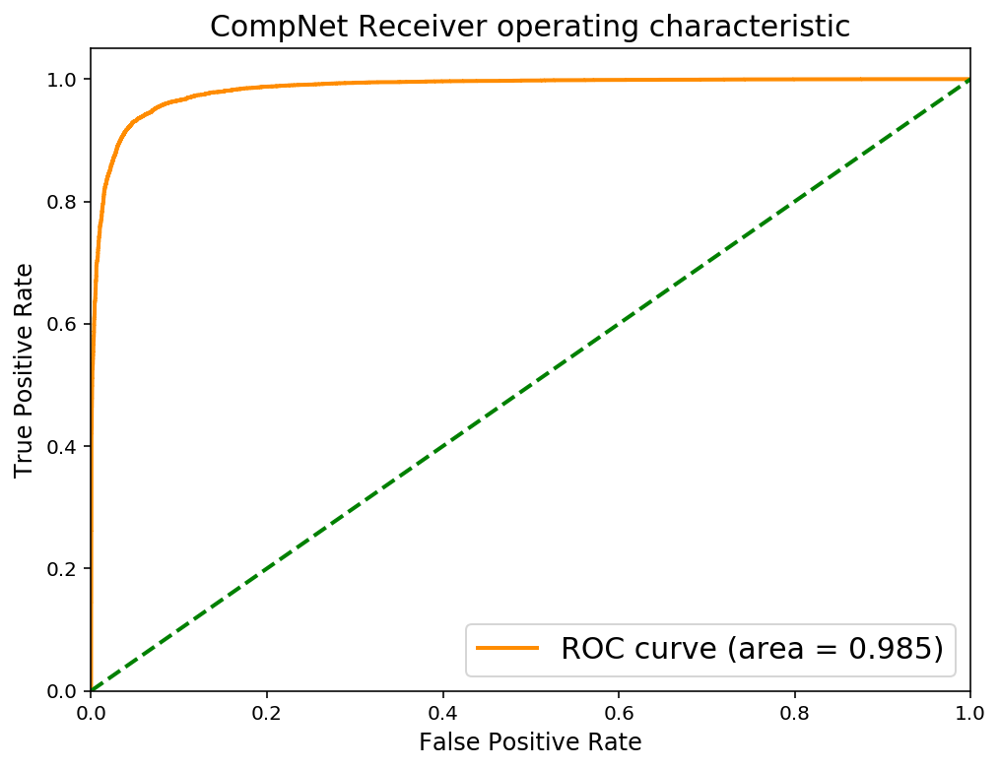

(116.71283553354442,
 101.23629419505596,
 10093.0,
 10256.0,
 724.0,
 561.0,
 677,
 10817)

In [53]:
eval_compnet(pn_compnet, pn_train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.8723573992820104
After 157 batches and 2507 test points

Metrics for the same class:
Avg loss: 0.37407367892420973
Precision: 0.88526619892695
Recall: 0.8556043079377742
F1 Score: 0.8701825557809331

Metrics for the diff class:
Avg loss: 0.2871012347424106
Precision: 0.8602856040138942
Recall: 0.8891104906262465
F1 Score: 0.8744605727736366


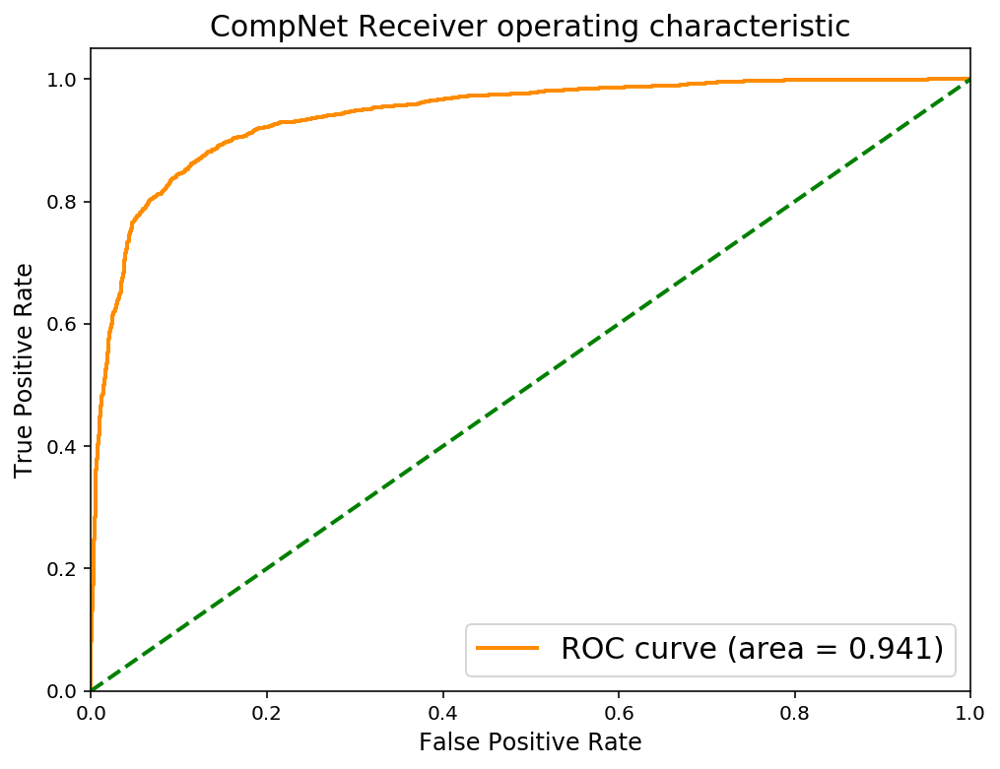

(58.72956759110093, 45.07489385455847, 2145.0, 2229.0, 362.0, 278.0, 157, 2507)

In [54]:
eval_compnet(pn_compnet, pn_test_encoding_ds)

## Train Ensemble CompNet on PointNet7 Data

In [55]:
# train the ensemble compnet
cpnet_HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)
cpnet_DS = DirectorySetting()

pn_ens_compnet = train_compnet(
    cpnet_HP, cpnet_DS,
    train_ds=pn_train_encoding_ds,
    compnet=EnsembleCompNet(),
    save_wt_fname='pnet_compnet.pth')

Epoch: 0. batch_idx: 100
Loss:  0.8220757299661636 0.5913117718696594
Epoch: 0. batch_idx: 200
Loss:  0.6936331874132157 0.6806840097904205
Epoch: 0. batch_idx: 300
Loss:  0.5434841784834862 0.7429079347848893
Epoch: 0. batch_idx: 400
Loss:  0.4092731437087059 0.6874601513147354
Epoch: 0. batch_idx: 500
Loss:  0.3134233531355858 0.5911762323975563
Epoch: 0. batch_idx: 600
Loss:  0.24993241399526597 0.530368954539299


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.21622253358364105 0.47326146364212035
Epoch: 1. batch_idx: 200
Loss:  0.1805757176876068 0.41697041511535643
Epoch: 1. batch_idx: 300
Loss:  0.1618541695177555 0.3791739296913147
Epoch: 1. batch_idx: 400
Loss:  0.15064361594617368 0.3648285585641861
Epoch: 1. batch_idx: 500
Loss:  0.14094173703342677 0.33682512149214744
Epoch: 1. batch_idx: 600
Loss:  0.13091408571228386 0.32848184540867803
Epoch: 2. batch_idx: 100
Loss:  0.12312590254470707 0.2840460726618767
Epoch: 2. batch_idx: 200
Loss:  0.10989981259219349 0.2738498508930206
Epoch: 2. batch_idx: 300
Loss:  0.10415781673043967 0.25304007589817046
Epoch: 2. batch_idx: 400
Loss:  0.10988696578890085 0.2530835178494453
Epoch: 2. batch_idx: 500
Loss:  0.09794537082314492 0.2363594028353691
Epoch: 2. batch_idx: 600
Loss:  0.09948431367985905 0.23283459708094598
Epoch: 3. batch_idx: 100
Loss:  0.08243655391968786 0.21089291647076608
Epoch: 3. batch_idx: 200
Loss:  0.08098835228942335 0.19109333179891108


Epoch: 19. batch_idx: 600
Loss:  0.03177099718972386 0.04076090629212558


## Evaluate CompNet on PointNet7 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.9925117870019414
After 677 batches and 10817 test points

Metrics for the same class:
Avg loss: 0.033202621746828136
Precision: 0.9958120055839925
Recall: 0.9891836923361376
F1 Score: 0.9924867823021982

Metrics for the diff class:
Avg loss: 0.026081788484997596
Precision: 0.9892552116815134
Recall: 0.9958398816677452
F1 Score: 0.9925366258177463


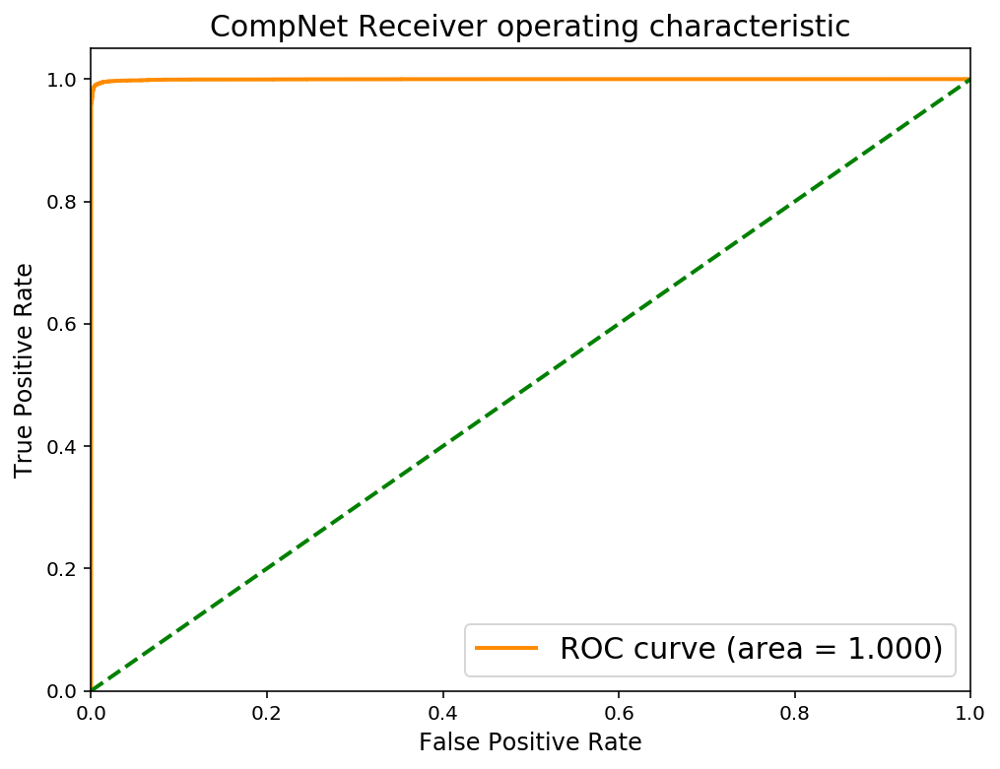

(22.478174922602648,
 17.657370804343373,
 10700.0,
 10772.0,
 117.0,
 45.0,
 677,
 10817)

In [56]:
eval_compnet(pn_ens_compnet, pn_train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.9818508177104108
After 157 batches and 2507 test points

Metrics for the same class:
Avg loss: 0.058432539292532816
Precision: 0.9839743589743589
Recall: 0.9796569605105704
F1 Score: 0.9818109134519288

Metrics for the diff class:
Avg loss: 0.05577536323552678
Precision: 0.9797458300238284
Recall: 0.9840446749102513
F1 Score: 0.9818905472636815


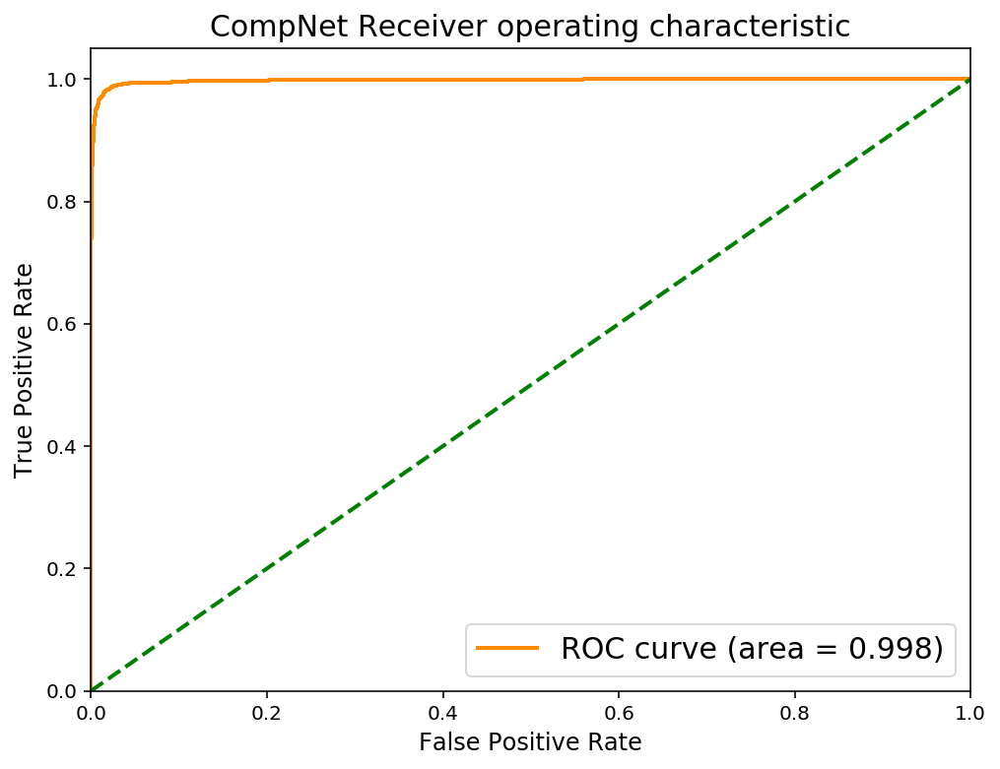

(9.173908668927652, 8.756732027977705, 2456.0, 2467.0, 51.0, 40.0, 157, 2507)

In [57]:
eval_compnet(pn_ens_compnet, pn_test_encoding_ds)

# Train a Ensemble AutoDecoder on the PointNet7 Data

In [58]:
adnet_HP = HyperParameter(lr=0.001, epochs=4)
adnet_DS = DirectorySetting()

pn_autodecoder, pn_train_encoding_ds, pn_test_encoding_ds, _, _ = return_decoder_train_test_encoding_ds(
    pn_train_data,
    pn_train_labels,
    pn_test_data,
    pn_test_labels,
    adnet_HP,
    adnet_DS,
    autodecoder=EnsembleAutoDecoder(ensemble_adnet))

Epoch: 0. batch_idx: 100
Loss:  0.027461186964064837 0.07792052533477545
Epoch: 0. batch_idx: 200
Loss:  0.027082774406298995 0.06867725823074579
Epoch: 0. batch_idx: 300
Loss:  0.028558639418333767 0.06390802834182978


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.025897273086011408 0.052100468799471854
Epoch: 1. batch_idx: 200
Loss:  0.023133582258597015 0.04525766246020794
Epoch: 1. batch_idx: 300
Loss:  0.023006589245051147 0.040770938396453855
Epoch: 2. batch_idx: 100
Loss:  0.017021731082350014 0.028787138648331167
Epoch: 2. batch_idx: 200
Loss:  0.01618741993792355 0.025763420909643172
Epoch: 2. batch_idx: 300
Loss:  0.016078050639480354 0.024256796073168517
Epoch: 3. batch_idx: 100
Loss:  0.01324155503883958 0.01857175201177597
Epoch: 3. batch_idx: 200
Loss:  0.012376779541373253 0.016939488491043448
Epoch: 3. batch_idx: 300
Loss:  0.012233995953574777 0.01647273319773376
0 0.030048002 tensor(4.9552, device='cuda:0', grad_fn=<NormBackward0>)
0 0.045791052 tensor(5.0589, device='cuda:0', grad_fn=<NormBackward0>)
0 0.021049315 tensor(5.0759, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03903984 tensor(5.0447, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030518427 tensor(4.9936, device='cuda:0', grad_fn=<N

0 0.041069504 tensor(4.9810, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05371133 tensor(5.0505, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036767736 tensor(5.0580, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034100156 tensor(4.9839, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04822145 tensor(5.1614, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032722715 tensor(5.0642, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04825384 tensor(4.9965, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039327625 tensor(5.1352, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0418031 tensor(5.0579, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03363552 tensor(5.1141, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039923567 tensor(5.0795, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028413005 tensor(4.9946, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042223476 tensor(5.0648, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026616506 tensor(5.0713, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02946303

0 0.053990442 tensor(4.9525, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027894145 tensor(4.9974, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03697485 tensor(5.0065, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04408449 tensor(5.1008, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036497813 tensor(5.0491, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02587875 tensor(5.0467, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0360375 tensor(5.0804, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03381452 tensor(5.0381, device='cuda:0', grad_fn=<NormBackward0>)
0 0.046877906 tensor(5.0824, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027385991 tensor(5.0569, device='cuda:0', grad_fn=<NormBackward0>)
0 0.044599567 tensor(4.9990, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024115158 tensor(5.0051, device='cuda:0', grad_fn=<NormBackward0>)
0 0.037522346 tensor(5.0069, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02993628 tensor(5.1334, device='cuda:0', grad_fn=<NormBackward0>)
0 0.043902162

0 0.038397256 tensor(5.0051, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024746245 tensor(5.1096, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03283121 tensor(5.0189, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038513213 tensor(5.0614, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032617487 tensor(5.0283, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03033648 tensor(5.1402, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03712094 tensor(5.0312, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027168605 tensor(5.0183, device='cuda:0', grad_fn=<NormBackward0>)
0 0.061102122 tensor(5.0992, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02702188 tensor(5.0509, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032651905 tensor(5.0861, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024225488 tensor(5.1795, device='cuda:0', grad_fn=<NormBackward0>)
0 0.044941634 tensor(5.1099, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026961202 tensor(5.1078, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035745

0 0.041271225 tensor(5.0965, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03951513 tensor(5.0755, device='cuda:0', grad_fn=<NormBackward0>)
0 0.051229715 tensor(5.1114, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030489841 tensor(5.0680, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04824628 tensor(4.9793, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026953533 tensor(5.0523, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038107626 tensor(5.1007, device='cuda:0', grad_fn=<NormBackward0>)
0 0.049574587 tensor(5.0395, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03665134 tensor(5.0851, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038297914 tensor(5.1618, device='cuda:0', grad_fn=<NormBackward0>)
0 0.048656598 tensor(5.0583, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029575879 tensor(5.0740, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034283686 tensor(5.0050, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032080226 tensor(5.1015, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03534

0 0.02450094 tensor(5.0982, device='cuda:0', grad_fn=<NormBackward0>)
0 0.033877086 tensor(5.1309, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035092395 tensor(5.0973, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026195072 tensor(5.1091, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02752165 tensor(5.0381, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038369533 tensor(4.9913, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027805954 tensor(5.0657, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03780861 tensor(5.0428, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034808617 tensor(5.0535, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038777918 tensor(5.0039, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029657567 tensor(5.0541, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036088303 tensor(5.0316, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03921805 tensor(5.1470, device='cuda:0', grad_fn=<NormBackward0>)
0 0.044495925 tensor(5.0709, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024021

0 0.03474428 tensor(5.0043, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032443605 tensor(5.1086, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052234367 tensor(5.0348, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03274475 tensor(5.0682, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028518785 tensor(5.1364, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025814403 tensor(5.0550, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03861964 tensor(5.0149, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035982847 tensor(5.0613, device='cuda:0', grad_fn=<NormBackward0>)
0 0.037228797 tensor(4.9230, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026609262 tensor(5.1161, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04187805 tensor(5.0495, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029727554 tensor(5.0590, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039419893 tensor(4.9869, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025220606 tensor(4.9844, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039479

0 0.045213334 tensor(5.0713, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030677808 tensor(4.9825, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03562858 tensor(5.0477, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02824059 tensor(5.0588, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039610174 tensor(5.0213, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02668783 tensor(4.9696, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030108629 tensor(5.0319, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032538988 tensor(4.9265, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04177983 tensor(4.9808, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0407757 tensor(5.0281, device='cuda:0', grad_fn=<NormBackward0>)
0 0.07326453 tensor(5.0709, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04519764 tensor(5.1228, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0471679 tensor(5.0190, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025585348 tensor(5.0441, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036112934 te

0 0.024295907 tensor(5.0874, device='cuda:0', grad_fn=<NormBackward0>)
0 0.043077372 tensor(5.0579, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027254956 tensor(5.1226, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029183803 tensor(5.0398, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025810711 tensor(5.0780, device='cuda:0', grad_fn=<NormBackward0>)
0 0.040145572 tensor(5.0785, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028240947 tensor(5.0835, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04298889 tensor(4.9919, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024465969 tensor(5.1389, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036611475 tensor(4.9732, device='cuda:0', grad_fn=<NormBackward0>)
0 0.040950492 tensor(5.0937, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031184373 tensor(5.0142, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036751054 tensor(4.9821, device='cuda:0', grad_fn=<NormBackward0>)
0 0.033509355 tensor(5.0192, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031

0 0.03496114 tensor(5.0435, device='cuda:0', grad_fn=<NormBackward0>)
0 0.039795775 tensor(5.0621, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029860202 tensor(4.9620, device='cuda:0', grad_fn=<NormBackward0>)
0 0.045976352 tensor(5.1393, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027448434 tensor(5.0046, device='cuda:0', grad_fn=<NormBackward0>)
0 0.037788138 tensor(5.0007, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02660838 tensor(5.0655, device='cuda:0', grad_fn=<NormBackward0>)
0 0.040497288 tensor(5.0147, device='cuda:0', grad_fn=<NormBackward0>)
0 0.026552401 tensor(4.9405, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03422829 tensor(5.0627, device='cuda:0', grad_fn=<NormBackward0>)
0 0.046385914 tensor(5.0516, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035662632 tensor(5.0830, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02087619 tensor(5.0589, device='cuda:0', grad_fn=<NormBackward0>)
0 0.033962544 tensor(5.0947, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031103

0 0.02703656 tensor(5.1064, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03657753 tensor(5.1136, device='cuda:0', grad_fn=<NormBackward0>)
0 0.041099265 tensor(5.0444, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027997388 tensor(4.9679, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027839292 tensor(5.0480, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0453414 tensor(5.0227, device='cuda:0', grad_fn=<NormBackward0>)
0 0.041814297 tensor(5.0318, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03180774 tensor(5.0339, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032126058 tensor(5.0939, device='cuda:0', grad_fn=<NormBackward0>)
0 0.040354885 tensor(5.0559, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03393514 tensor(5.1048, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03175197 tensor(5.1167, device='cuda:0', grad_fn=<NormBackward0>)
0 0.023877067 tensor(5.0012, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0535924 tensor(5.0939, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025863912 t

0 0.040594555 tensor(5.1011, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03699464 tensor(5.0696, device='cuda:0', grad_fn=<NormBackward0>)
0 0.040085737 tensor(4.9802, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0320528 tensor(5.1008, device='cuda:0', grad_fn=<NormBackward0>)
0 0.054956876 tensor(5.0521, device='cuda:0', grad_fn=<NormBackward0>)
0 0.043003697 tensor(5.0671, device='cuda:0', grad_fn=<NormBackward0>)
0 0.054023117 tensor(5.0225, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02897625 tensor(5.0798, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04203493 tensor(4.9909, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03498741 tensor(5.1243, device='cuda:0', grad_fn=<NormBackward0>)
0 0.033277575 tensor(5.0130, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029937757 tensor(5.0889, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03936505 tensor(4.9720, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034009997 tensor(5.0822, device='cuda:0', grad_fn=<NormBackward0>)
0 0.040820926

0 0.04151458 tensor(4.9270, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03929163 tensor(5.0345, device='cuda:0', grad_fn=<NormBackward0>)
0 0.048290174 tensor(5.0404, device='cuda:0', grad_fn=<NormBackward0>)
0 0.02608706 tensor(5.0525, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042085763 tensor(5.0651, device='cuda:0', grad_fn=<NormBackward0>)
0 0.027841143 tensor(5.0089, device='cuda:0', grad_fn=<NormBackward0>)
0 0.036736634 tensor(5.0838, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03685947 tensor(5.0993, device='cuda:0', grad_fn=<NormBackward0>)
0 0.058264937 tensor(5.0661, device='cuda:0', grad_fn=<NormBackward0>)
0 0.021974007 tensor(5.0098, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031156532 tensor(5.1213, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042452525 tensor(5.0938, device='cuda:0', grad_fn=<NormBackward0>)
0 0.04104539 tensor(4.9892, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03468334 tensor(5.0735, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03635125

0 0.033715993 tensor(5.0316, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031993575 tensor(4.9755, device='cuda:0', grad_fn=<NormBackward0>)
0 0.038890973 tensor(5.0553, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032002416 tensor(4.9881, device='cuda:0', grad_fn=<NormBackward0>)
0 0.046018764 tensor(5.0383, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03900155 tensor(5.0588, device='cuda:0', grad_fn=<NormBackward0>)
0 0.051278558 tensor(5.0370, device='cuda:0', grad_fn=<NormBackward0>)
0 0.031374395 tensor(4.9881, device='cuda:0', grad_fn=<NormBackward0>)
0 0.035423983 tensor(4.9878, device='cuda:0', grad_fn=<NormBackward0>)
0 0.024385395 tensor(5.1428, device='cuda:0', grad_fn=<NormBackward0>)
0 0.05347085 tensor(5.0656, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030975651 tensor(5.0922, device='cuda:0', grad_fn=<NormBackward0>)
0 0.052225456 tensor(5.0147, device='cuda:0', grad_fn=<NormBackward0>)
0 0.030379796 tensor(5.0374, device='cuda:0', grad_fn=<NormBackward0>)
0 0.0396

0 0.022710413 tensor(5.1081, device='cuda:0', grad_fn=<NormBackward0>)
0 0.034432784 tensor(5.0677, device='cuda:0', grad_fn=<NormBackward0>)
0 0.032865204 tensor(5.0229, device='cuda:0', grad_fn=<NormBackward0>)
0 0.045226324 tensor(5.0116, device='cuda:0', grad_fn=<NormBackward0>)
0 0.03502542 tensor(5.0873, device='cuda:0', grad_fn=<NormBackward0>)
0 0.056777988 tensor(5.1044, device='cuda:0', grad_fn=<NormBackward0>)
0 0.025567135 tensor(5.0909, device='cuda:0', grad_fn=<NormBackward0>)
0 0.055919312 tensor(5.0637, device='cuda:0', grad_fn=<NormBackward0>)
0 0.029699968 tensor(5.0345, device='cuda:0', grad_fn=<NormBackward0>)
0 0.047522884 tensor(5.0367, device='cuda:0', grad_fn=<NormBackward0>)
0 0.042756144 tensor(5.1055, device='cuda:0', grad_fn=<NormBackward0>)
0 0.044783216 tensor(5.0154, device='cuda:0', grad_fn=<NormBackward0>)
0 0.020352947 tensor(5.0371, device='cuda:0', grad_fn=<NormBackward0>)
0 0.028118977 tensor(5.1220, device='cuda:0', grad_fn=<NormBackward0>)
0 0.022

## Train single CompNet on PointNet7 data

In [59]:
# train the ensemble compnet
cpnet_HP = HyperParameter(epochs=20, batch_size=16, lr=0.001)
cpnet_DS = DirectorySetting()

ens_compnet = train_compnet(
    cpnet_HP, cpnet_DS,
    train_ds=pn_train_encoding_ds,
    save_wt_fname='pnet_compnet.pth')

Epoch: 0. batch_idx: 100
Loss:  0.5059375965595245 0.6052111461758614
Epoch: 0. batch_idx: 200
Loss:  0.4683020494878292 0.4438610208034515
Epoch: 0. batch_idx: 300
Loss:  0.45566567316651346 0.41911479622125625
Epoch: 0. batch_idx: 400
Loss:  0.4531811325252056 0.3904405722022057
Epoch: 0. batch_idx: 500
Loss:  0.4511760801076889 0.40168988570570946
Epoch: 0. batch_idx: 600
Loss:  0.44379100903868673 0.3841362962126732
Epoch: 1. batch_idx: 100
Loss:  0.42655506879091265 0.3817349648475647
Epoch: 1. batch_idx: 200
Loss:  0.415731888115406 0.37380329295992853
Epoch: 1. batch_idx: 300
Loss:  0.4227003659307957 0.3635453735291958
Epoch: 1. batch_idx: 400
Loss:  0.4093382541835308 0.3641574996709824
Epoch: 1. batch_idx: 500
Loss:  0.4014919322729111 0.37424861416220667
Epoch: 1. batch_idx: 600
Loss:  0.4015661442279816 0.36799425646662715
Epoch: 2. batch_idx: 100
Loss:  0.3952370895445347 0.36442031532526015
Epoch: 2. batch_idx: 200
Loss:  0.38570133581757543 0.3573858217149973
Epoch: 2. b

Epoch: 19. batch_idx: 300
Loss:  0.26607139967381954 0.2527517618238926
Epoch: 19. batch_idx: 400
Loss:  0.25023109178990127 0.25209747813642025
Epoch: 19. batch_idx: 500
Loss:  0.2620061181485653 0.2356371334195137
Epoch: 19. batch_idx: 600
Loss:  0.25622390896081926 0.2575325148552656


## Evaluate Single CompNet on PointNet7 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.9075529259498937
After 677 batches and 10817 test points

Metrics for the same class:
Avg loss: 0.250206512515949
Precision: 0.9236091092533871
Recall: 0.8886012757696219
F1 Score: 0.9057670561628345

Metrics for the diff class:
Avg loss: 0.22117826196762624
Precision: 0.8926694575576735
Recall: 0.9265045761301655
F1 Score: 0.9092723643621846


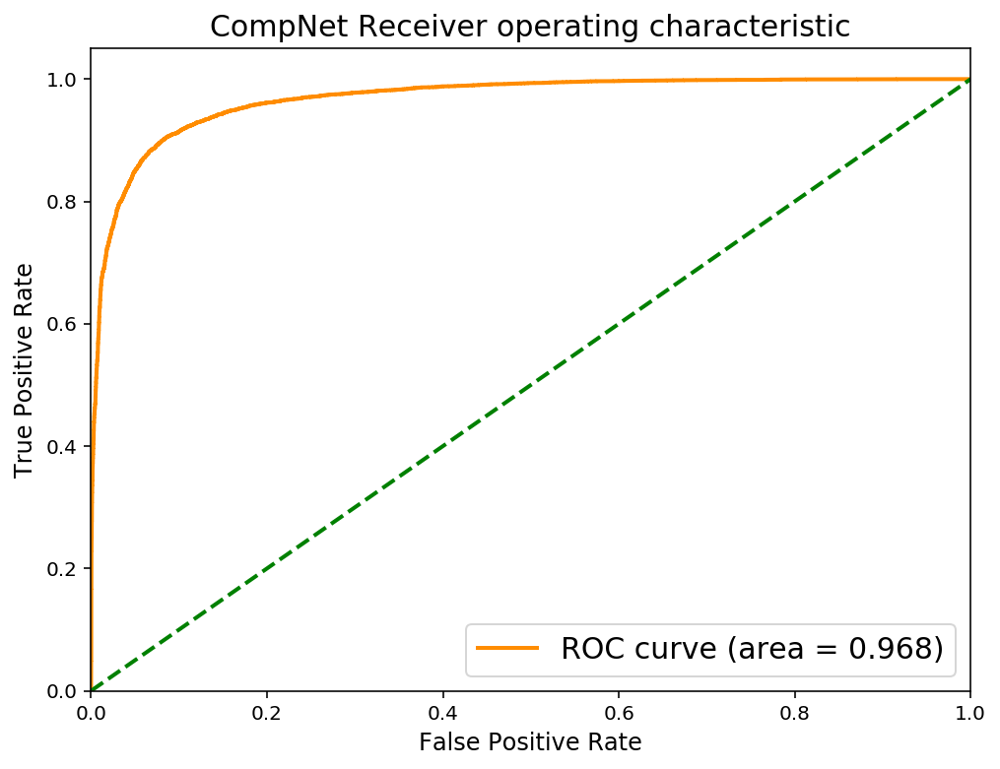

(169.38980897329748,
 149.73768335208297,
 9612.0,
 10022.0,
 1205.0,
 795.0,
 677,
 10817)

In [60]:
eval_compnet(ens_compnet, pn_train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.8161148783406462
After 157 batches and 2507 test points

Metrics for the same class:
Avg loss: 0.4606546314468809
Precision: 0.8311742582532387
Recall: 0.7933785400877543
F1 Score: 0.8118367346938776

Metrics for the diff class:
Avg loss: 0.40844153541668204
Precision: 0.8023655093475772
Recall: 0.8388512165935381
F1 Score: 0.8202028081123246


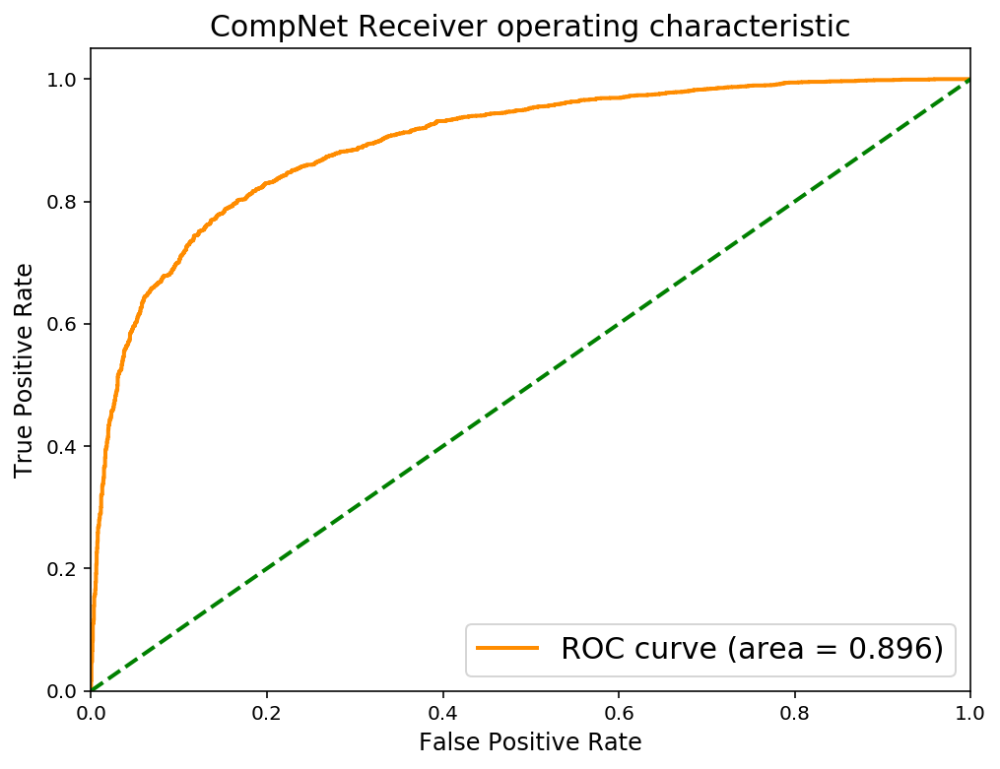

(72.3227771371603, 64.12532106041908, 1989.0, 2103.0, 518.0, 404.0, 157, 2507)

In [61]:
eval_compnet(ens_compnet, pn_test_encoding_ds)

## Train Ensemble CompNet on PointNet7 Data

In [62]:
ensemble_HP = HyperParameter(lr=0.001, batch_size=16)
ensemble_DS = DirectorySetting()

# Train with the ensemble net
ens_compnet_ensemble = train_compnet(ensemble_HP, ensemble_DS,
                                     train_ds=pn_train_encoding_ds,
                                     compnet=EnsembleCompNet(),
                                     save_wt_fname='pnet_ensemble1.pth')

Epoch: 0. batch_idx: 100
Loss:  0.821981583237648 0.5902196991443635
Epoch: 0. batch_idx: 200
Loss:  0.7058919990062713 0.6713322484493256
Epoch: 0. batch_idx: 300
Loss:  0.5669656628370285 0.7324939382076263
Epoch: 0. batch_idx: 400
Loss:  0.44122603982687 0.6762855768203735
Epoch: 0. batch_idx: 500
Loss:  0.3616497087478638 0.612872379720211
Epoch: 0. batch_idx: 600
Loss:  0.30721490070223806 0.5613039600849151


/home/mmvc/.conda/envs/sss_pytorch/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch: 1. batch_idx: 100
Loss:  0.24738628685474395 0.47855951339006425
Epoch: 1. batch_idx: 200
Loss:  0.24126920804381372 0.4440787714719772
Epoch: 1. batch_idx: 300
Loss:  0.2291489002108574 0.4231519716978073
Epoch: 1. batch_idx: 400
Loss:  0.19611706465482712 0.39639327526092527
Epoch: 1. batch_idx: 500
Loss:  0.19301041051745416 0.3615534636378288
Epoch: 1. batch_idx: 600
Loss:  0.179045301489532 0.3520124001801014
Epoch: 2. batch_idx: 100
Loss:  0.18288371643051504 0.3266007362306118
Epoch: 2. batch_idx: 200
Loss:  0.16436860222369432 0.2950806449353695
Epoch: 2. batch_idx: 300
Loss:  0.13573883164674044 0.2651724673807621
Epoch: 2. batch_idx: 400
Loss:  0.15730261063203216 0.29156911611557007
Epoch: 2. batch_idx: 500
Loss:  0.15047698811627924 0.27124587416648865
Epoch: 2. batch_idx: 600
Loss:  0.138552488964051 0.2690587347745895
Epoch: 3. batch_idx: 100
Loss:  0.14860391304828227 0.2258741869032383
Epoch: 3. batch_idx: 200
Loss:  0.12439134026877582 0.2234527724981308
Epoch: 

## Evaluating Ensemble CompNet on PointNet7 Data

------------------ Evaluation Report ------------------
Total Accuracy: 0.9730979014514191
After 677 batches and 10817 test points

Metrics for the same class:
Avg loss: 0.1190613759200101
Precision: 0.9819192014313965
Recall: 0.9639456411204586
F1 Score: 0.9728494122037693

Metrics for the diff class:
Avg loss: 0.1848263367900468
Precision: 0.964593735814798
Recall: 0.9822501617823796
F1 Score: 0.9733418834737999


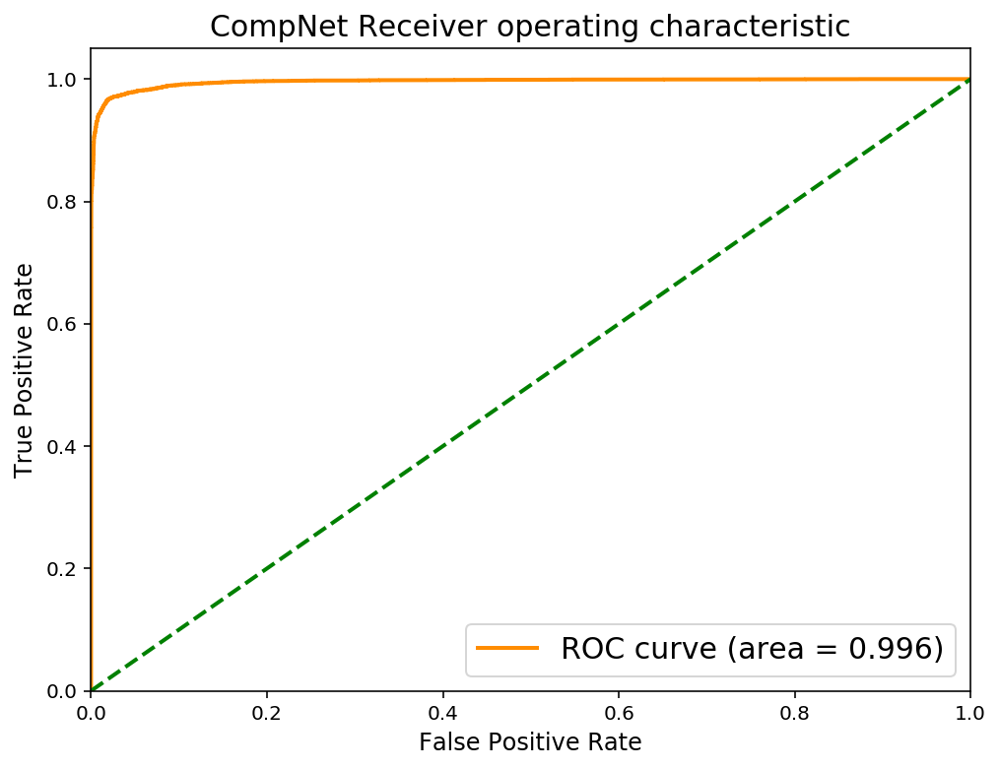

(80.60455149784684,
 125.12743000686169,
 10427.0,
 10625.0,
 390.0,
 192.0,
 677,
 10817)

In [63]:
eval_compnet(ens_compnet_ensemble, pn_train_encoding_ds)

------------------ Evaluation Report ------------------
Total Accuracy: 0.9531312325488632
After 157 batches and 2507 test points

Metrics for the same class:
Avg loss: 0.15644047793689048
Precision: 0.9682605111294311
Recall: 0.9369764658954927
F1 Score: 0.952361646057166

Metrics for the diff class:
Avg loss: 0.22225219315024697
Precision: 0.9389489953632149
Recall: 0.9692859992022338
F1 Score: 0.9538763493621197


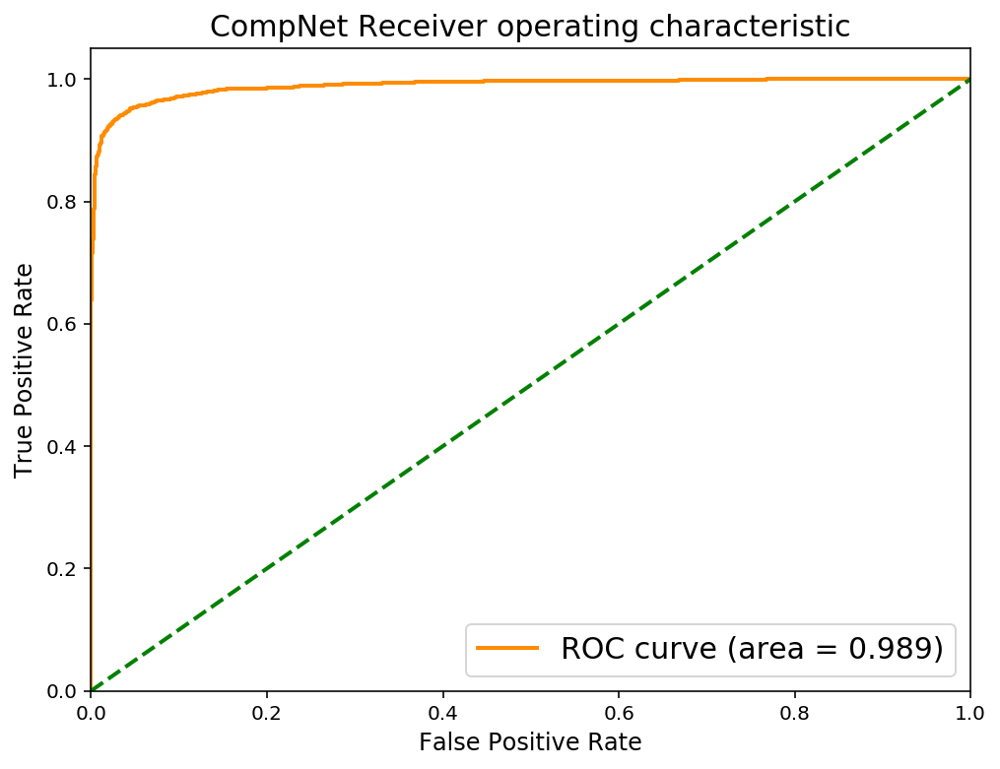

(24.561155036091805,
 34.893594324588776,
 2349.0,
 2430.0,
 158.0,
 77.0,
 157,
 2507)

In [64]:
eval_compnet(ens_compnet_ensemble, pn_test_encoding_ds)